In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import torch
from babel.dates import time_
from transformers import pipeline
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from tslearn.metrics import cdist_dtw
from scipy.stats import pearsonr
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.cluster import AgglomerativeClustering
from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder

In [12]:
full_df = pd.read_csv('final_df_with_emotions.csv')

In [13]:
print(f"Full data frame shape: {full_df.shape}")

Full data frame shape: (211940, 29)


In [14]:
# identify unique songs
df = full_df
unique_songs = df['song_artist'].unique()

# split the songs into training (80%) and remaining (20%) sets
train_songs, remaining_songs = train_test_split(
    unique_songs, test_size=0.2, random_state=42
)

# split the remaining 20% into tuning (10%) and testing (10%)
tune_songs, test_songs = train_test_split(
    remaining_songs, test_size=0.5, random_state=42
)

# create dataframes for training, tuning, and testing
train_df = df[df['song_artist'].isin(train_songs)].reset_index(drop=True)
tune_df = df[df['song_artist'].isin(tune_songs)].reset_index(drop=True)
test_df = df[df['song_artist'].isin(test_songs)].reset_index(drop=True)

sentiment_columns = ['anger', 'disgust', 'fear', 'joy', 'neutral', 'sadness', 'surprise']
top_genres = train_df['genre'].value_counts().nlargest(10).index



In [15]:
relevant_cols = ['song_artist', 'popularity', 'genre', 'window_index'] + sentiment_columns
train_df = train_df[relevant_cols]
tune_df = tune_df[relevant_cols]
test_df = test_df[relevant_cols]    


In [16]:
# overall preview of the data
train_df.describe(include='all')

,song_artist,popularity,genre,window_index,anger,disgust,fear,joy,neutral,sadness,surprise
count,169540,169540.000000,169540,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000
unique,8477,NaN,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,93 million miles - jason mraz,NaN,dance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,20,NaN,18140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,29.092014,NaN,9.500000,0.116529,0.034003,0.076758,0.139382,0.289804,0.198193,0.145330
std,NaN,16.768041,NaN,5.766298,0.216533,0.091088,0.183999,0.257432,0.290968,0.285297,0.217284
min,NaN,0.000000,NaN,0.000000,0.000375,0.000093,0.000158,0.000226,0.000164,0.000601,0.000211
25%,NaN,16.000000,NaN,4.750000,0.008442,0.002853,0.004144,0.005904,0.035011,0.018008,0.012733
50%,NaN,27.000000,NaN,9.500000,0.022748,0.007725,0.011821,0.018200,0.172973,0.054094,0.047183
75%,NaN,40.000000,NaN,14.250000,0.090836,0.023769,0.043357,0.106239,0.511330,0.237869,0.170417


In [17]:
# takes in lens on emotional sentiment column data
train_df[sentiment_columns].describe()

,anger,disgust,fear,joy,neutral,sadness,surprise
count,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000,169540.000000
mean,0.116529,0.034003,0.076758,0.139382,0.289804,0.198193,0.145330
std,0.216533,0.091088,0.183999,0.257432,0.290968,0.285297,0.217284
min,0.000375,0.000093,0.000158,0.000226,0.000164,0.000601,0.000211
25%,0.008442,0.002853,0.004144,0.005904,0.035011,0.018008,0.012733
50%,0.022748,0.007725,0.011821,0.018200,0.172973,0.054094,0.047183
75%,0.090836,0.023769,0.043357,0.106239,0.511330,0.237869,0.170417
max,0.995735,0.987877,0.996228,0.995322,0.975186,0.994649,0.986992


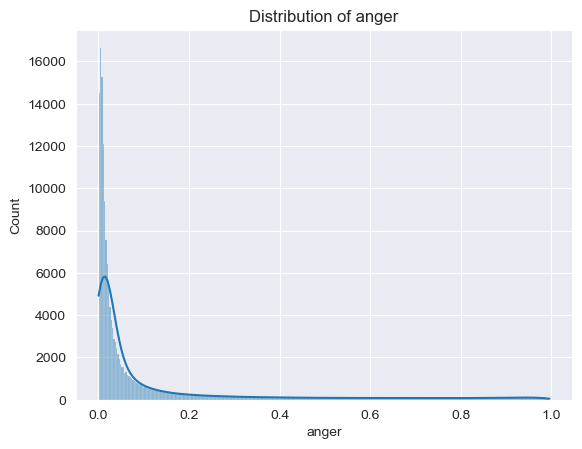

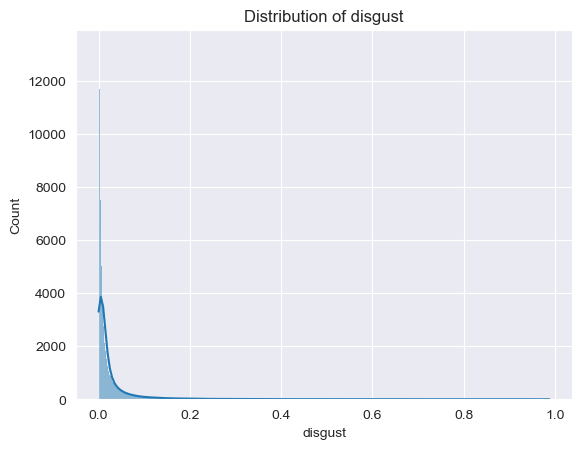

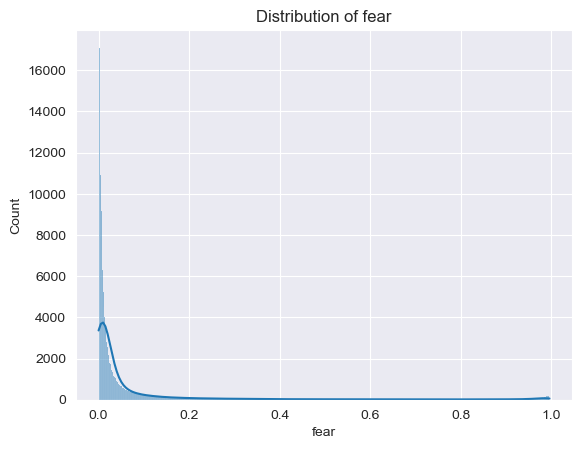

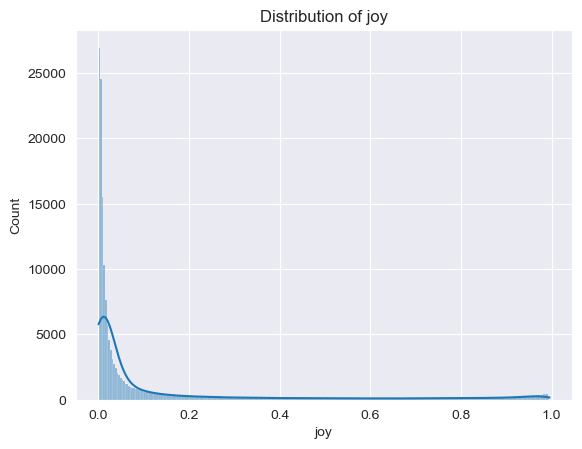

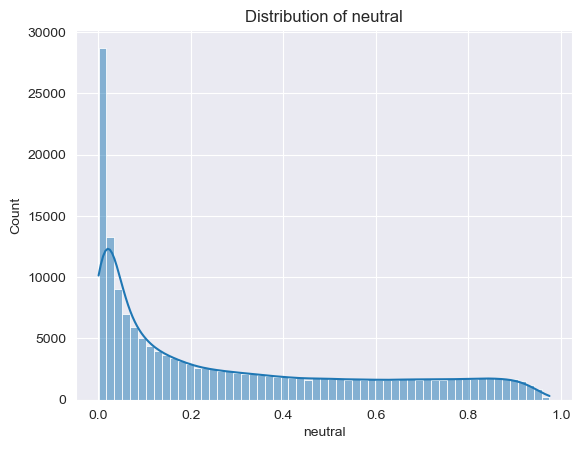

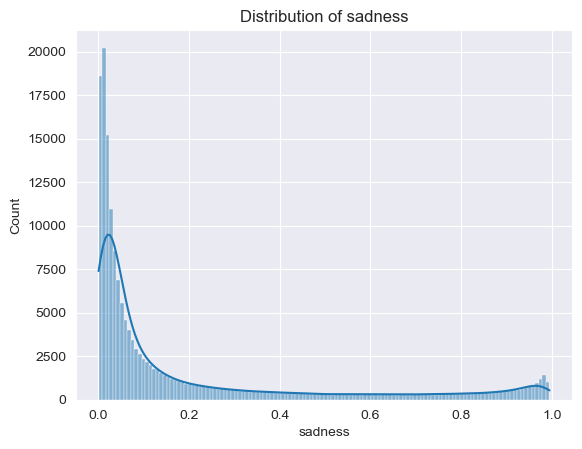

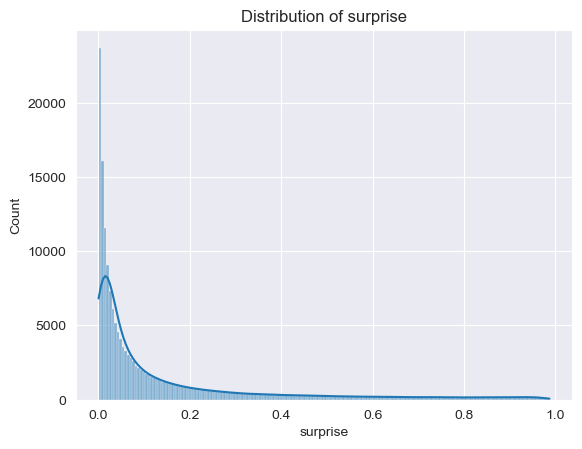

In [18]:
for col in sentiment_columns:
    sns.histplot(train_df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

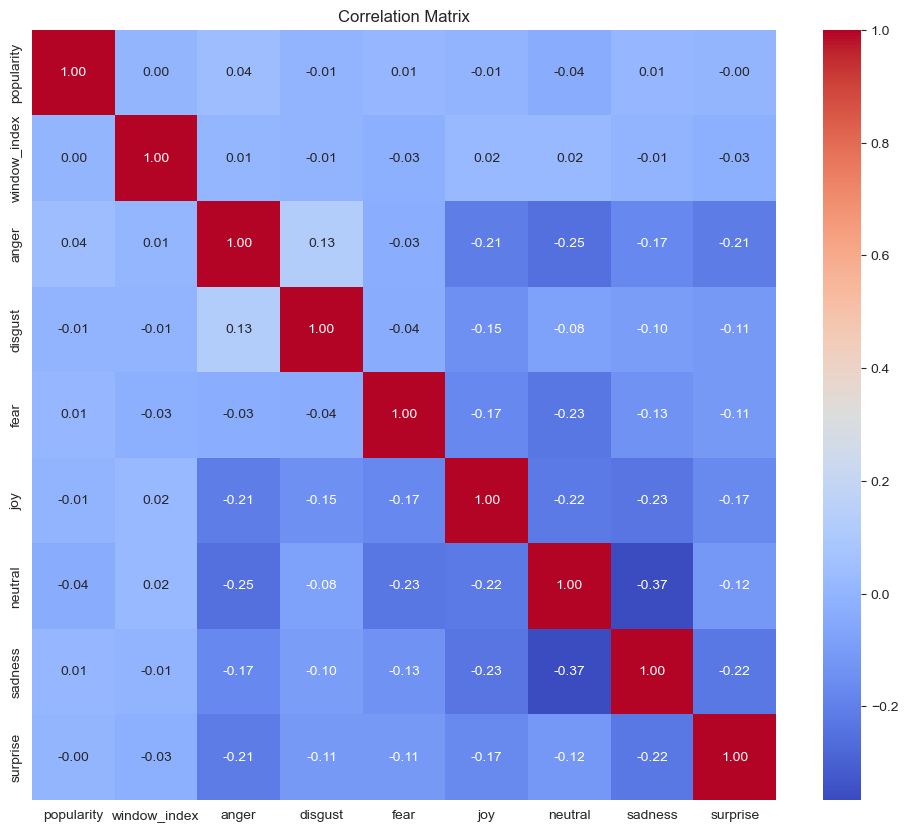

In [19]:
# select only numeric columns for the correlation calculation
numeric_df = train_df.select_dtypes(include='number')
correlation = numeric_df.corr()
plt.figure(figsize=(12, 10))  

sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

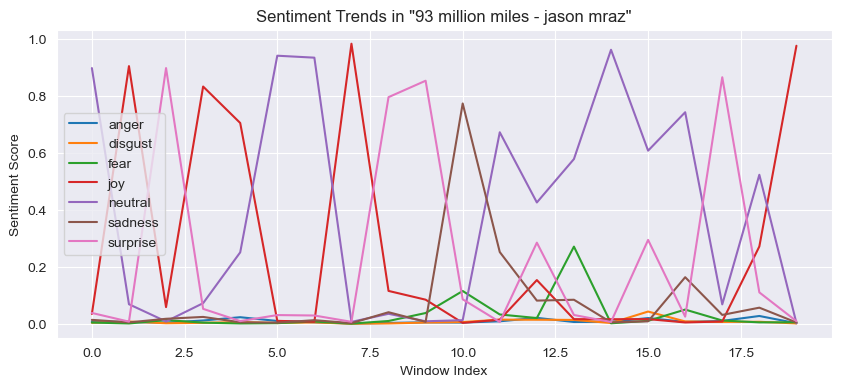

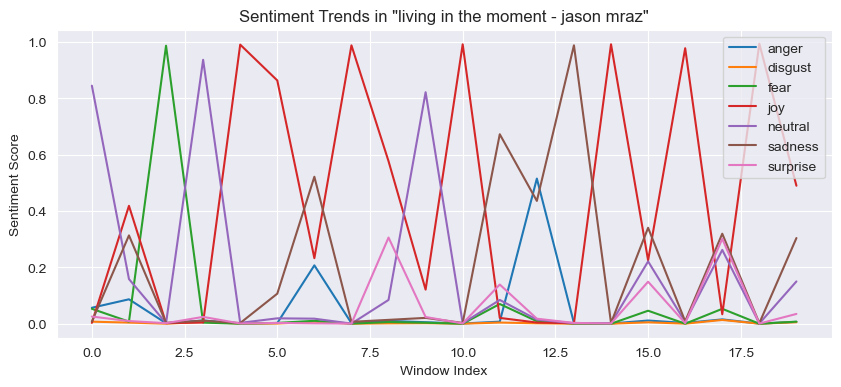

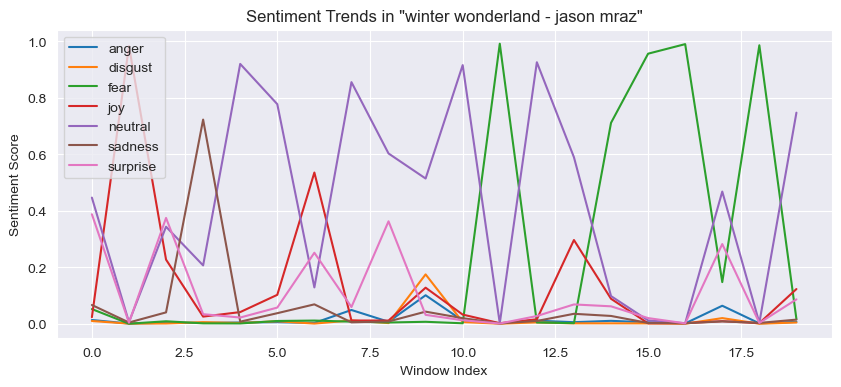

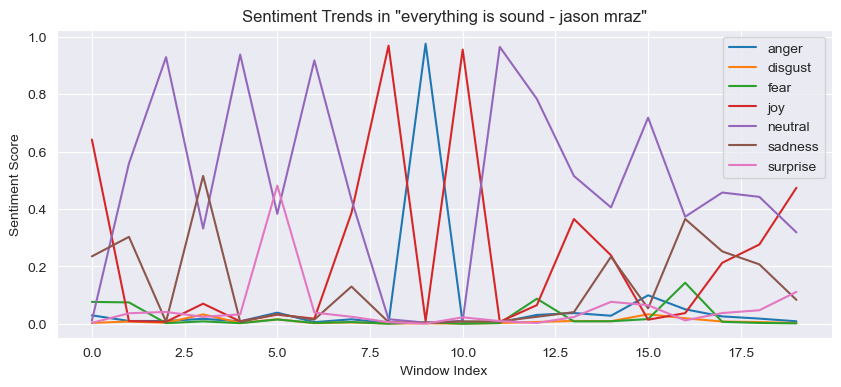

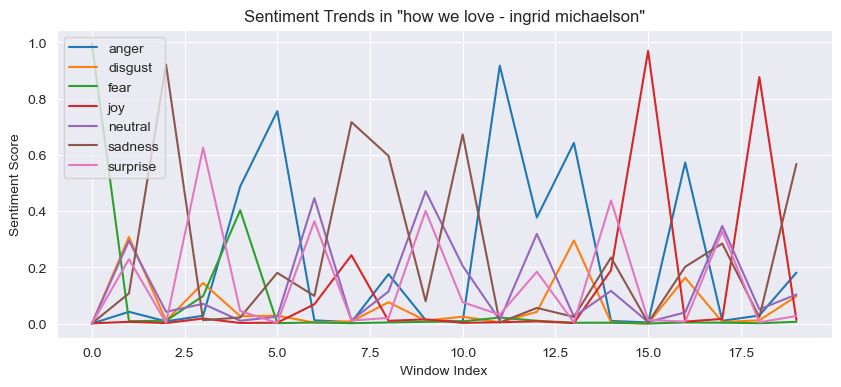

In [20]:
# plot sentiment trends for first 5 songs
for song in train_df['song_artist'].unique()[:5]:  
    song_data = train_df[train_df['song_artist'] == song]
    plt.figure(figsize=(10, 4))
    for col in sentiment_columns:
        plt.plot(song_data['window_index'], song_data[col], label=col)
    plt.title(f'Sentiment Trends in "{song}"')
    plt.xlabel('Window Index')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.show()

In [21]:
song_counts = train_df.groupby('song_artist').size()
# filter for songs that appear more than 20 times (duplicates)
duplicate_songs = song_counts[song_counts > 20]
print(duplicate_songs)

Series([], dtype: int64)


In [22]:
grouped_sentiment = train_df.groupby(['genre', 'window_index'])[sentiment_columns].mean().reset_index()
grouped_sentiment

,genre,window_index,anger,disgust,fear,joy,neutral,sadness,surprise
0,acoustic,0,0.091035,0.041061,0.089357,0.189483,0.252142,0.165661,0.171261
1,acoustic,1,0.105793,0.025040,0.047448,0.183547,0.281826,0.169364,0.186983
2,acoustic,2,0.092246,0.026764,0.084006,0.142907,0.291779,0.183366,0.178932
3,acoustic,3,0.085861,0.025084,0.056714,0.106415,0.375582,0.202368,0.147976
4,acoustic,4,0.096384,0.019651,0.091897,0.141908,0.358866,0.125150,0.166144
...,...,...,...,...,...,...,...,...,...
1015,trip-hop,15,0.105511,0.016023,0.116005,0.095534,0.265825,0.232483,0.168619
1016,trip-hop,16,0.064992,0.020252,0.029115,0.185951,0.323745,0.169810,0.206135
1017,trip-hop,17,0.068883,0.062213,0.062467,0.129169,0.416876,0.123448,0.136945
1018,trip-hop,18,0.126894,0.047514,0.047164,0.063631,0.390866,0.185595,0.138337


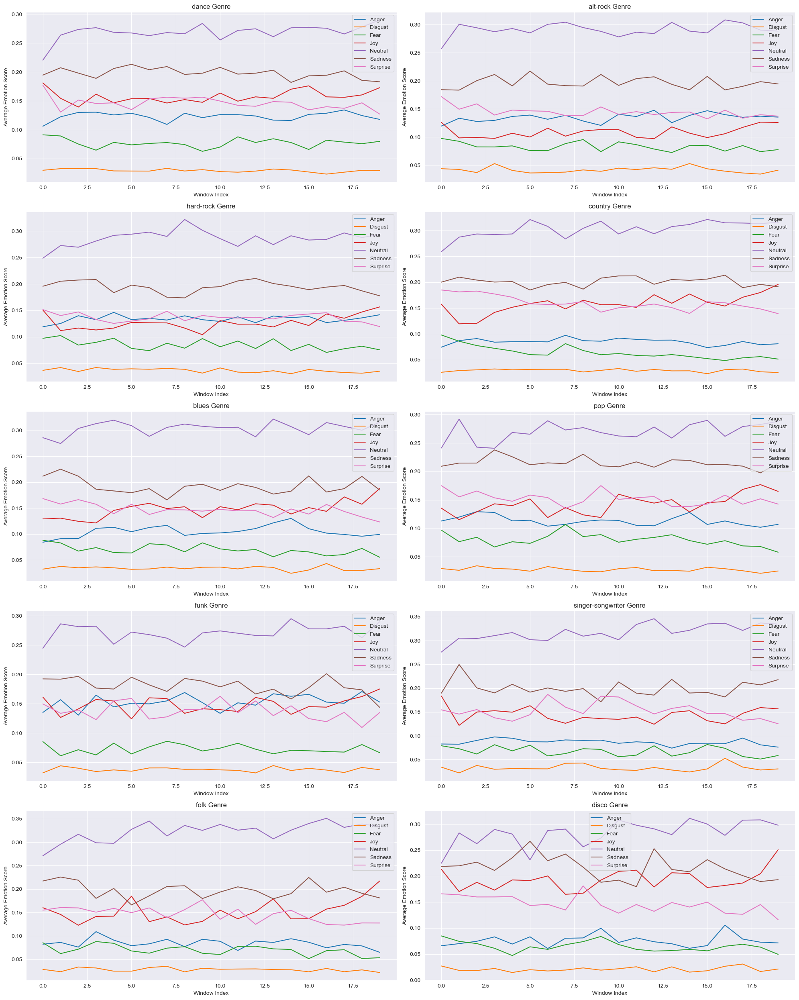

In [23]:
# VISUALIZE top 10 Genres
top_genres = train_df['genre'].value_counts().nlargest(10).index

def plot_average_emotion_trajectories_grid(df):
    rows, cols = 5, 2
    fig, axes = plt.subplots(rows, cols, figsize=(20, 25))
    axes = axes.flatten() 

    # plot each genre in its respective subplot
    for i, genre in enumerate(top_genres):
        genre_df = df[df['genre'] == genre]
        averaged = genre_df.groupby('window_index')[sentiment_columns].mean()

        ax = axes[i]
        for emotion in sentiment_columns:
            ax.plot(averaged.index, averaged[emotion], label=emotion.capitalize())
        
        ax.set_title(f'{genre} Genre')
        ax.set_xlabel('Window Index')
        ax.set_ylabel('Average Emotion Score')
        ax.legend()

    for i in range(len(top_genres), len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

plot_average_emotion_trajectories_grid(train_df)


In [24]:
# continue EDA on sentiment data -> similarity between genres
def compute_genre_similarity(df):
    similarity_matrix = pd.DataFrame(index=top_genres, columns=top_genres, dtype=float)
    
    for i, genre1 in enumerate(top_genres):
        for j, genre2 in enumerate(top_genres):
            if i <= j:
                similarities = []
                for emotion in sentiment_columns:
                    traj1 = df[df['genre'] == genre1].groupby('window_index')[emotion].mean()
                    traj2 = df[df['genre'] == genre2].groupby('window_index')[emotion].mean()
                    corr, _ = pearsonr(traj1, traj2)
                    similarities.append(corr)
                average_similarity = sum(similarities) / len(similarities)
                similarity_matrix.loc[genre1, genre2] = average_similarity
                similarity_matrix.loc[genre2, genre1] = average_similarity
    
    return similarity_matrix

similarity_matrix = compute_genre_similarity(df)
print(similarity_matrix)

genre                 dance  alt-rock  hard-rock   country     blues  \
genre                                                                  
dance              1.000000  0.442543   0.377225  0.321450  0.125604   
alt-rock           0.442543  1.000000   0.374731  0.292138  0.281360   
hard-rock          0.377225  0.374731   1.000000  0.416373  0.420262   
country            0.321450  0.292138   0.416373  1.000000  0.459069   
blues              0.125604  0.281360   0.420262  0.459069  1.000000   
pop                0.256205  0.209126   0.285034  0.301466  0.205097   
funk               0.267294  0.152457   0.172395  0.159993  0.272028   
singer-songwriter  0.261669  0.119683   0.252109  0.183936  0.242094   
folk               0.343688  0.219352   0.267916  0.377850  0.379516   
disco              0.318057  0.329757   0.277878  0.327478  0.217217   

genre                   pop      funk  singer-songwriter      folk     disco  
genre                                                   

In [25]:
# now perform DTW analysis
def prepare_time_series(genre_df, sentiment_cols, n_windows=20):
    genre_df_sorted = genre_df.sort_values(['song_artist', 'window_index'])
    grouped = genre_df_sorted.groupby('song_artist')
    complete_songs = grouped.filter(lambda x: len(x) == n_windows)['song_artist'].unique()
    time_series_list = []
    valid_songs = []
    for song in complete_songs:
        song_data = genre_df_sorted[genre_df_sorted['song_artist'] == song].sort_values('window_index')
        emotions = song_data[sentiment_cols].values  
        time_series_list.append(emotions)
        valid_songs.append(song)
    time_series_array = np.array(time_series_list)  
    return time_series_array, valid_songs

Preparing tuning data for genre: dance
Preparing tuning data for genre: alt-rock
Preparing tuning data for genre: hard-rock
Preparing tuning data for genre: country
Preparing tuning data for genre: blues
Preparing tuning data for genre: pop
Preparing tuning data for genre: funk
Preparing tuning data for genre: singer-songwriter
Preparing tuning data for genre: folk
Preparing tuning data for genre: disco


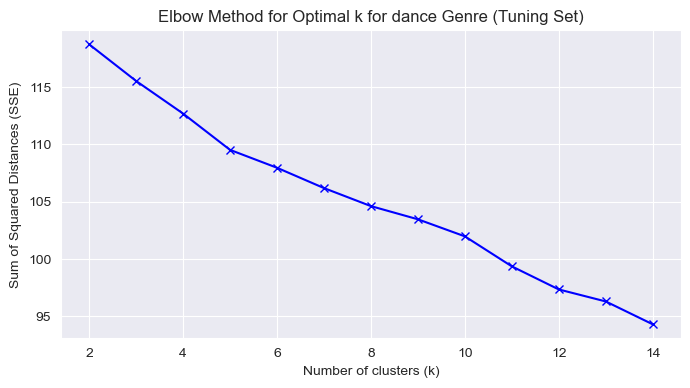

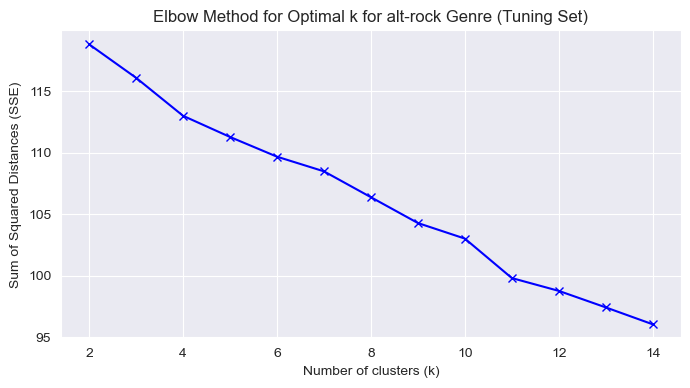

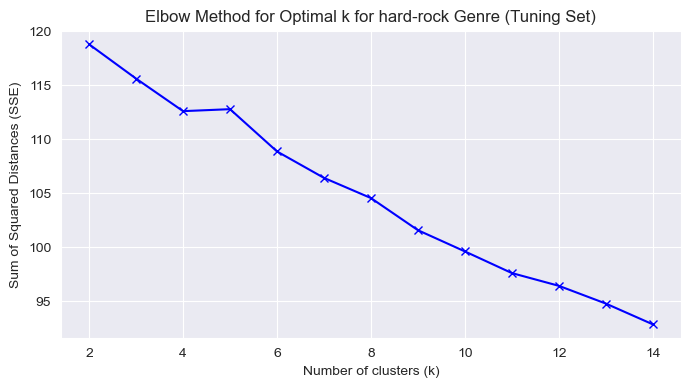

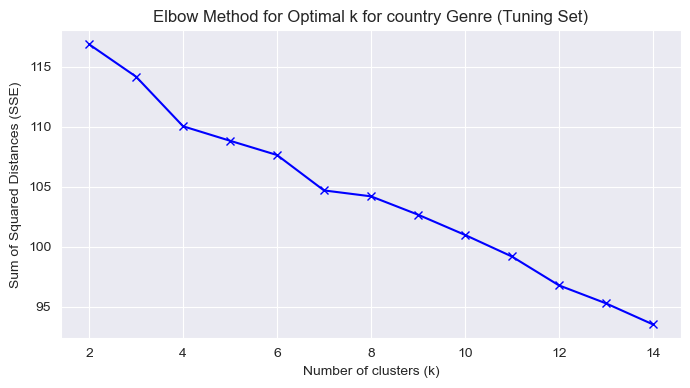

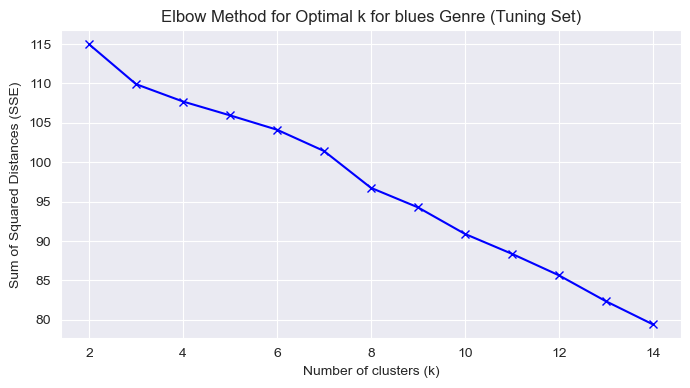

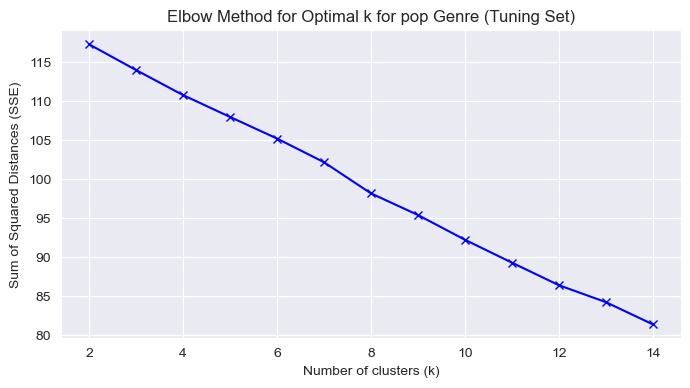

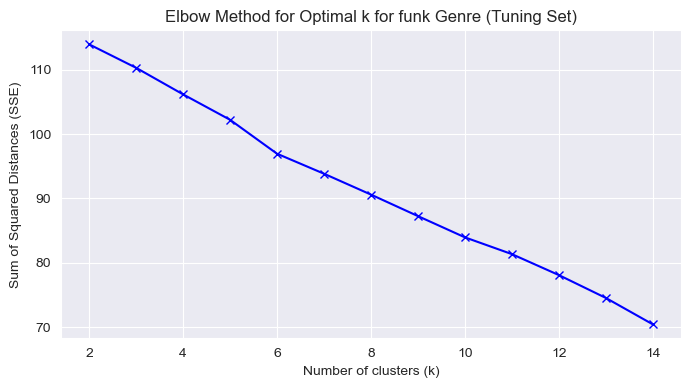

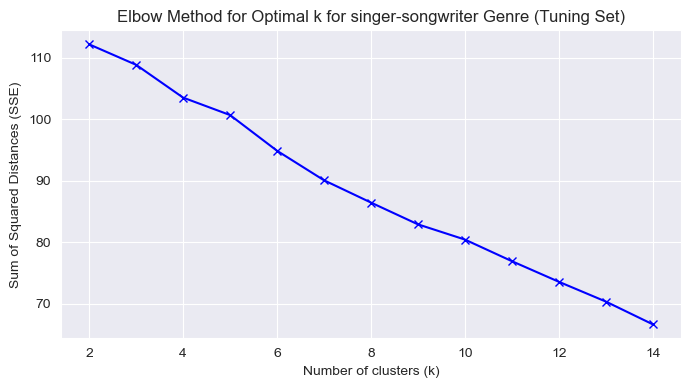

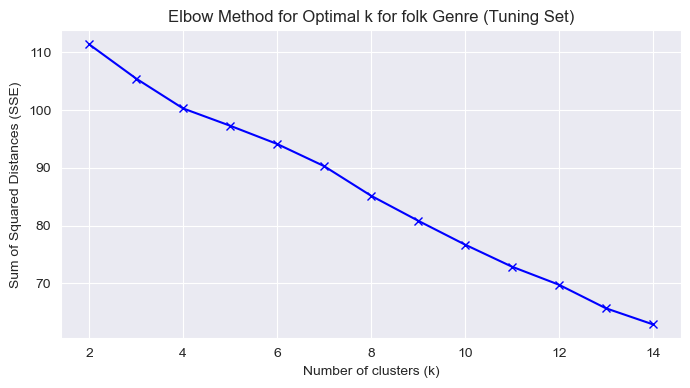

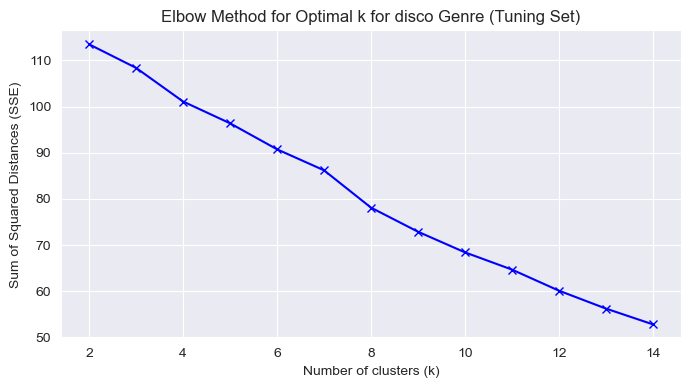

In [26]:
# prepare the time series for the tuning portion
genre_time_series_tune = {}  # store time series for the tuning set
for genre in top_genres:
    print(f"Preparing tuning data for genre: {genre}")
    genre_df_tune = tune_df[tune_df['genre'] == genre].copy()
    ts_array_tune, songs_tune = prepare_time_series(genre_df_tune, sentiment_columns, n_windows=20)
    if ts_array_tune.size == 0:
        print(f"No complete songs found for genre: {genre} in tuning set")
        continue
    scaler = TimeSeriesScalerMeanVariance()
    ts_scaled_tune = scaler.fit_transform(ts_array_tune)
    genre_time_series_tune[genre] = ts_scaled_tune

# elbow method for finding the optimal number of clusters using the tuning set
for genre in top_genres:
    sse = []  # store sum of squared errors for each number of clusters
    K = range(2, 15)  # testing cluster numbers from 2 to 15 
    
    time_series_data_tune = genre_time_series_tune[genre]  # access the time series data for the genre 
    
    # elbow method using TimeSeriesKMeans with DTW
    for k in K:
        model = TimeSeriesKMeans(n_clusters=k, metric="dtw", max_iter=10, random_state=0, n_jobs=-1)
        model.fit(time_series_data_tune)  
        sse.append(model.inertia_) 
    
    # plot elbow curve
    plt.figure(figsize=(8, 4))
    plt.plot(K, sse, 'bx-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Distances (SSE)')
    plt.title(f'Elbow Method for Optimal k for {genre} Genre (Tuning Set)')
    plt.show()


In [27]:
# Now, lets set the optimal k-values based of the tuning set. We should also look into experimenting with hyperparameters for the DTW itself, and visualising the cluster similarities on that data

# dictionary mapping each genre to its optimal k-value
optimal_k_values = {
    'dance': 5, 
    'alt-rock': 4, 
    'hard-rock': 5, 
    'country': 4, 
    'blues': 3, 
    'pop': 5, 
    'funk': 6,
    'singer-songwriter': 4, 
    'folk': 4, 
    'disco' : 4,
}

In [28]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clusters(ts_data, labels):
    # flatten each time series into a single 1D vector 
    data_2d = np.array([series.flatten() for series in ts_data])
    
    silhouette_avg = silhouette_score(data_2d, labels)
    print(f"Silhouette Score: {silhouette_avg:.4f}")
    
    calinski_harabasz_avg = calinski_harabasz_score(data_2d, labels)
    print(f"Calinski-Harabasz Index: {calinski_harabasz_avg:.4f}")
    
    davies_bouldin_avg = davies_bouldin_score(data_2d, labels)
    print(f"Davies-Bouldin Index: {davies_bouldin_avg:.4f}")


Preparing data for genre: dance
Preparing data for genre: alt-rock
Preparing data for genre: hard-rock
Preparing data for genre: country
Preparing data for genre: blues
Preparing data for genre: pop
Preparing data for genre: funk
Preparing data for genre: singer-songwriter
Preparing data for genre: folk
Preparing data for genre: disco
Computing DTW distances for genre: dance
Computing DTW distances for genre: alt-rock
Computing DTW distances for genre: hard-rock
Computing DTW distances for genre: country
Computing DTW distances for genre: blues
Computing DTW distances for genre: pop
Computing DTW distances for genre: funk
Computing DTW distances for genre: singer-songwriter
Computing DTW distances for genre: folk
Computing DTW distances for genre: disco

Evaluating Agglomerative Clustering for Genre: dance
Silhouette Score: -0.0223
Calinski-Harabasz Index: 2.8788
Davies-Bouldin Index: 5.2070

Evaluating Agglomerative Clustering for Genre: alt-rock
Silhouette Score: -0.0163
Calinski-Har

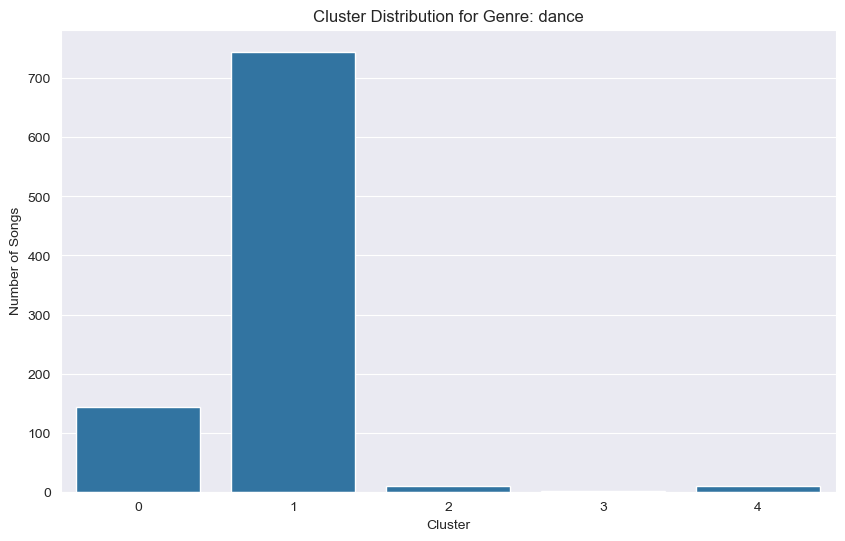

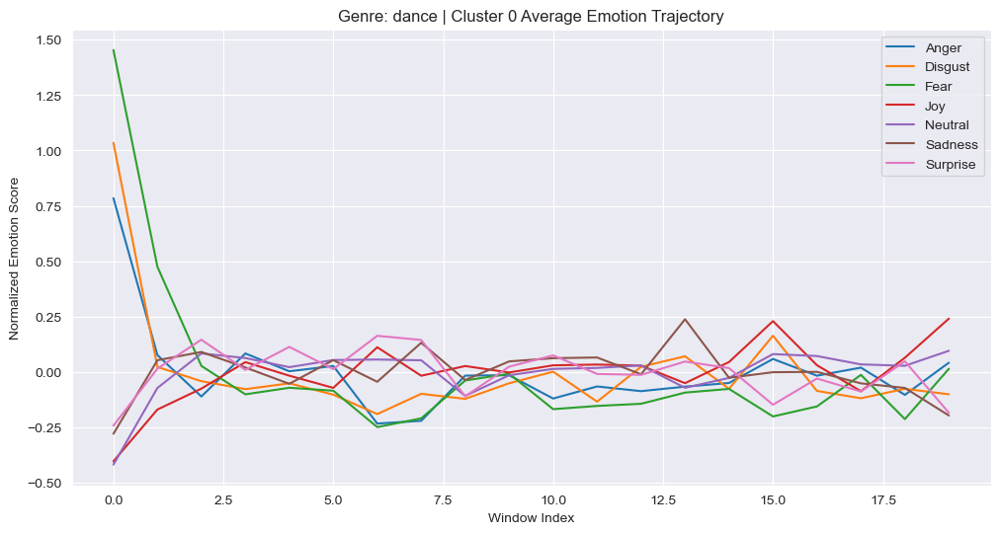

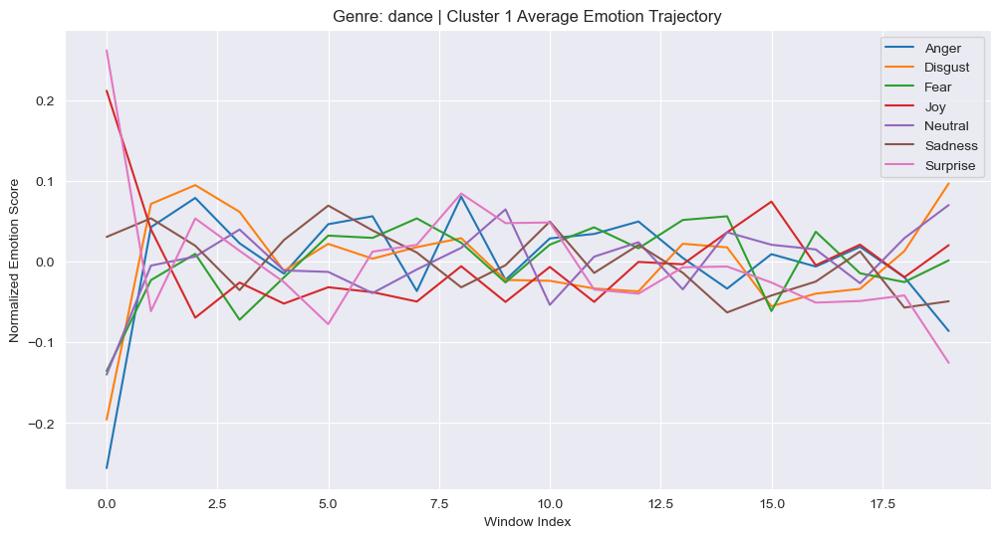

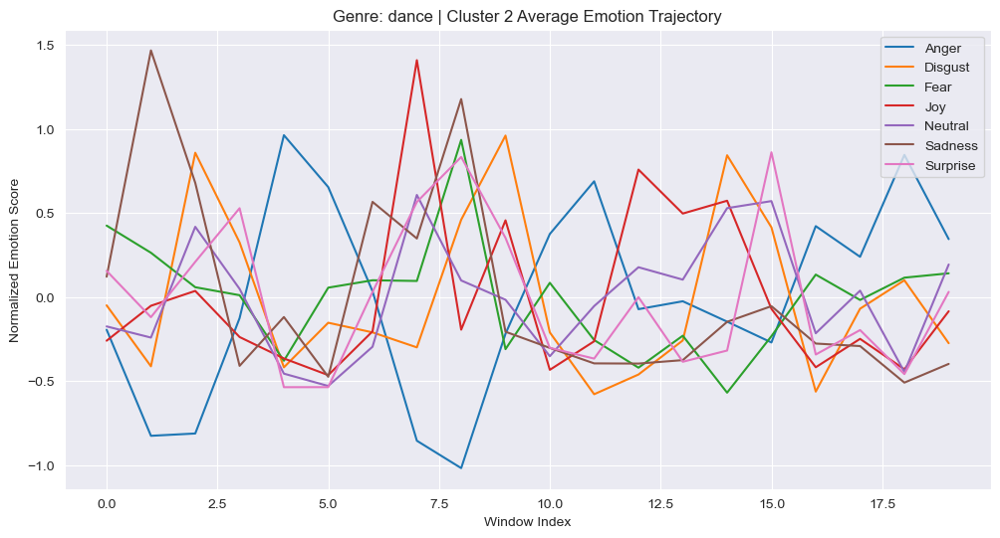

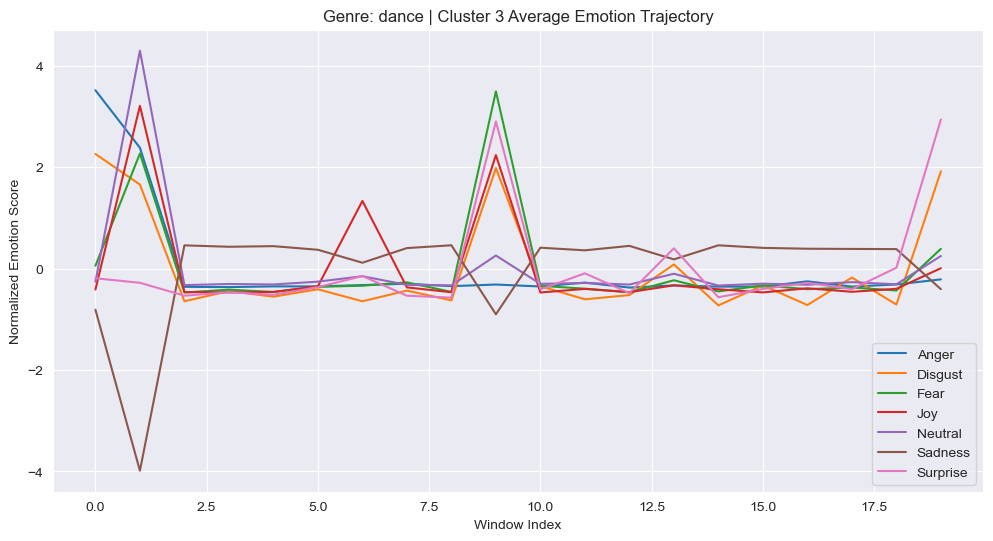

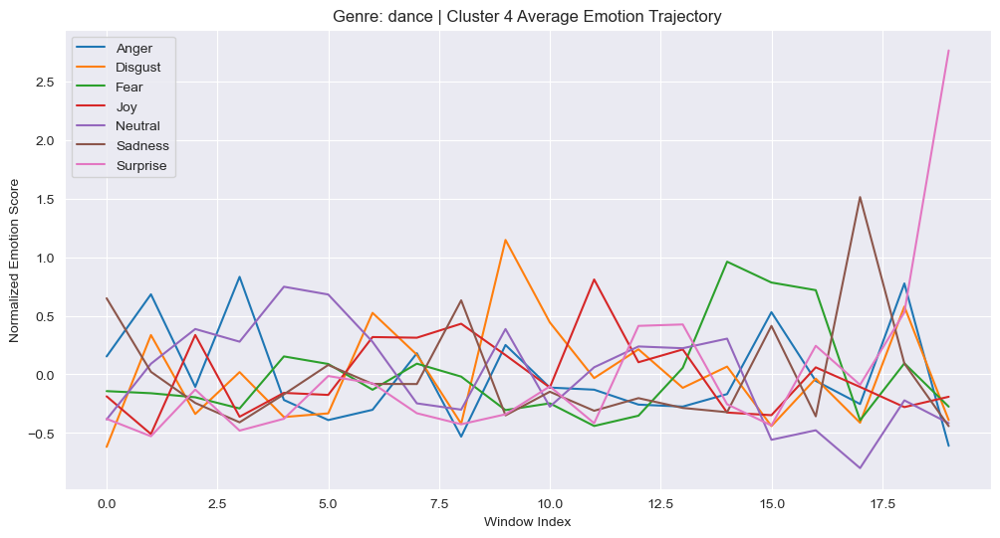

Visualizing clusters for genre: alt-rock


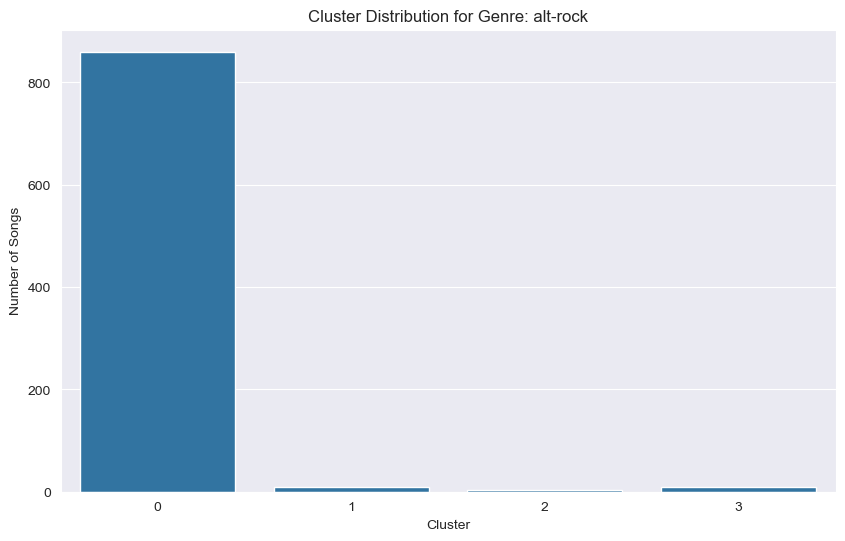

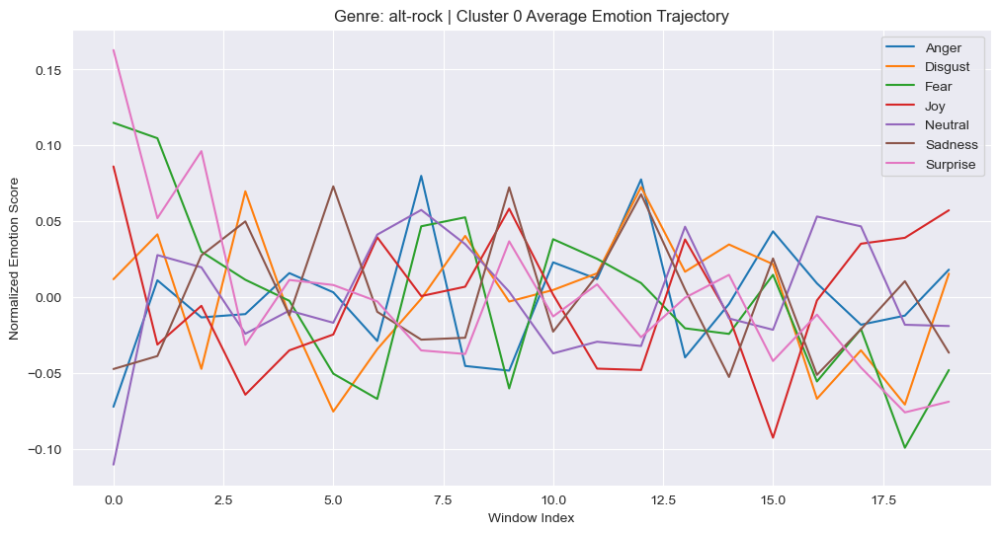

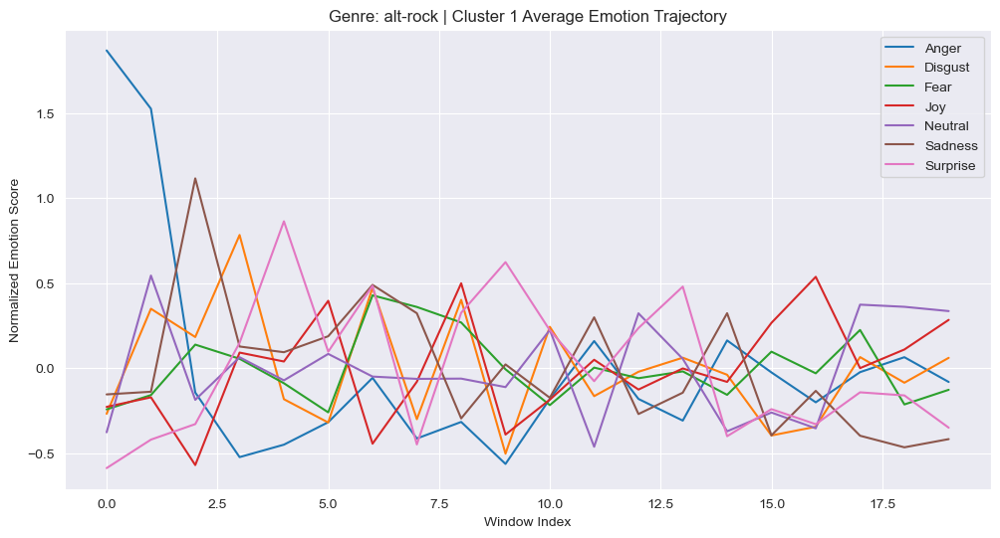

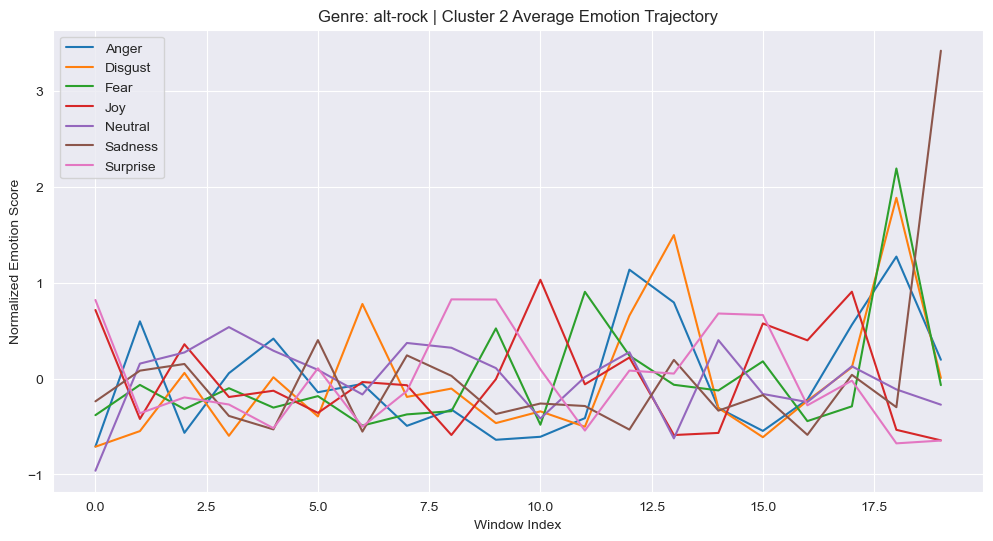

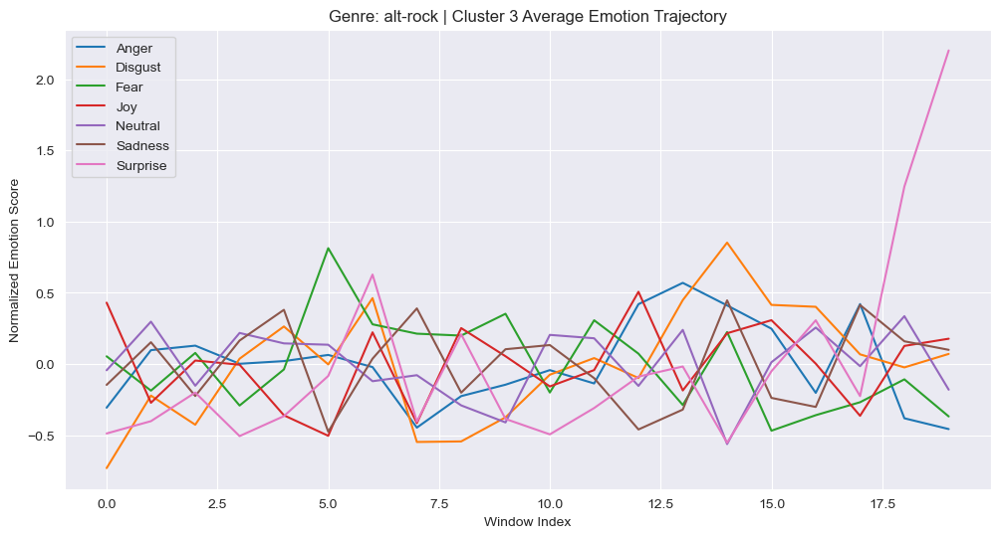

Visualizing clusters for genre: hard-rock


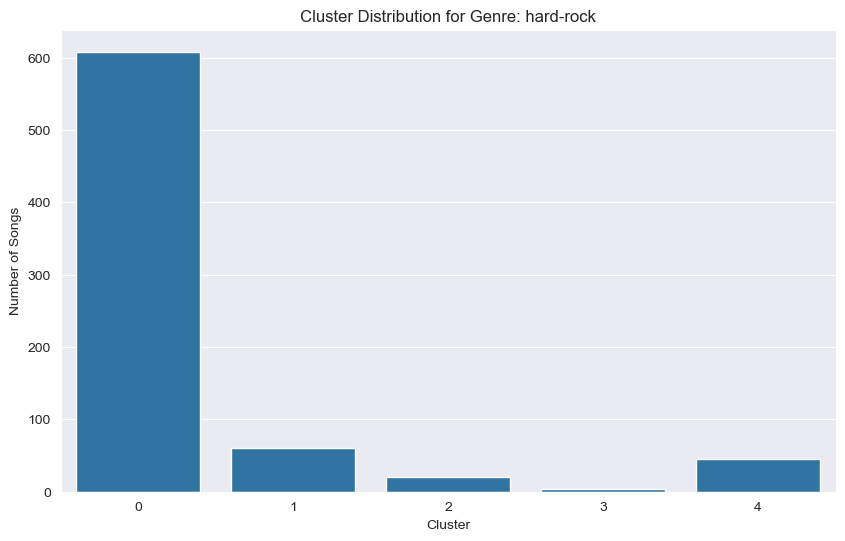

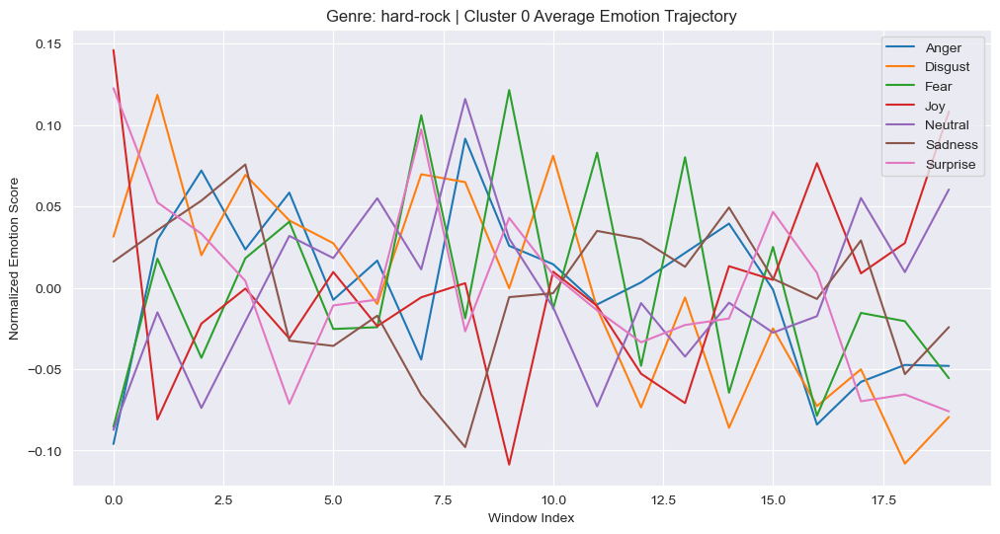

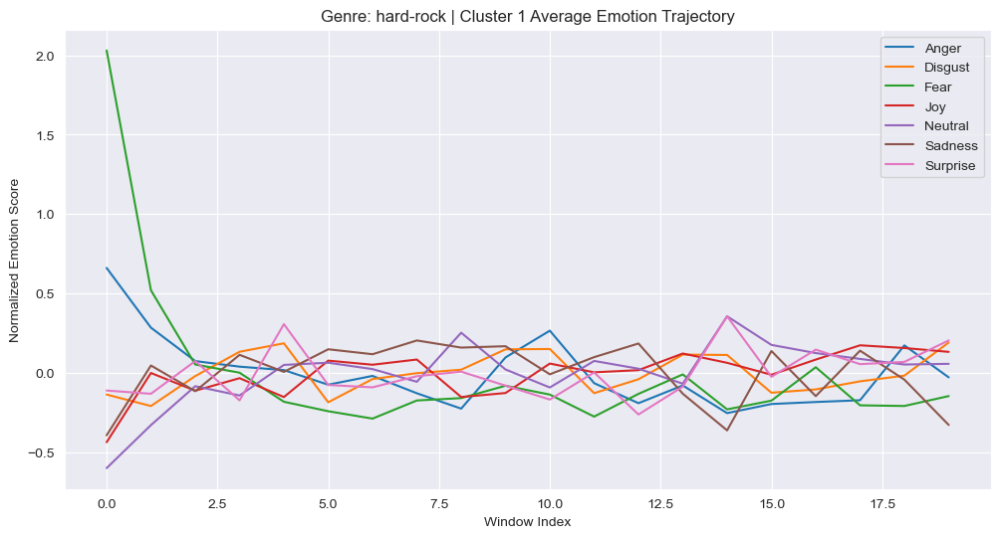

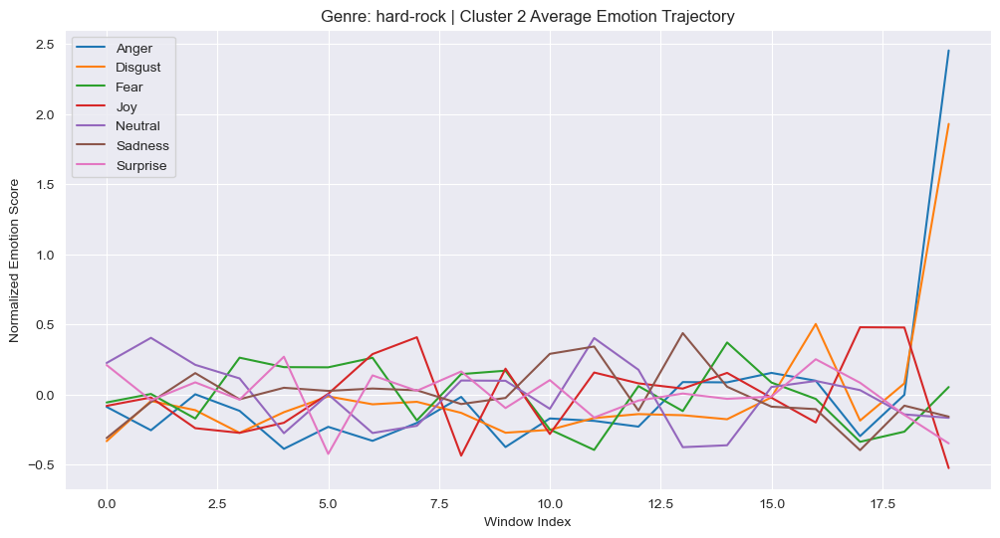

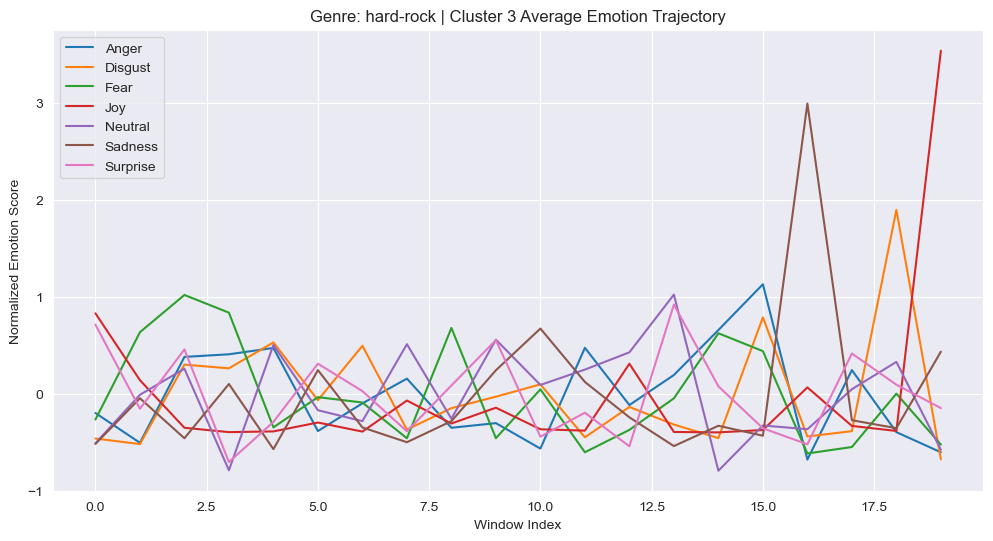

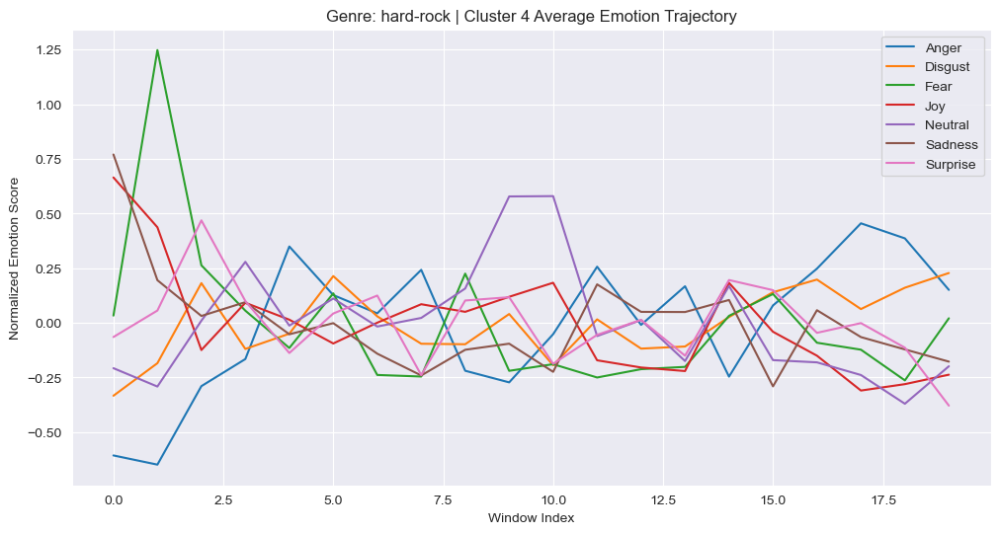

Visualizing clusters for genre: country


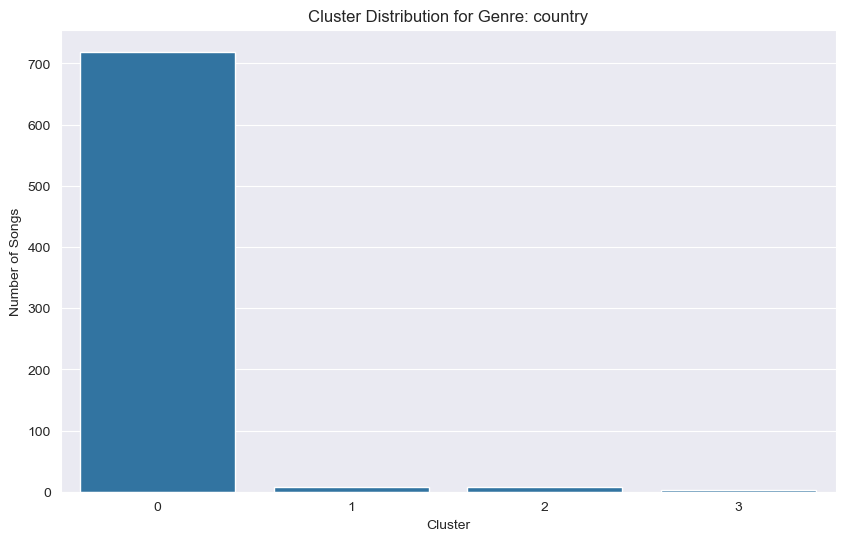

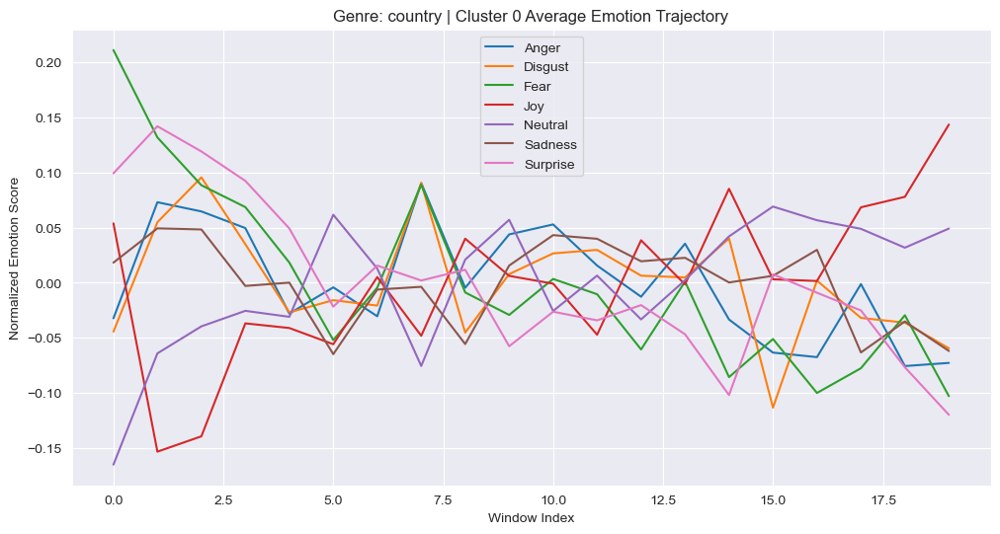

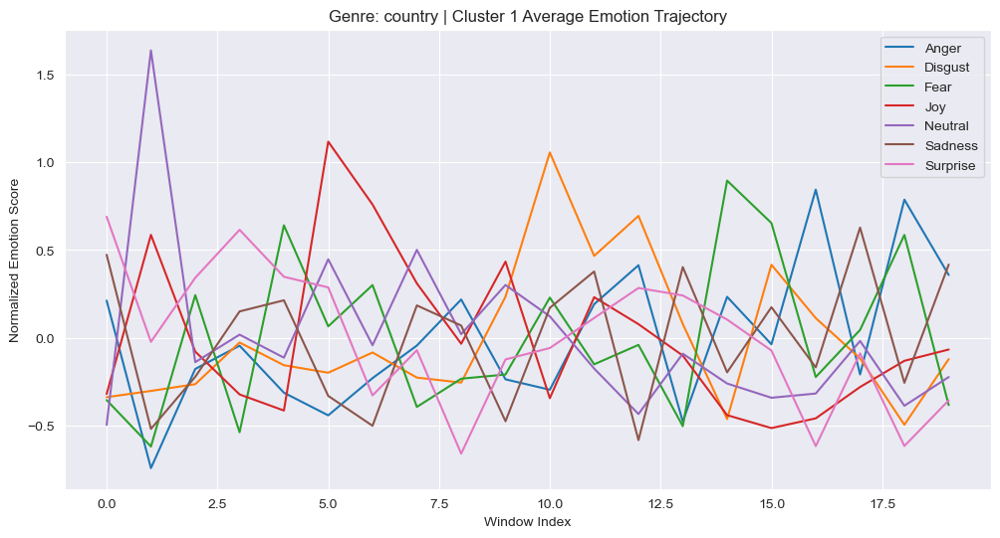

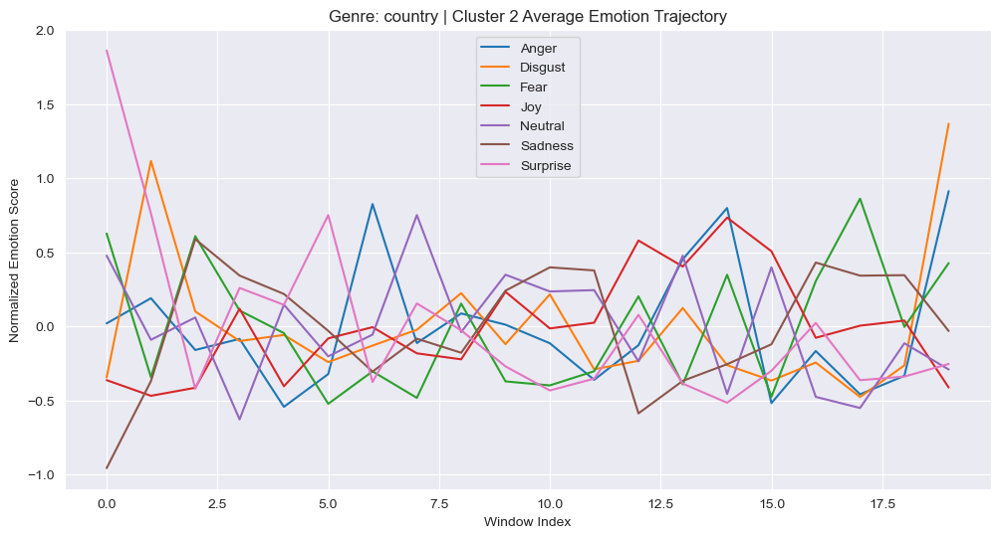

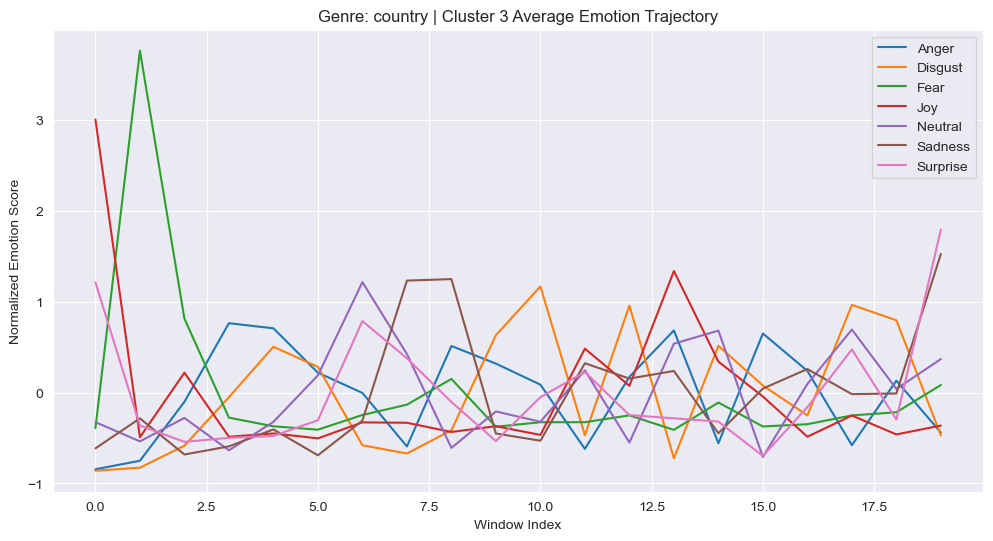

Visualizing clusters for genre: blues


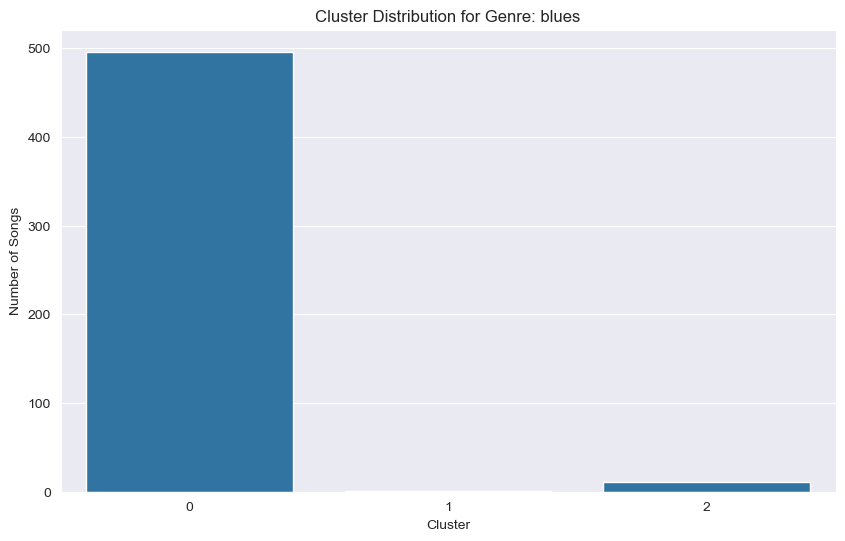

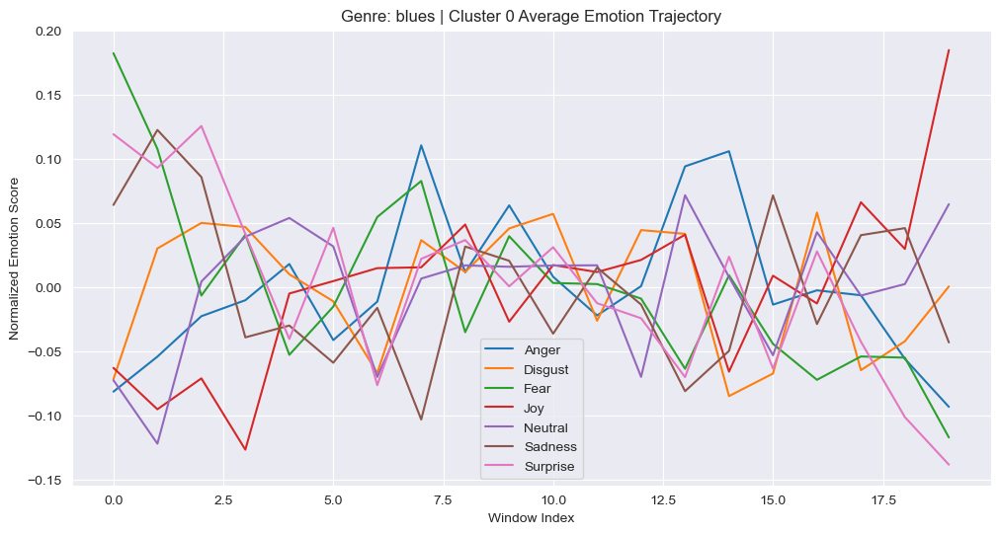

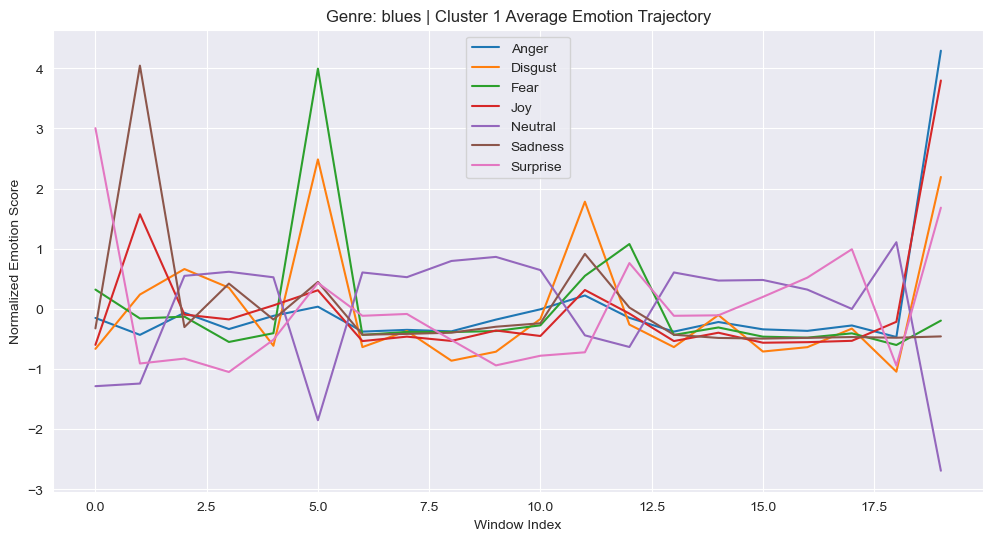

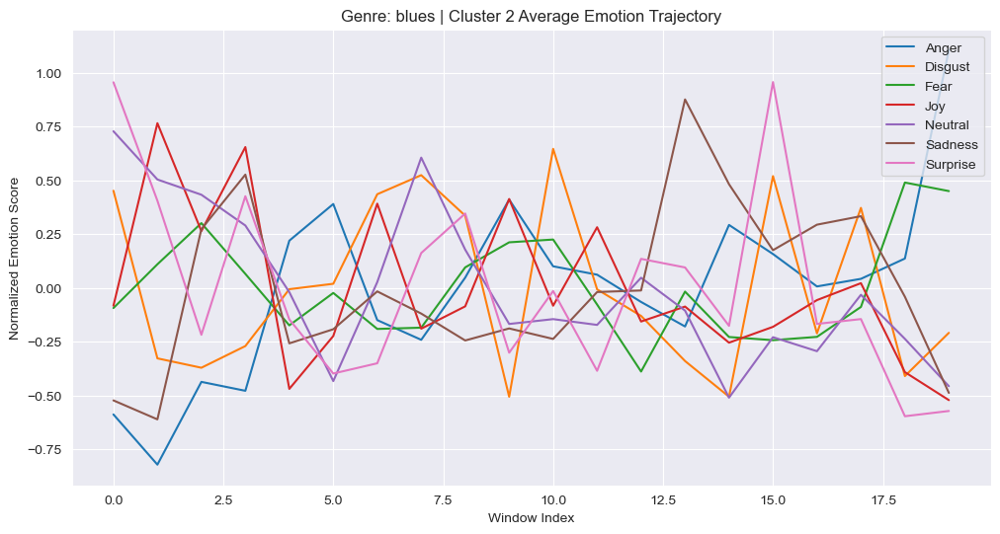

Visualizing clusters for genre: pop


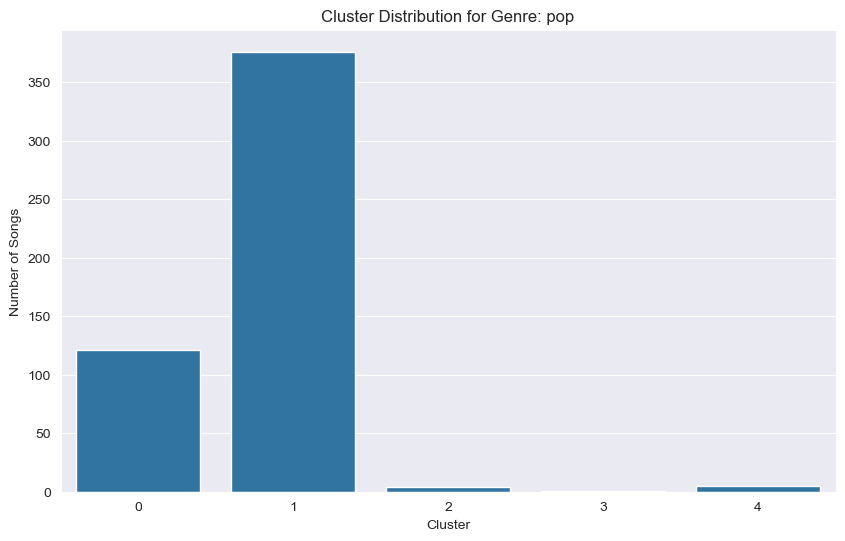

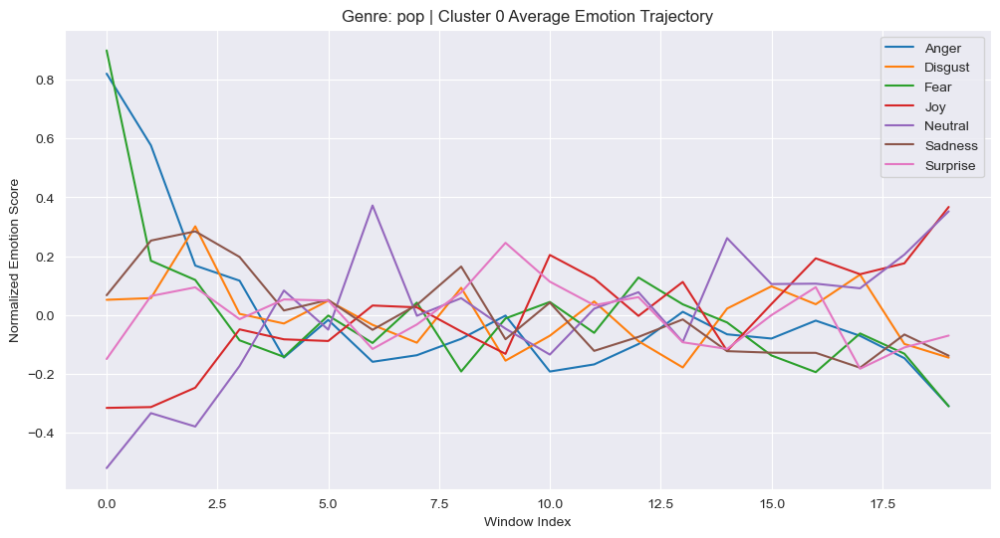

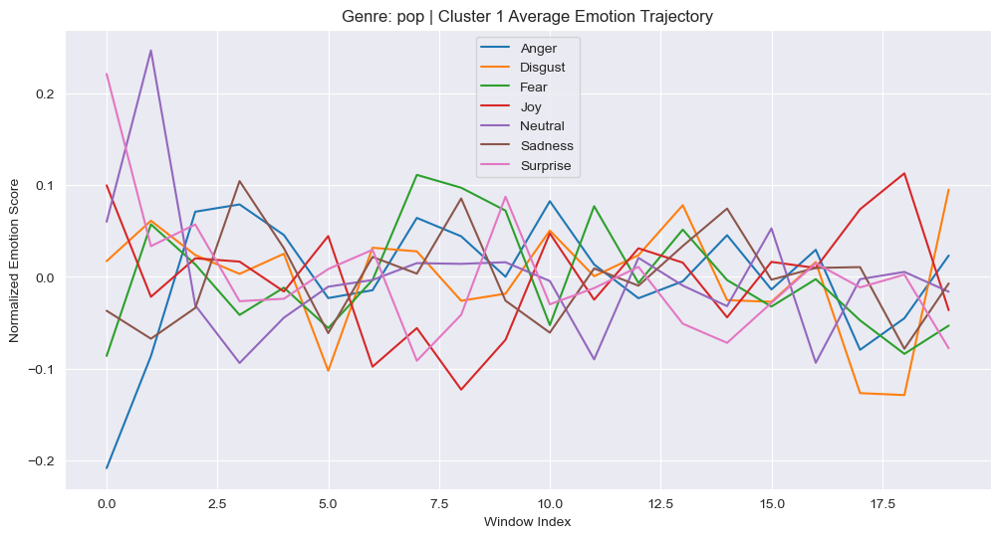

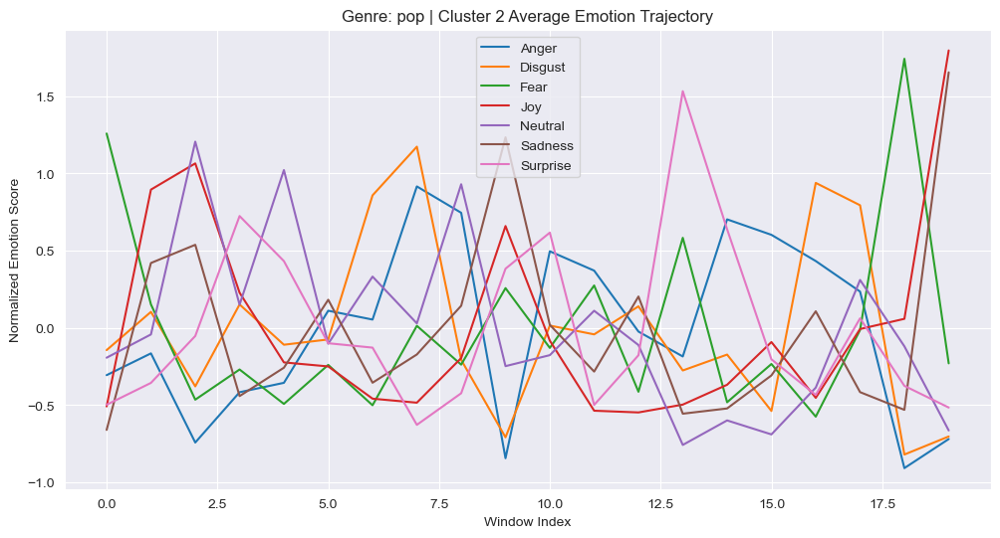

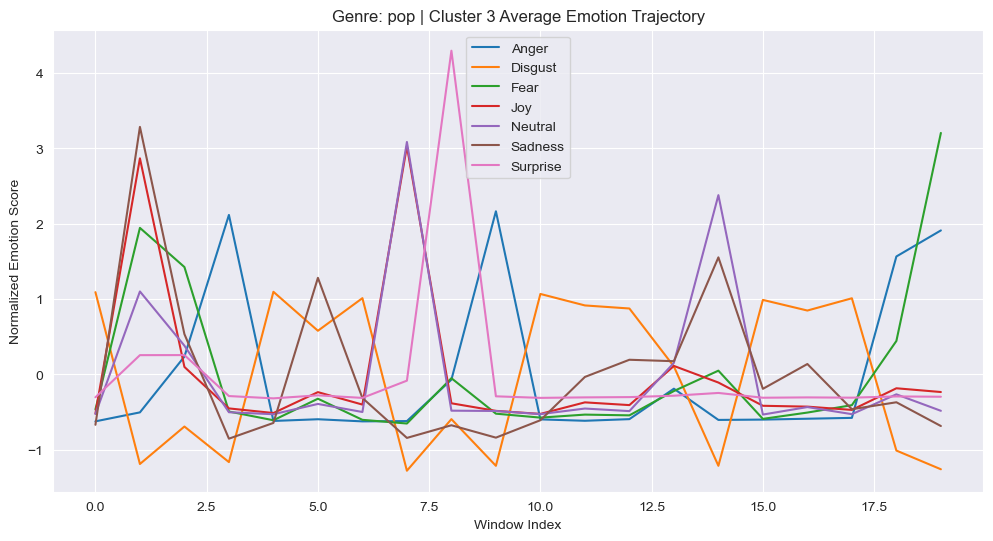

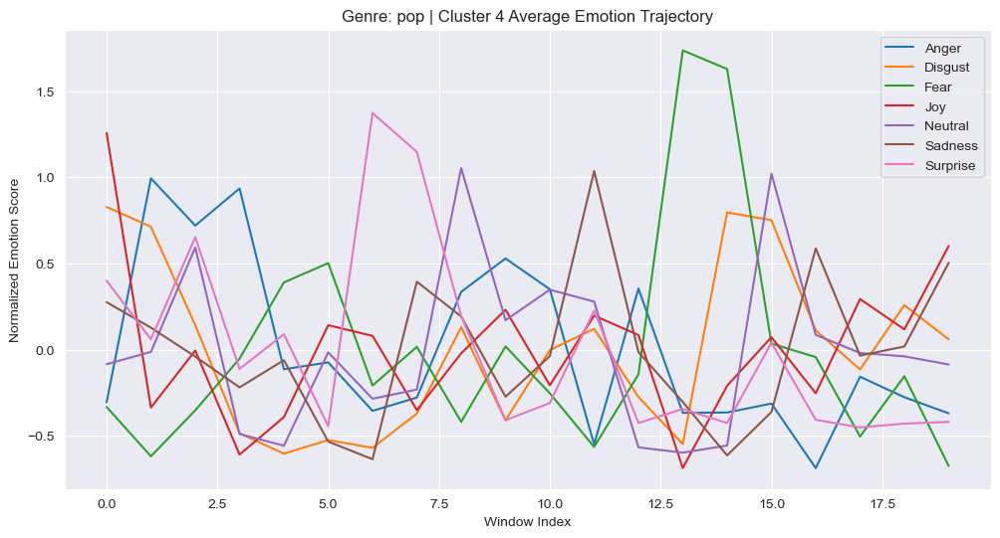

Visualizing clusters for genre: funk


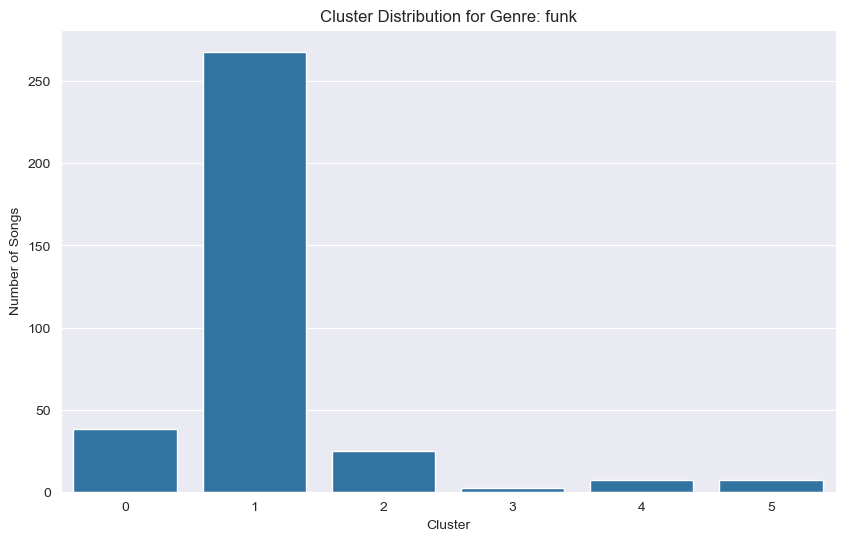

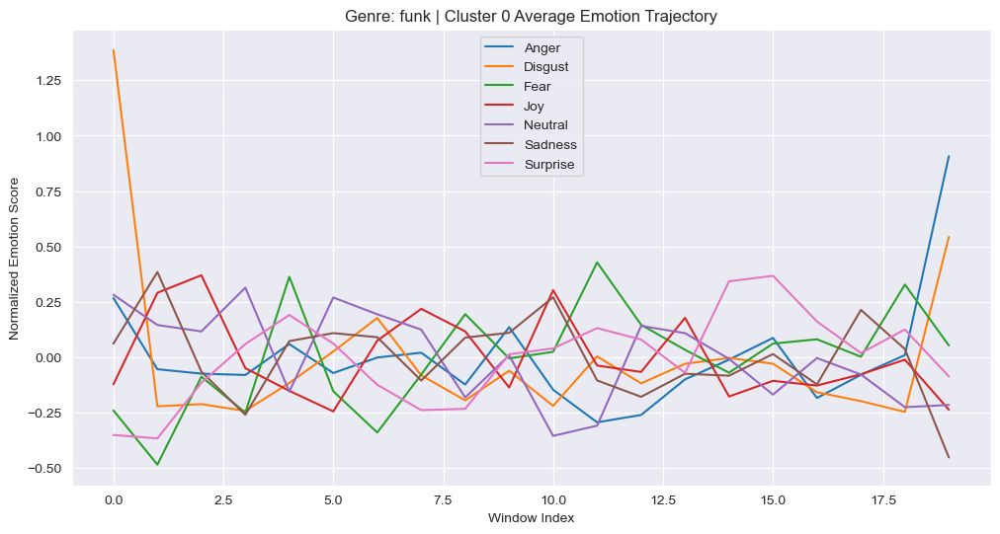

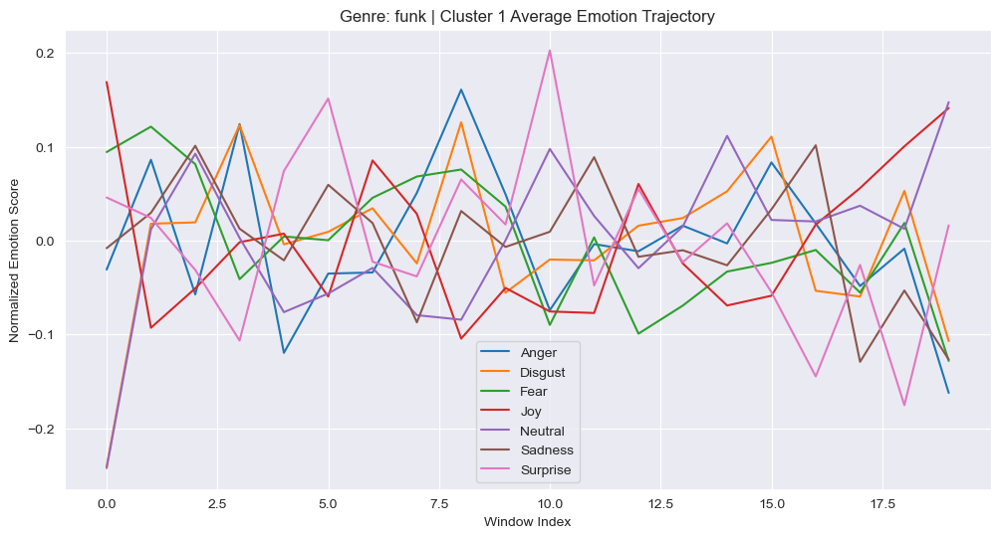

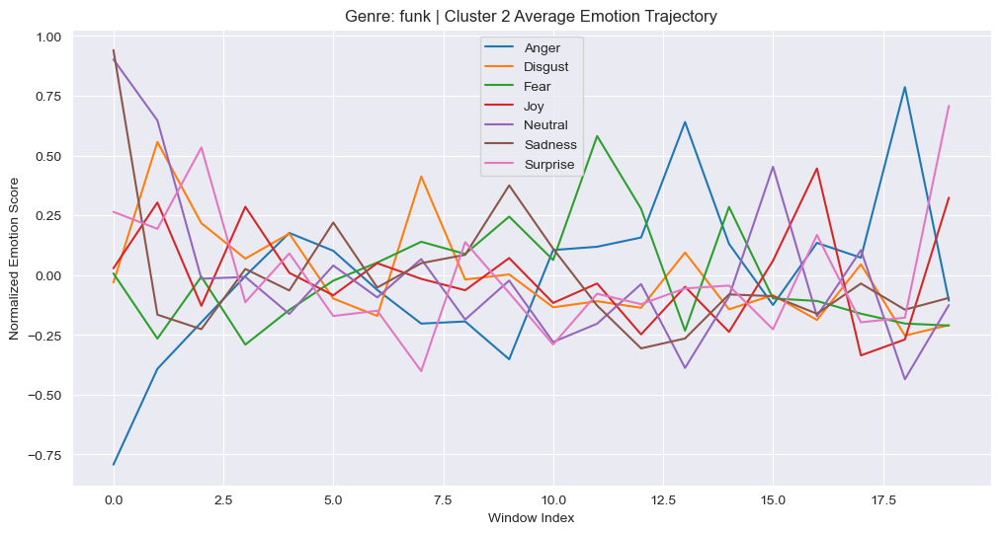

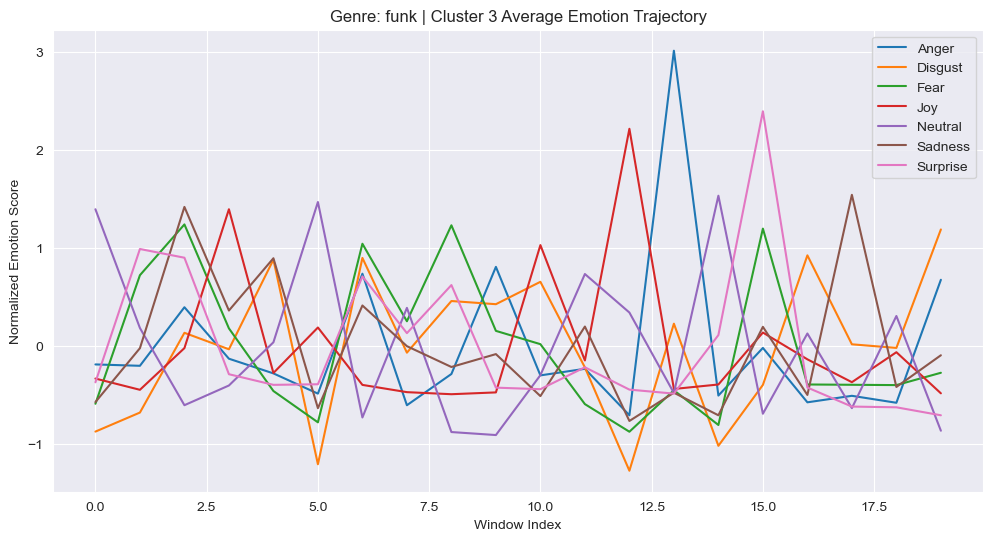

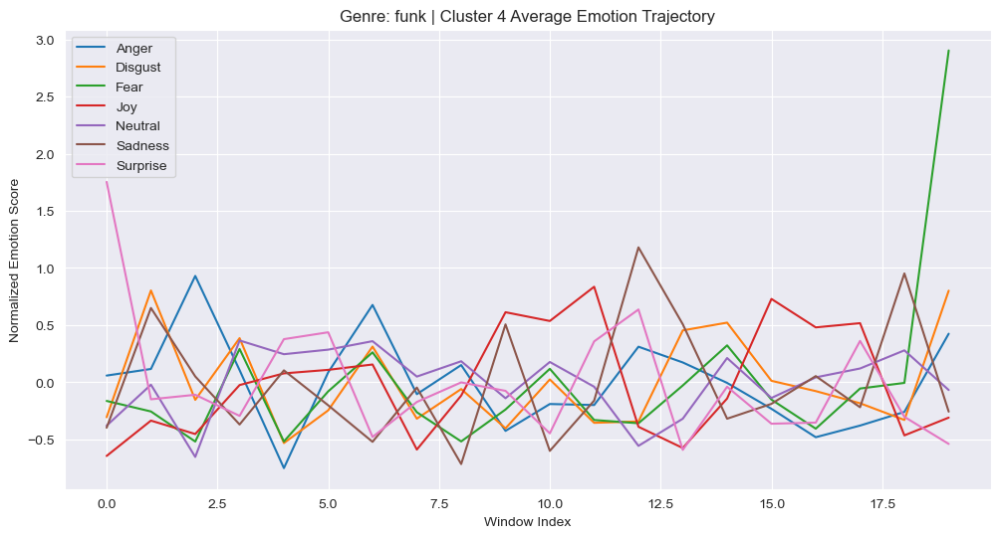

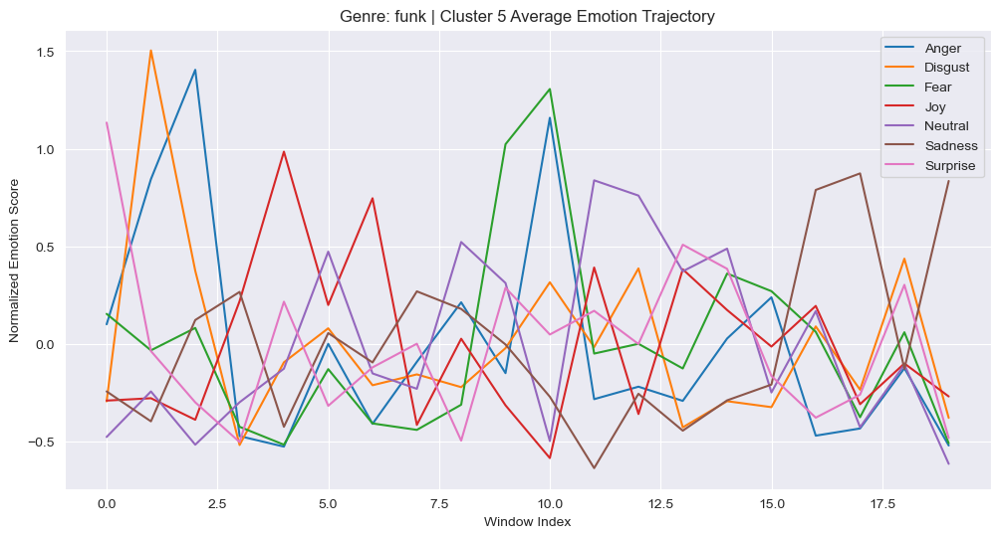

Visualizing clusters for genre: singer-songwriter


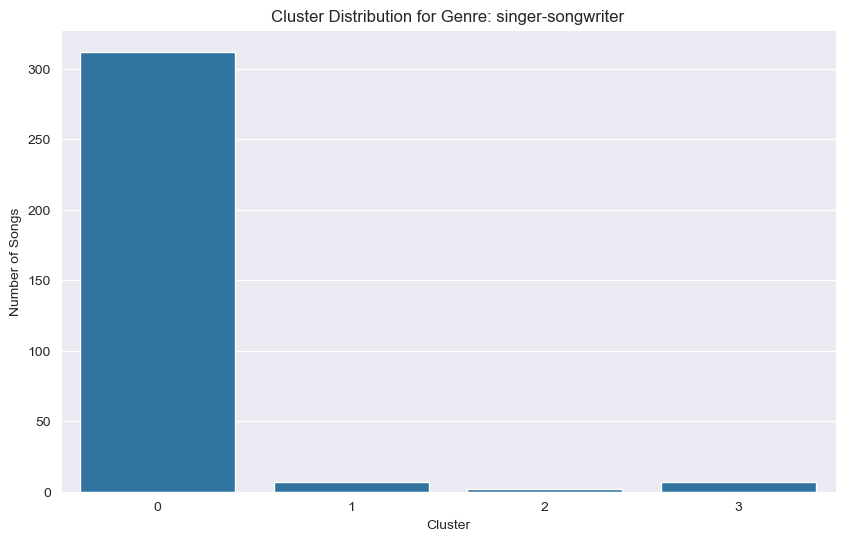

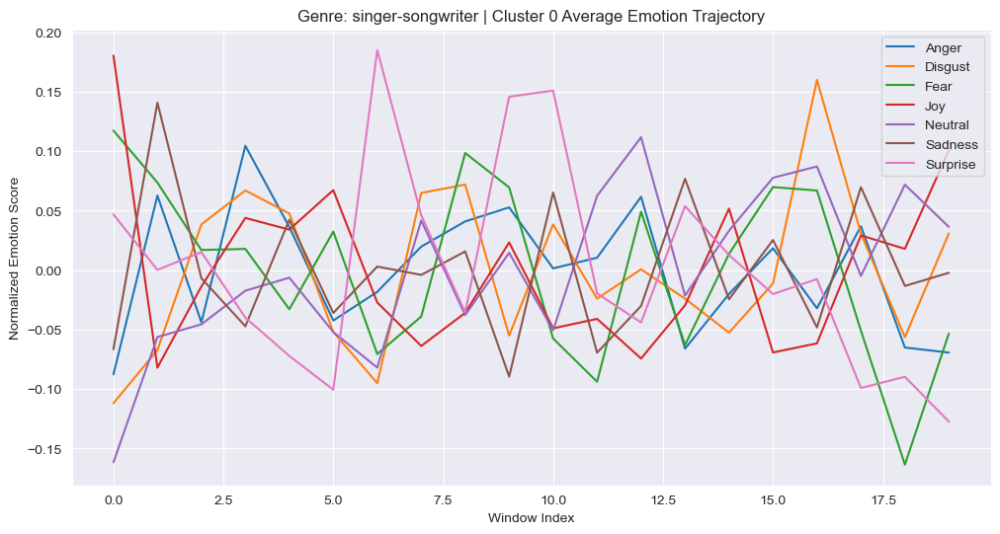

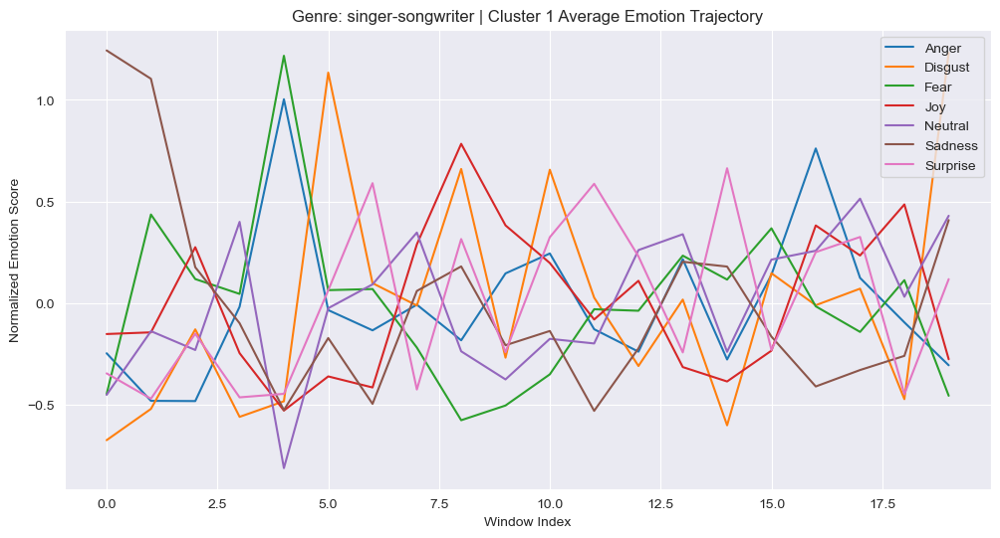

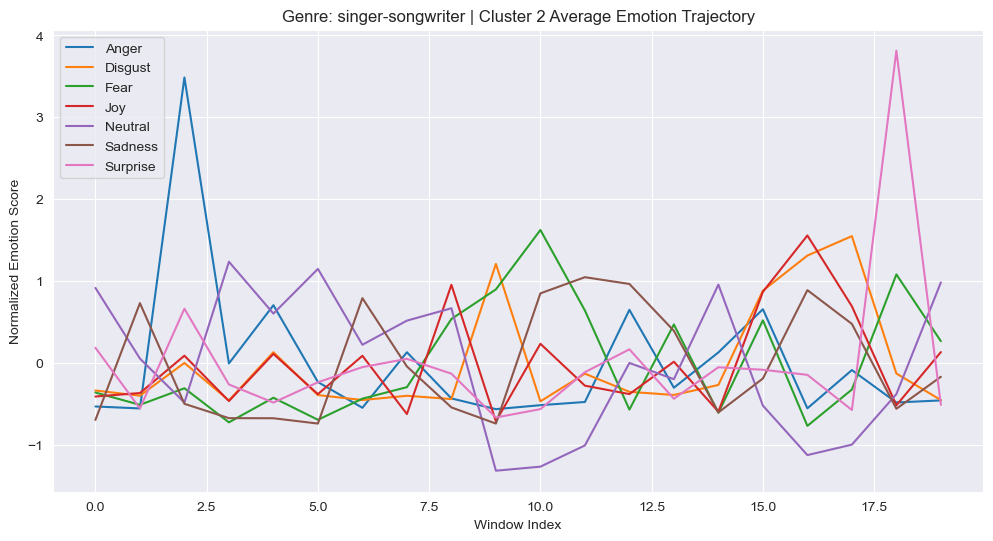

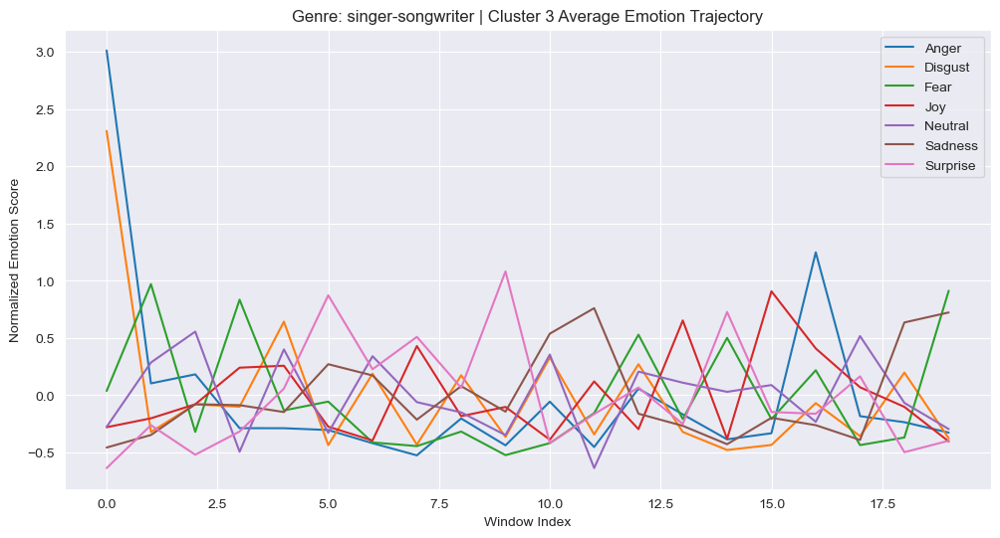

Visualizing clusters for genre: folk


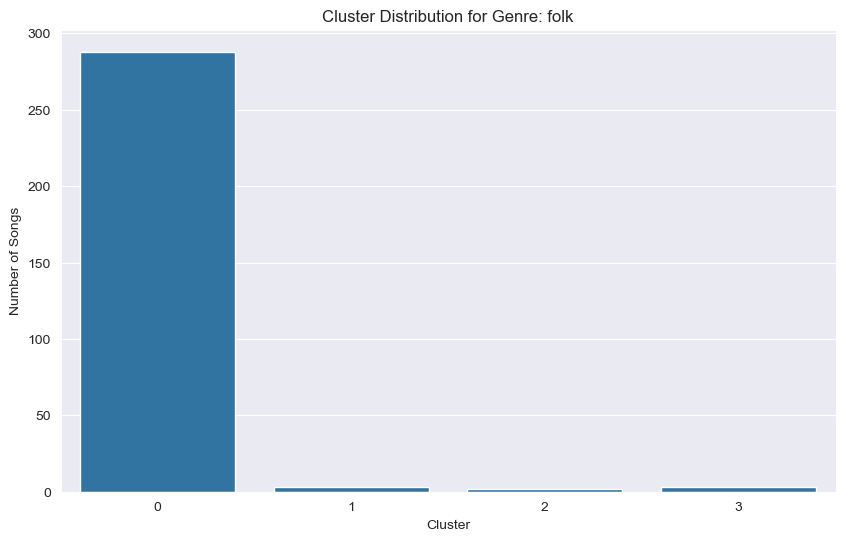

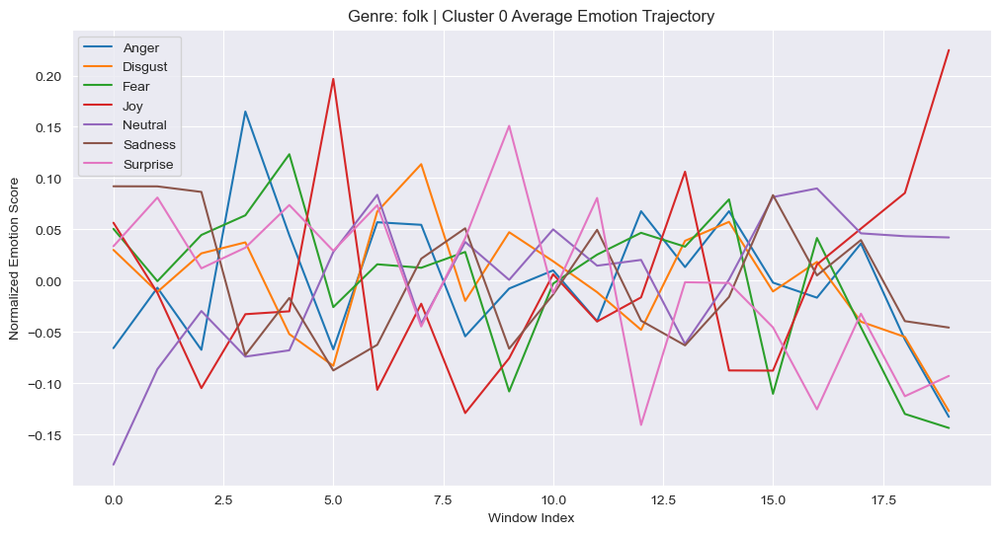

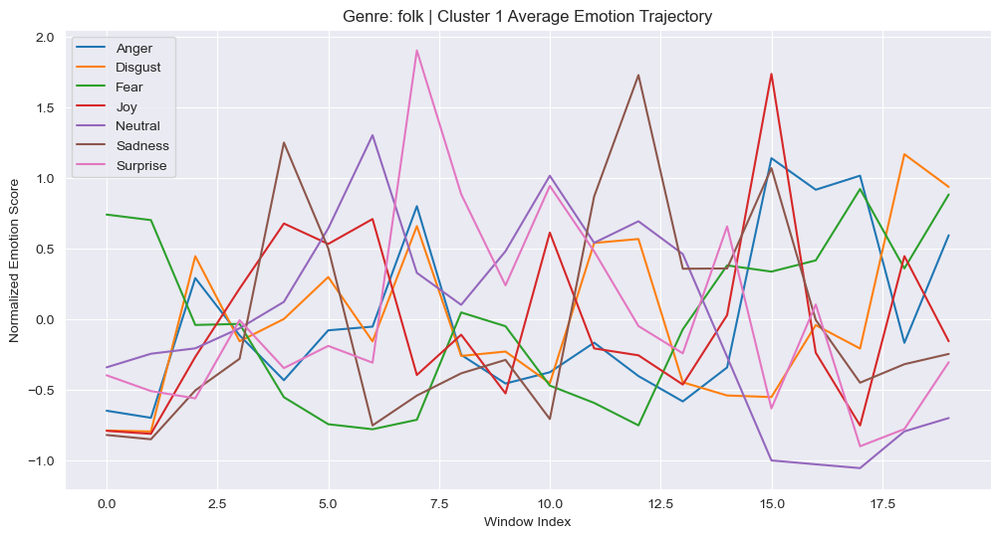

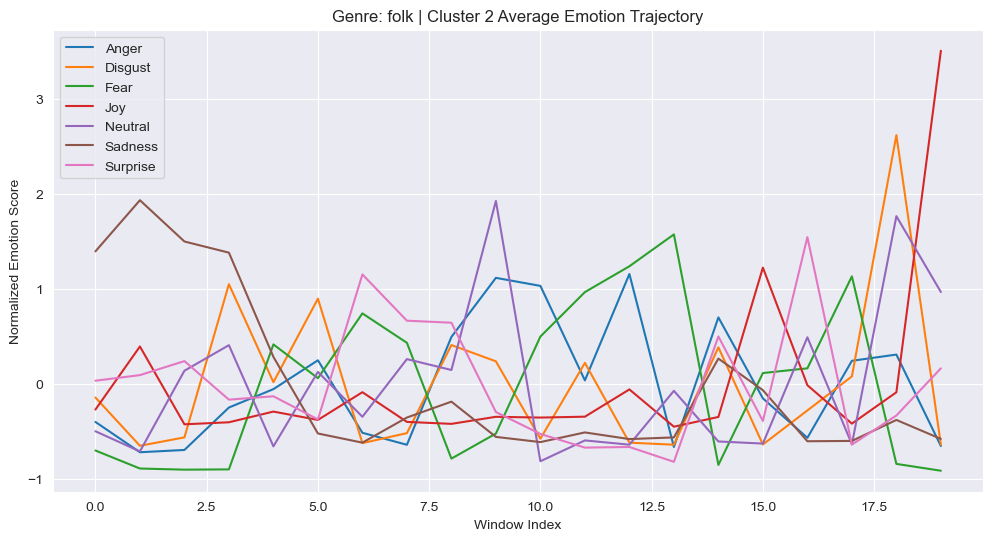

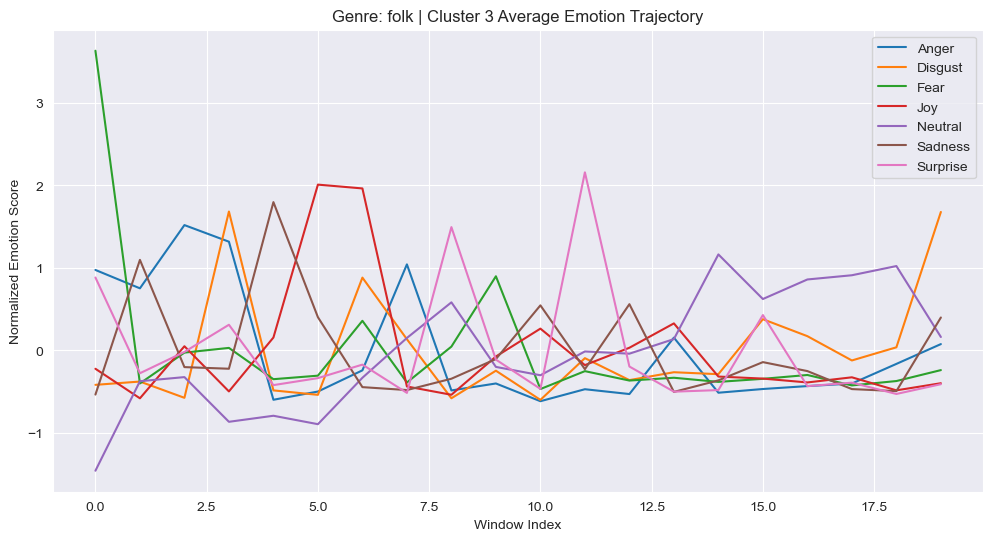

Visualizing clusters for genre: disco


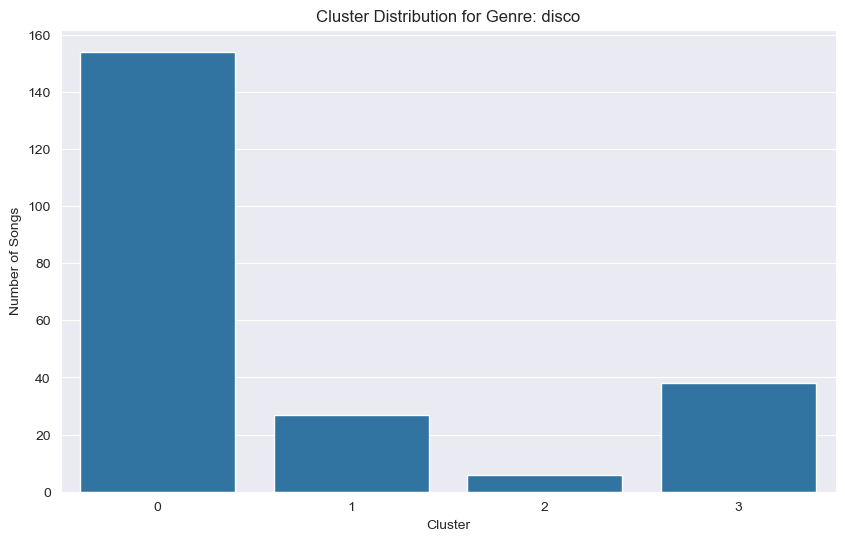

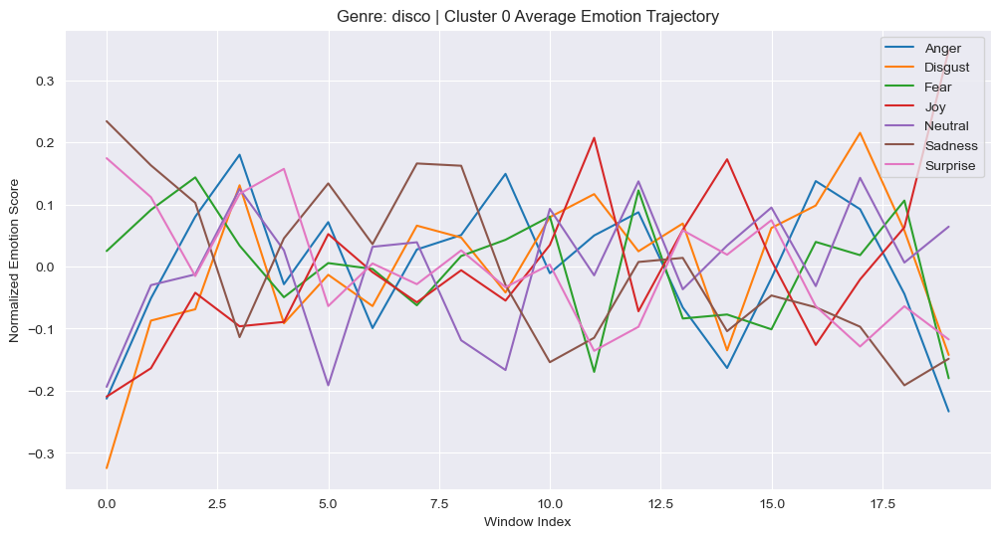

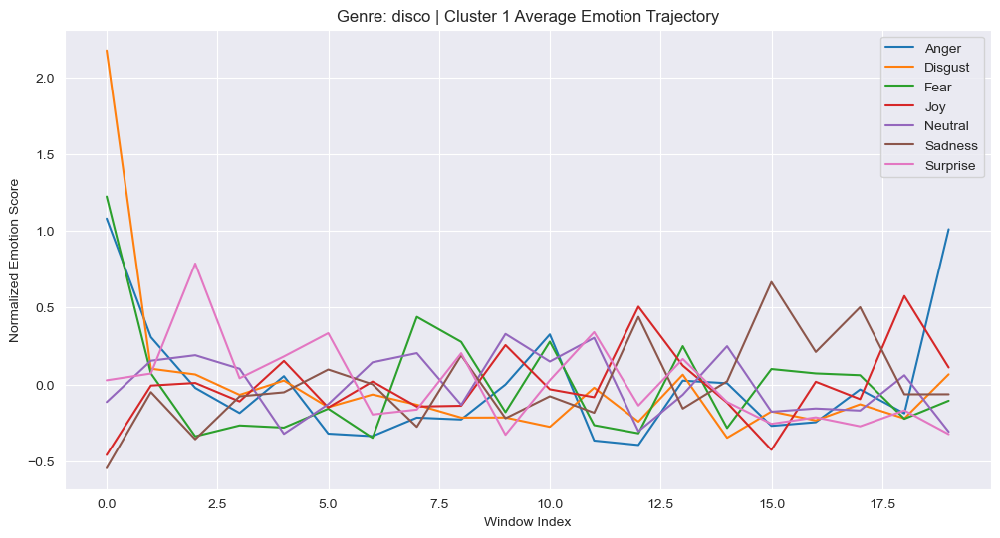

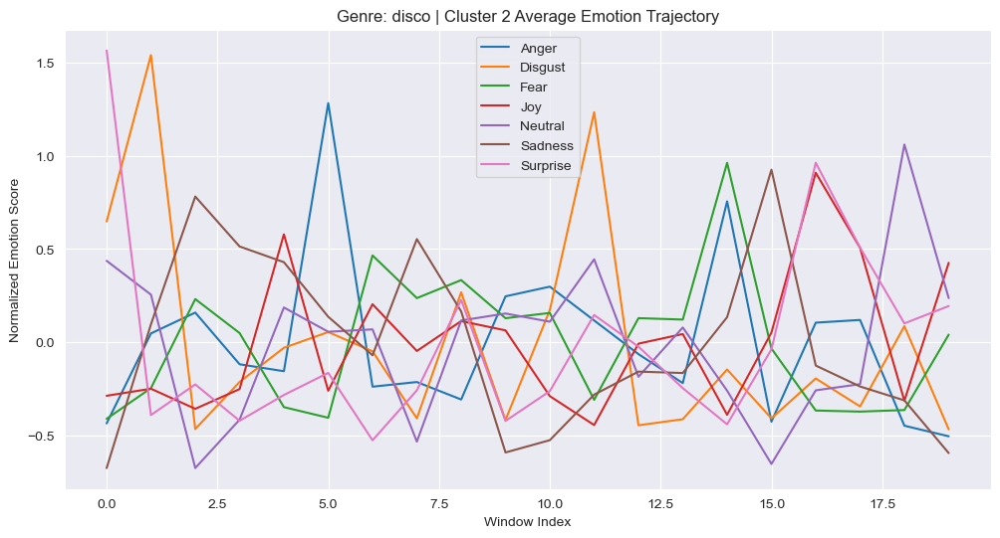

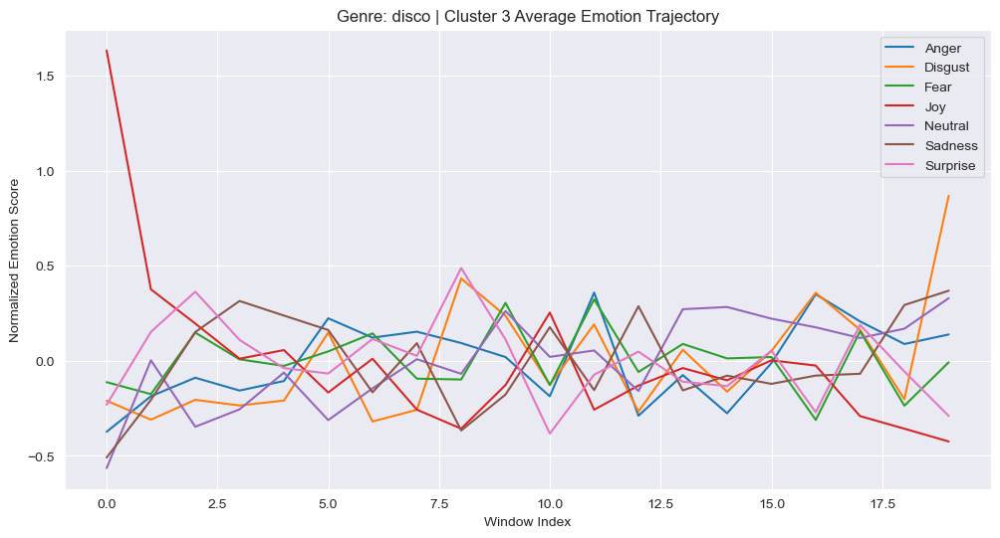

In [29]:
# dictionaries to store data
genre_time_series = {}
genre_songs = {}
genre_distance_matrices = {}
genre_clusters = {}

# prepare and normalize Time Series Data
for genre in top_genres:
    print(f"Preparing data for genre: {genre}")
    genre_df = train_df[train_df['genre'] == genre].copy()
    ts_array, songs = prepare_time_series(genre_df, sentiment_columns, n_windows=20)
    if ts_array.size == 0:
        print(f"No complete songs found for genre: {genre}")
        continue
    scaler = TimeSeriesScalerMeanVariance()
    ts_scaled = scaler.fit_transform(ts_array)
    genre_time_series[genre] = ts_scaled
    genre_songs[genre] = songs

# compute DTW distance matrices
for genre in top_genres:
    if genre not in genre_time_series:
        continue
    print(f"Computing DTW distances for genre: {genre}")
    ts_data = genre_time_series[genre]
    distance_matrix = cdist_dtw(ts_data)
    genre_distance_matrices[genre] = distance_matrix

# perform clustering
for genre in top_genres:
    if genre not in genre_distance_matrices:
        continue

    distance_matrix = genre_distance_matrices[genre]
    k_optimal = optimal_k_values.get(genre, 5)  
    clustering_model = AgglomerativeClustering(
        n_clusters=k_optimal,
        metric='precomputed',
        linkage='average'
    )
    labels = clustering_model.fit_predict(distance_matrix)
    genre_clusters[genre] = labels
    
    print(f"\nEvaluating Agglomerative Clustering for Genre: {genre}")
    ts_data = genre_time_series[genre]  
    evaluate_clusters(ts_data, labels)

# visualization
for genre in top_genres:
    if genre not in genre_time_series or genre not in genre_clusters:
        continue
    print(f"Visualizing clusters for genre: {genre}")
    ts_data = genre_time_series[genre]
    labels = genre_clusters[genre]
    songs = genre_songs[genre]
    
    cluster_df = pd.DataFrame({
        'song_artist': songs,
        'cluster': labels
    })
    
    # plot cluster distribution
    plt.figure(figsize=(10, 6))
    sns.countplot(data=cluster_df, x='cluster')
    plt.title(f'Cluster Distribution for Genre: {genre}')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Songs')
    plt.show()
    
    # plot average trajectories per cluster
    for cluster in range(optimal_k_values[genre]):
        cluster_indices = np.where(labels == cluster)[0]
        if len(cluster_indices) == 0:
            continue
        avg_trajectory = ts_data[cluster_indices].mean(axis=0)  # Shape: (20, 7)
        plt.figure(figsize=(12, 6))
        for i, emotion in enumerate(sentiment_columns):
            plt.plot(range(20), avg_trajectory[:, i], label=emotion.capitalize())
        plt.title(f'Genre: {genre} | Cluster {cluster} Average Emotion Trajectory')
        plt.xlabel('Window Index')
        plt.ylabel('Normalized Emotion Score')
        plt.legend()
        plt.show()


Preparing data for K-Means clustering on genre: dance
Preparing data for K-Means clustering on genre: alt-rock
Preparing data for K-Means clustering on genre: hard-rock
Preparing data for K-Means clustering on genre: country
Preparing data for K-Means clustering on genre: blues
Preparing data for K-Means clustering on genre: pop
Preparing data for K-Means clustering on genre: funk
Preparing data for K-Means clustering on genre: singer-songwriter
Preparing data for K-Means clustering on genre: folk
Preparing data for K-Means clustering on genre: disco

Evaluating K-Means Clustering for Genre: dance
Silhouette Score: 0.0216
Calinski-Harabasz Index: 20.5096
Davies-Bouldin Index: 5.0194

Evaluating K-Means Clustering for Genre: alt-rock
Silhouette Score: 0.0263
Calinski-Harabasz Index: 20.2412
Davies-Bouldin Index: 4.7720

Evaluating K-Means Clustering for Genre: hard-rock
Silhouette Score: 0.0089
Calinski-Harabasz Index: 15.5275
Davies-Bouldin Index: 5.6006

Evaluating K-Means Clustering 

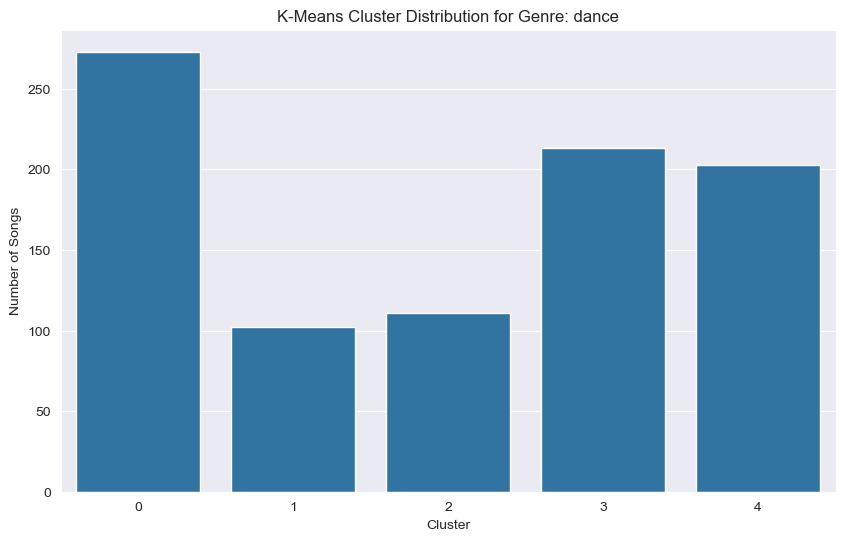

4
 dance 


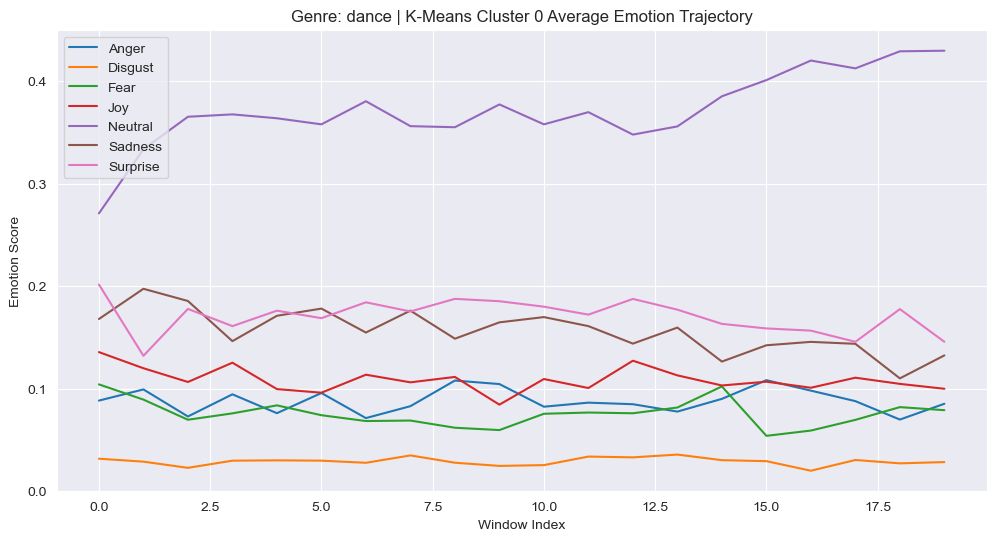

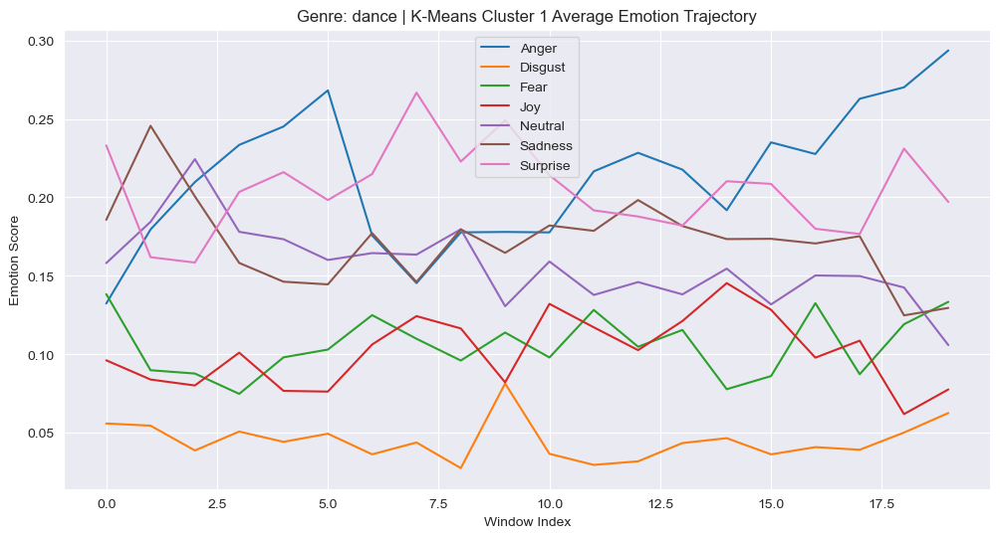

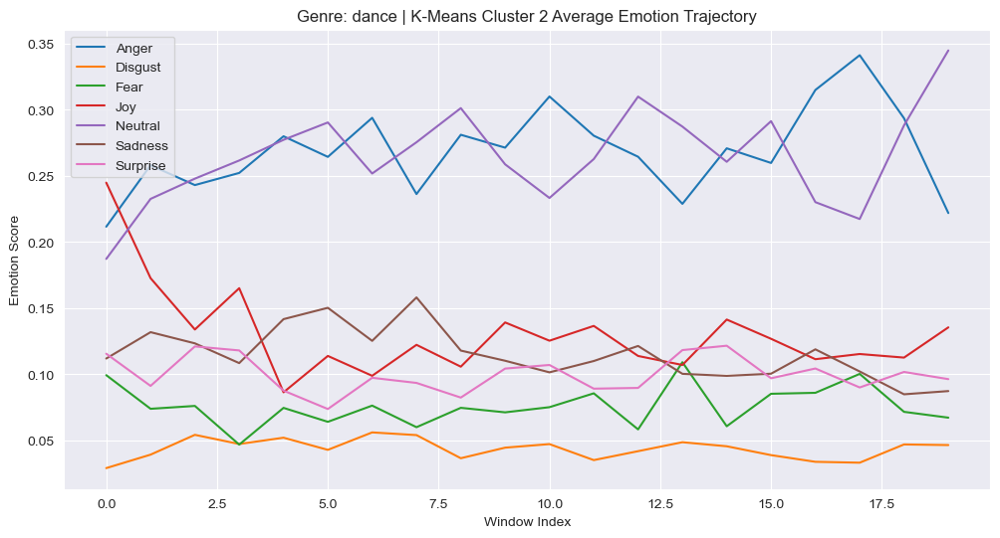

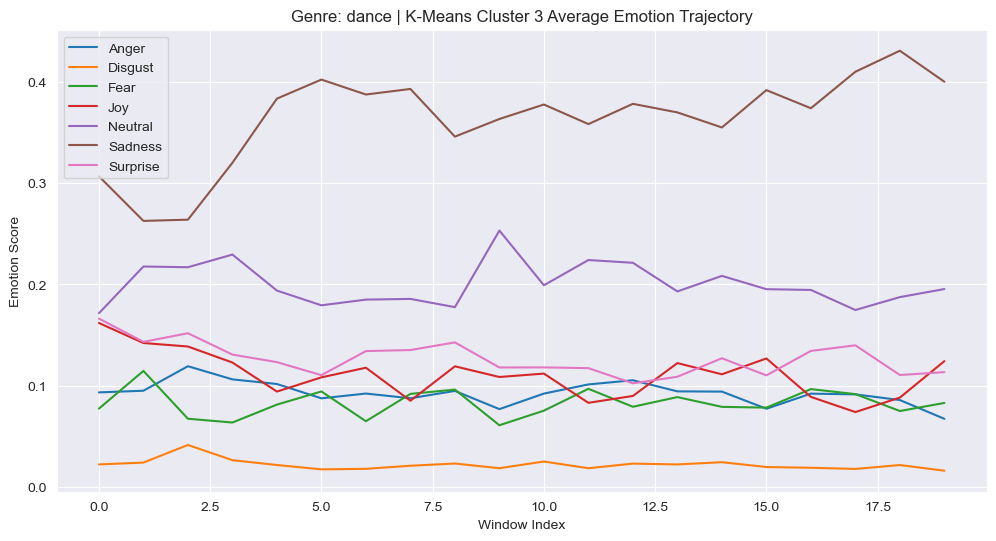

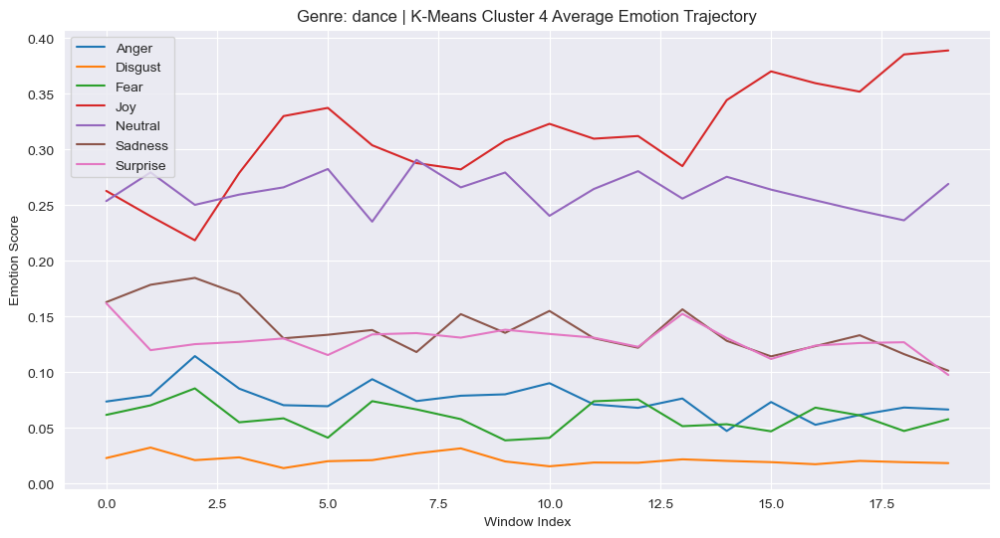

Visualizing K-Means clusters for genre: alt-rock


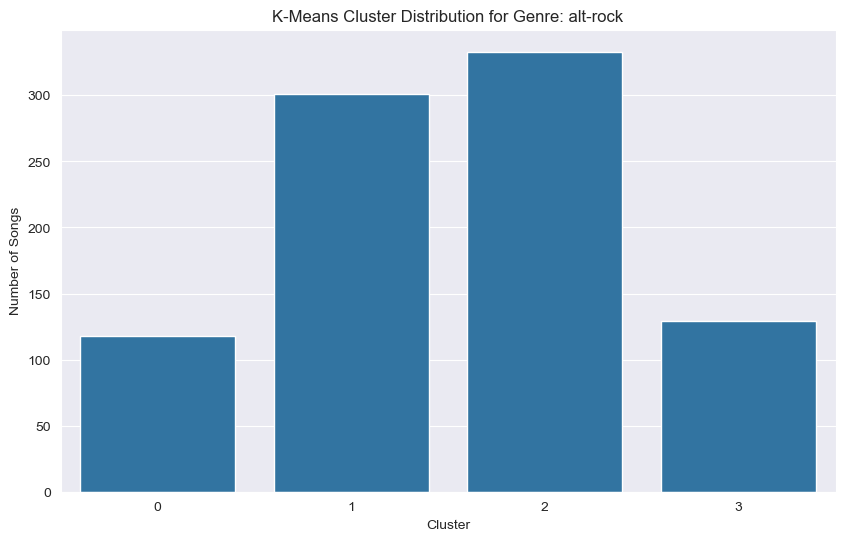

4
 alt-rock 


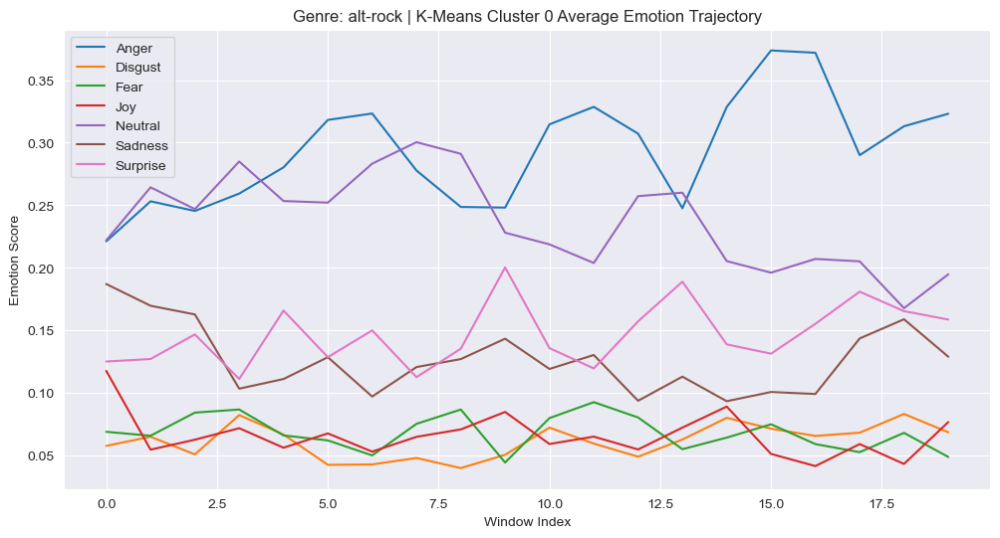

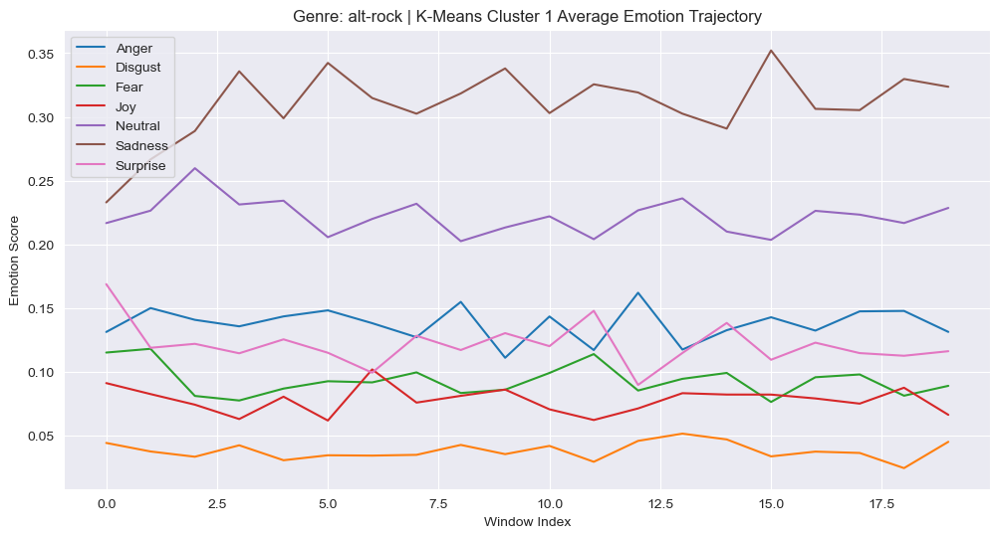

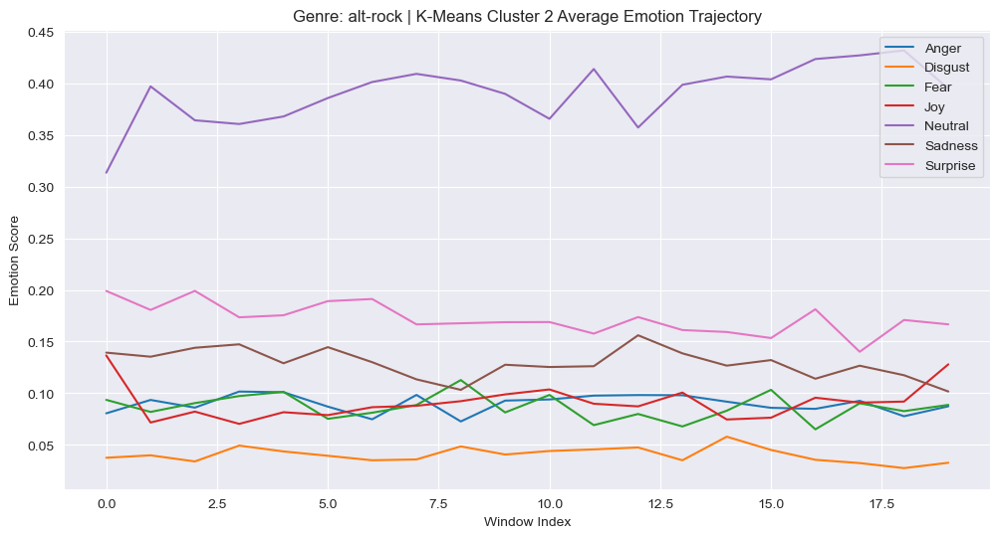

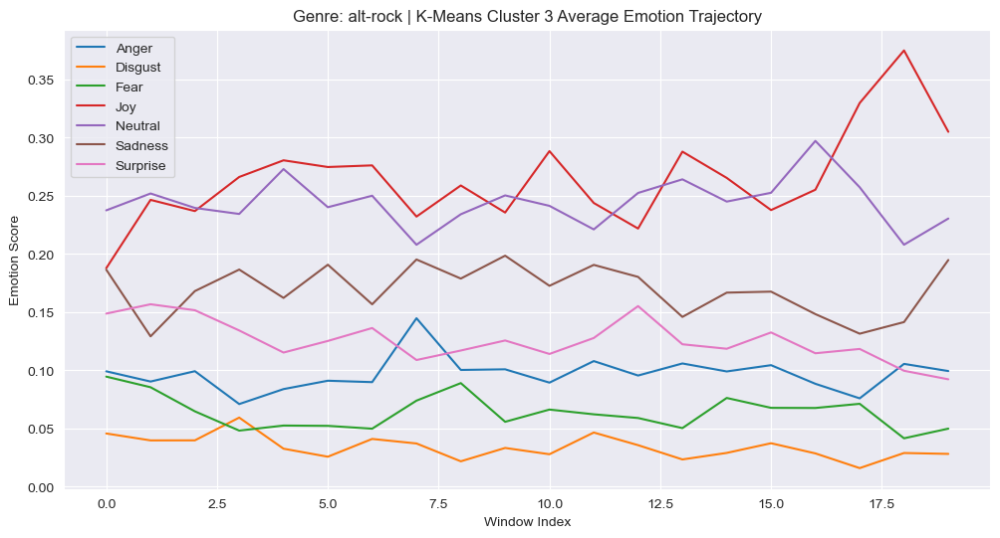

Visualizing K-Means clusters for genre: hard-rock


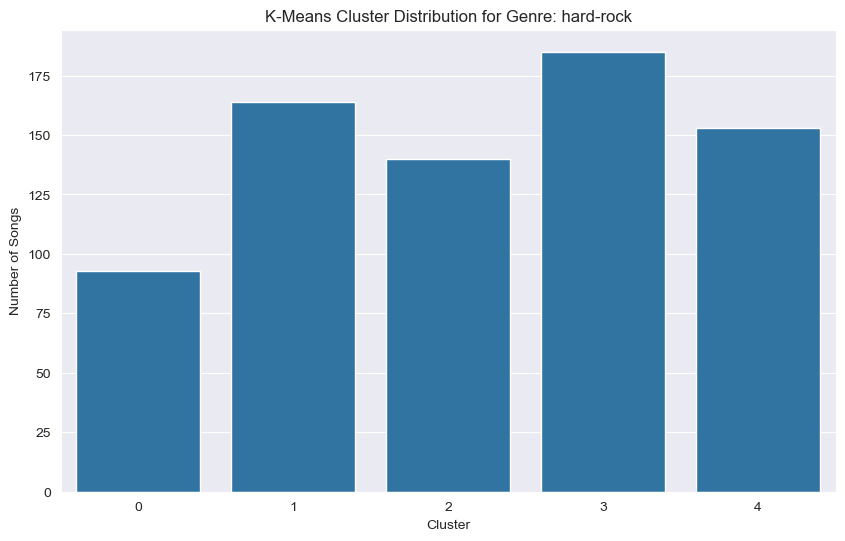

4
 hard-rock 


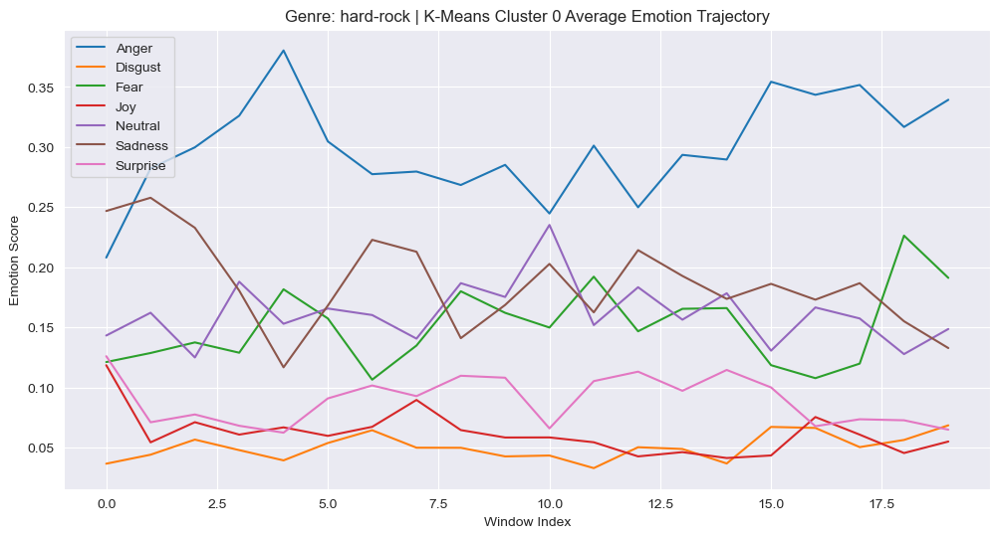

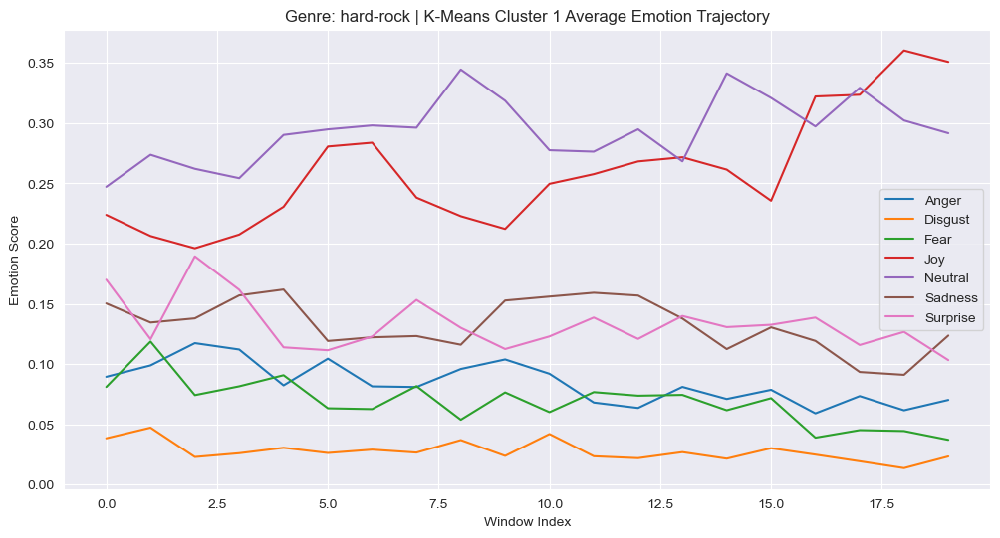

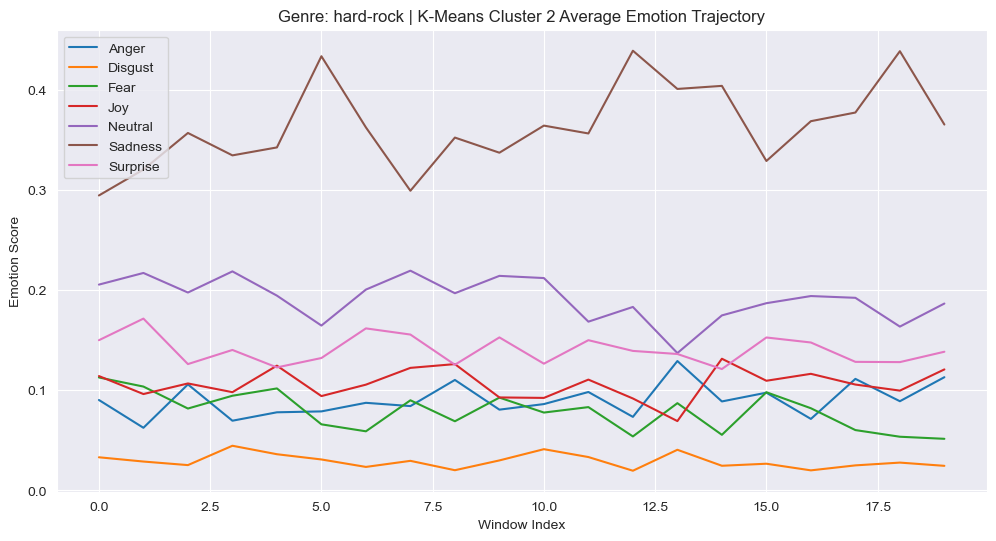

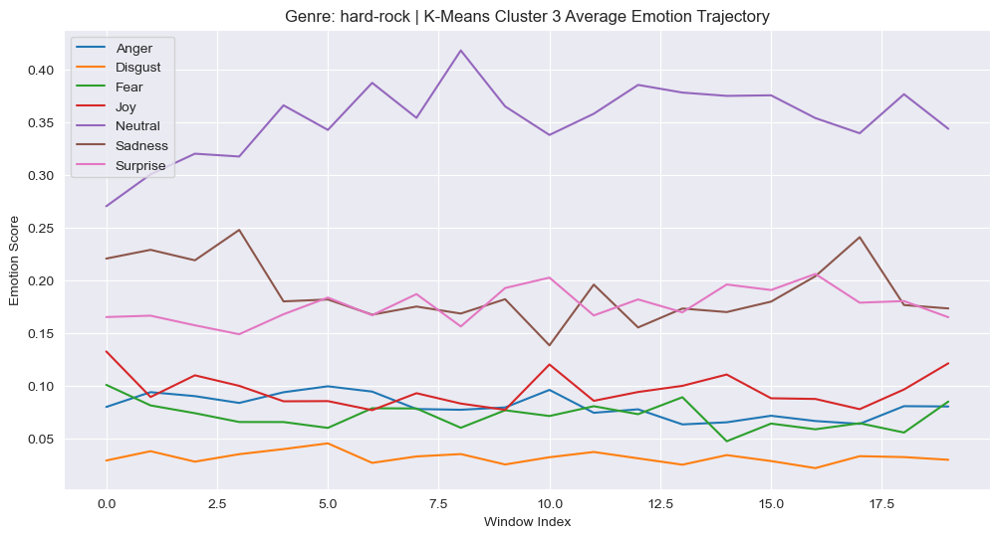

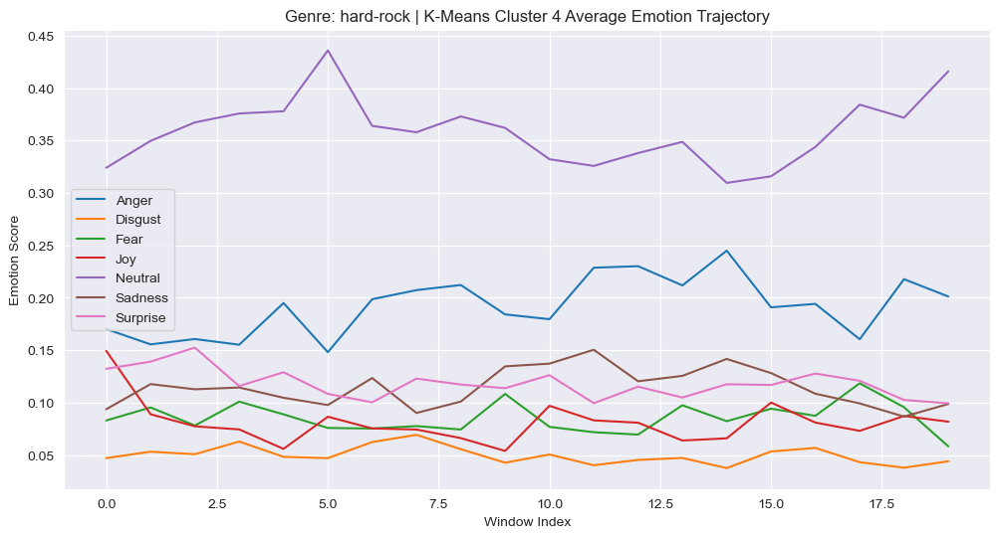

Visualizing K-Means clusters for genre: country


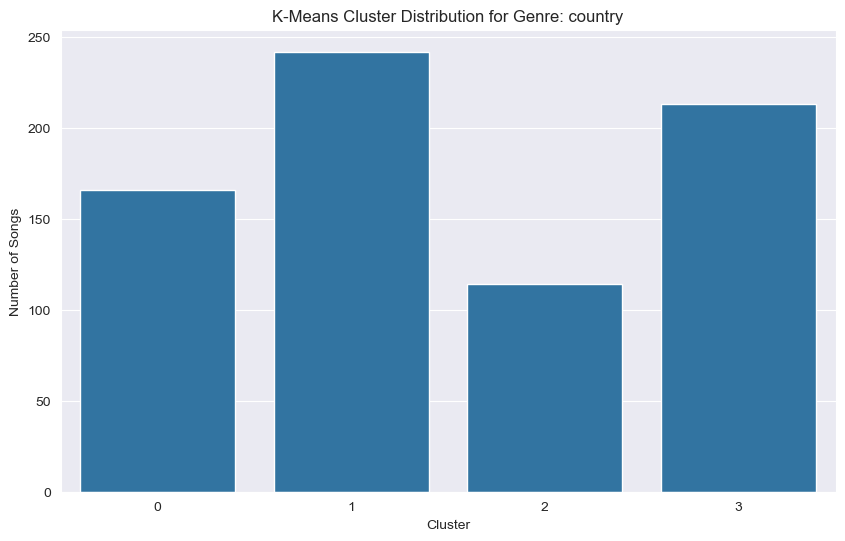

4
 country 


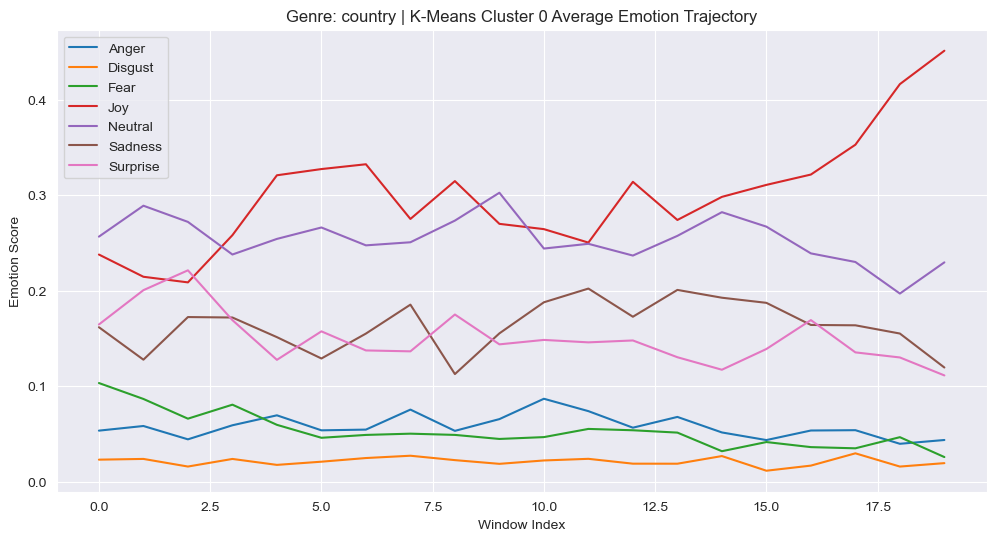

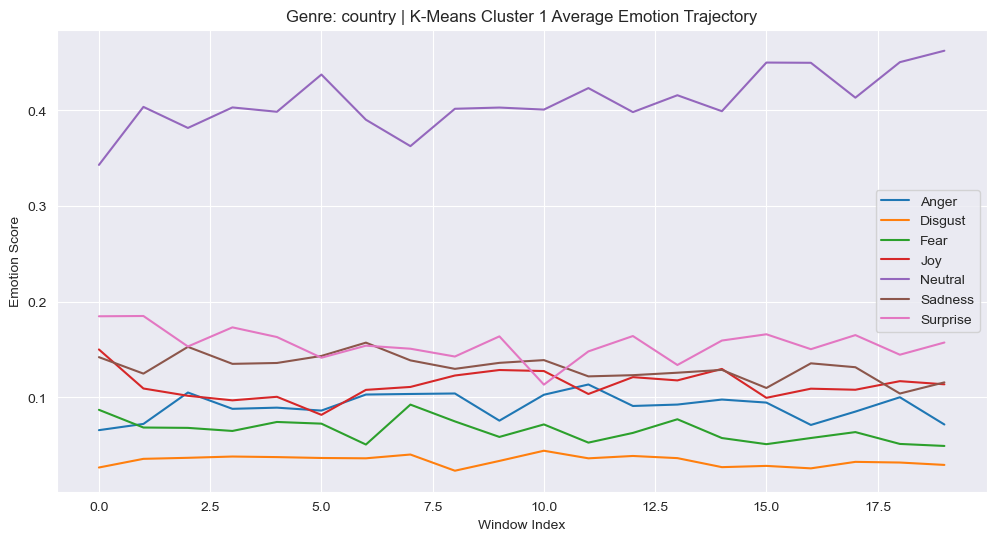

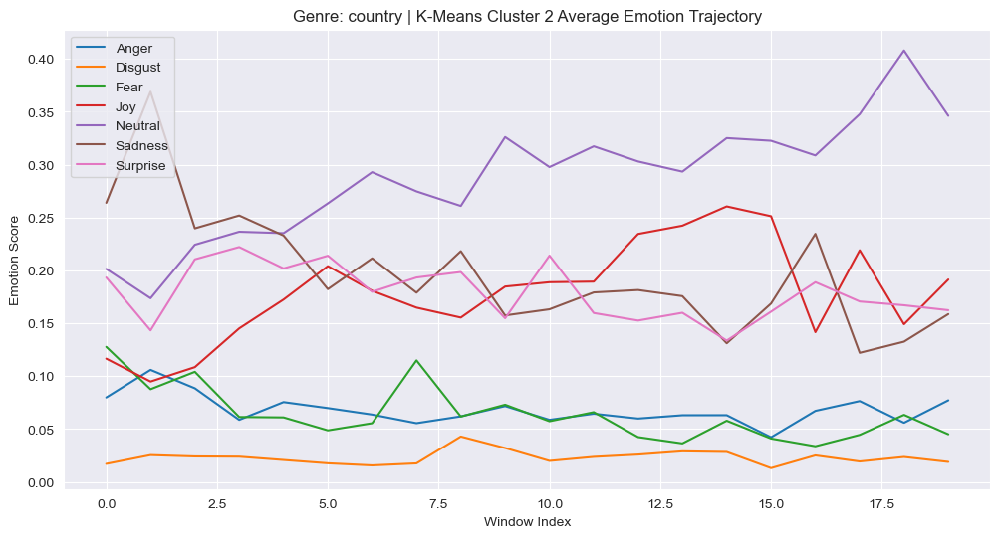

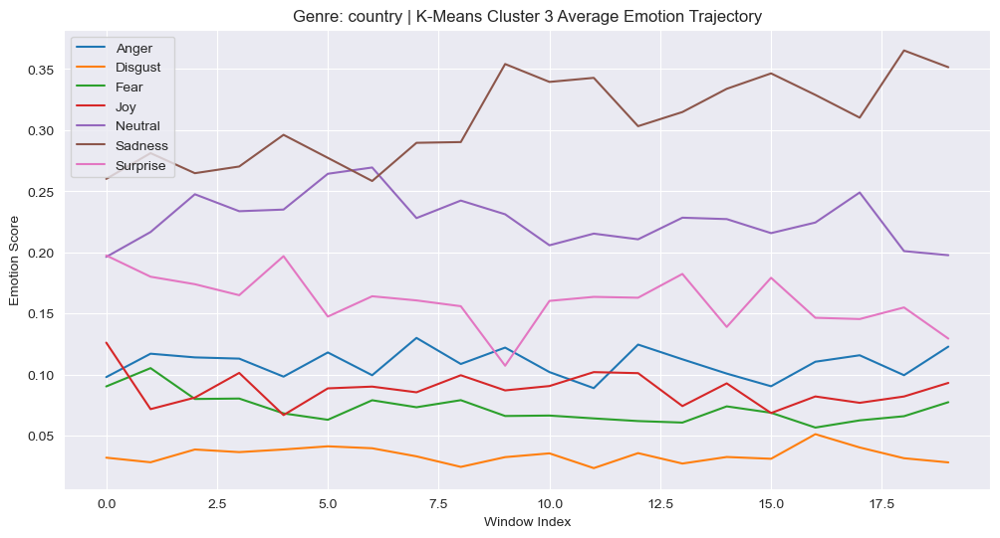

Visualizing K-Means clusters for genre: blues


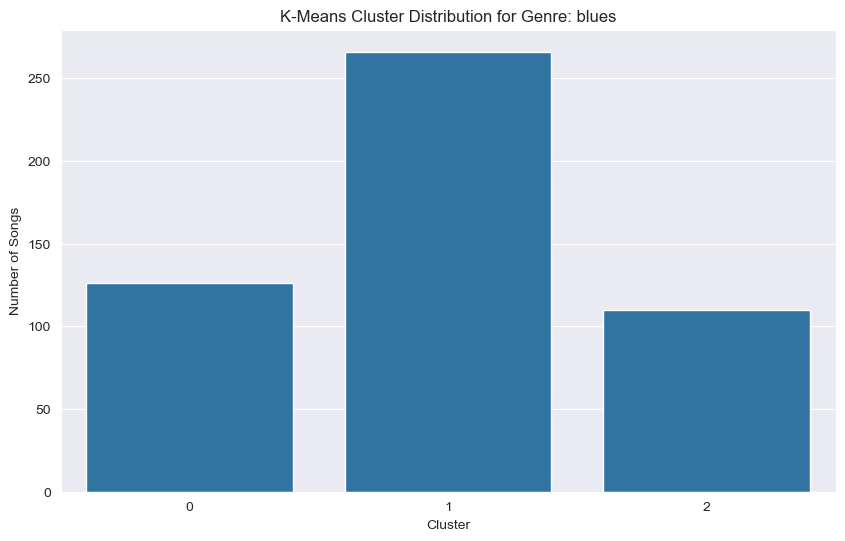

4
 blues 


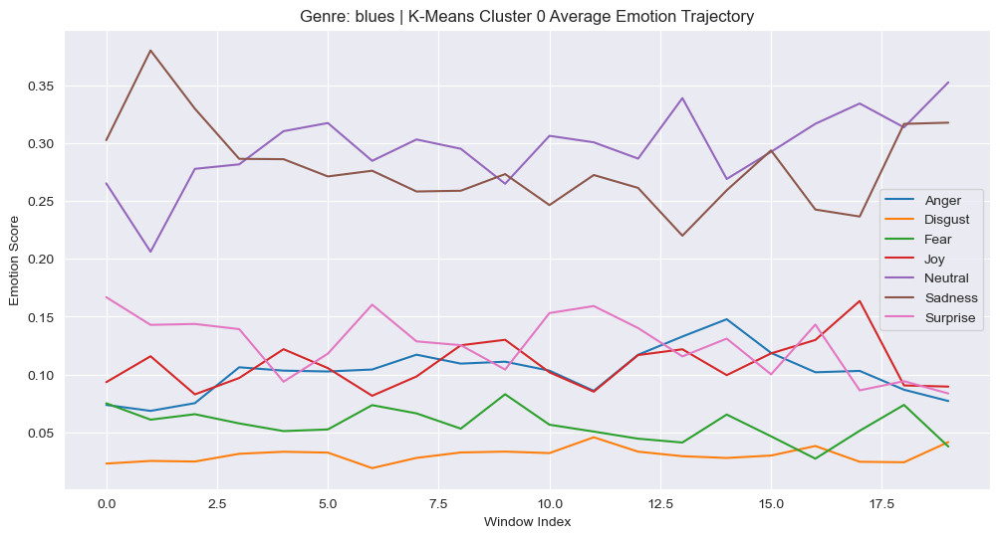

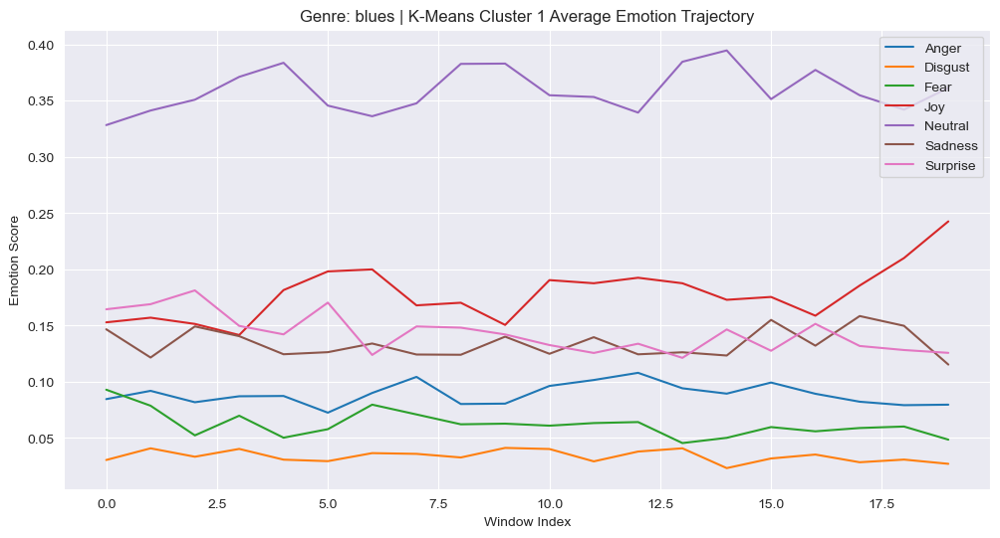

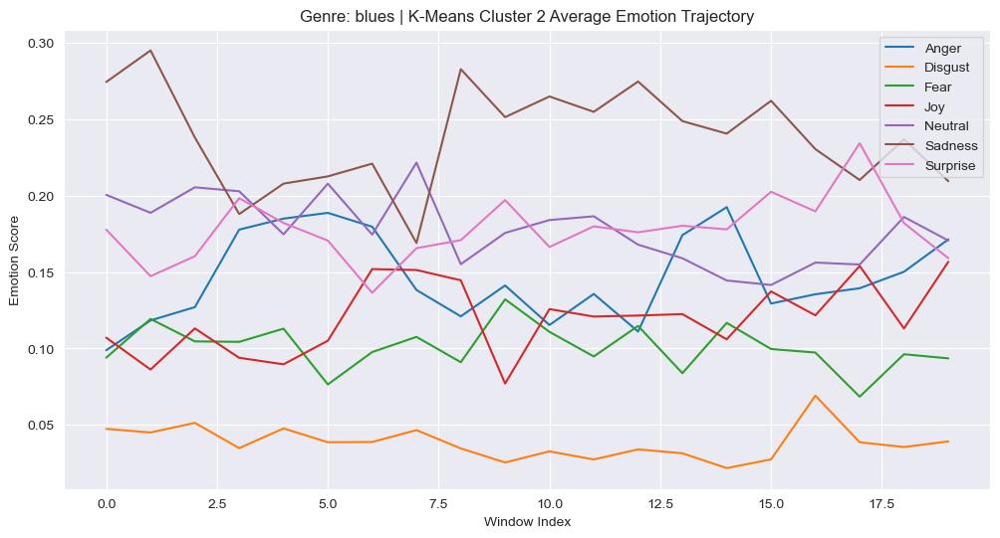

Visualizing K-Means clusters for genre: pop


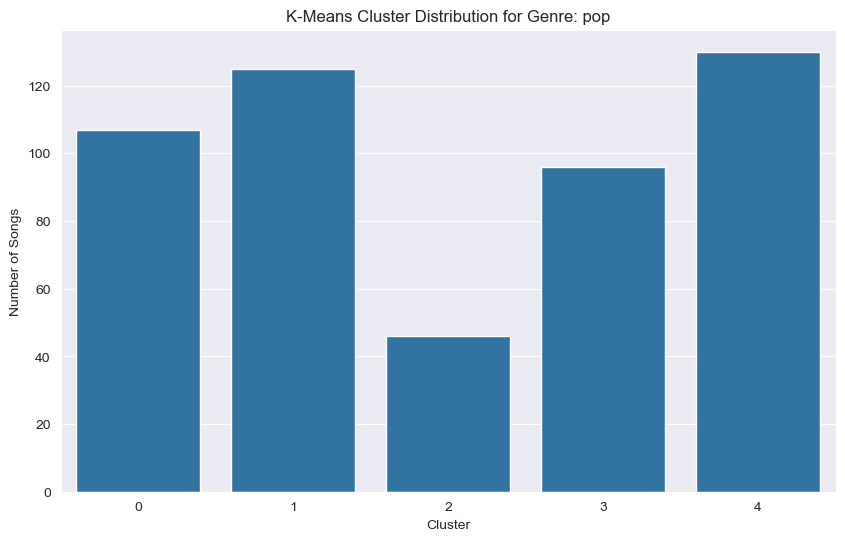

4
 pop 


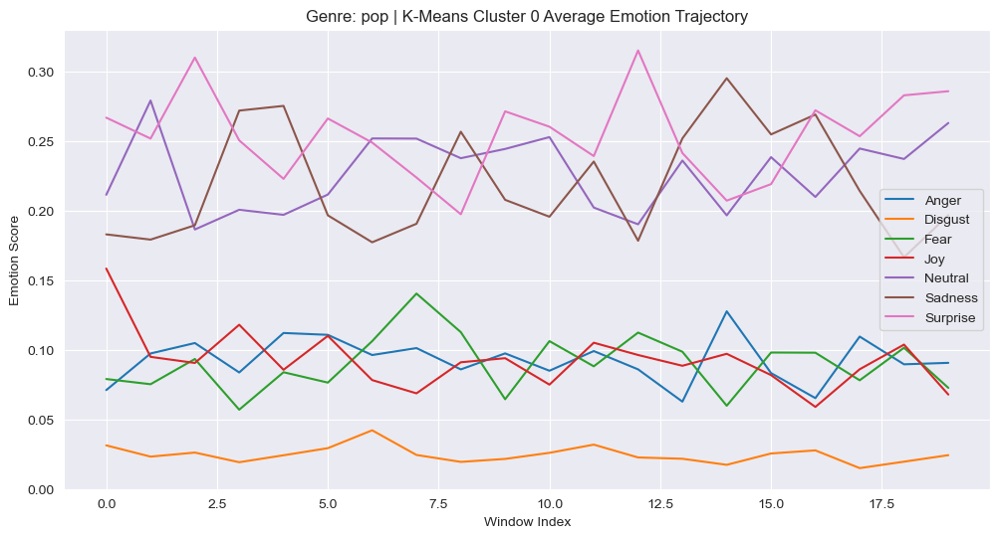

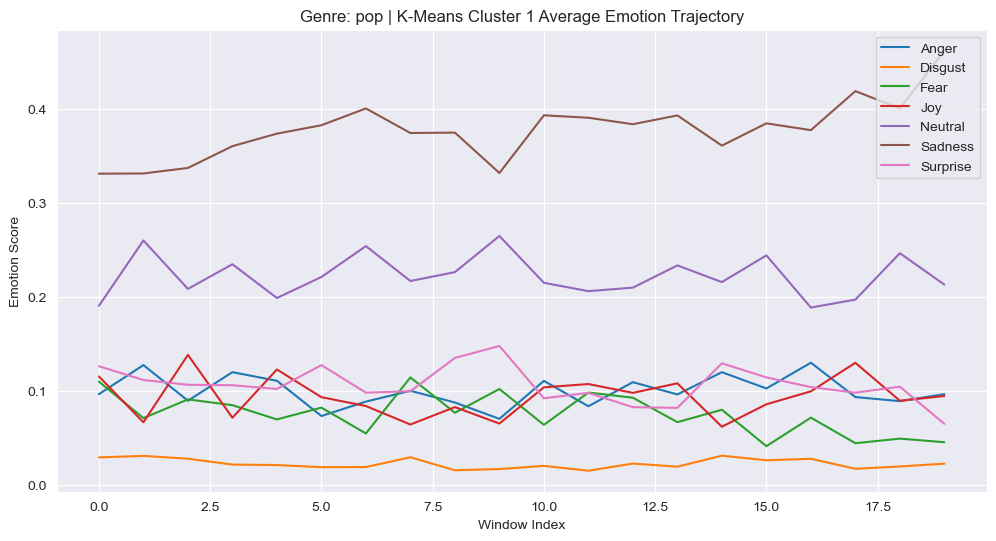

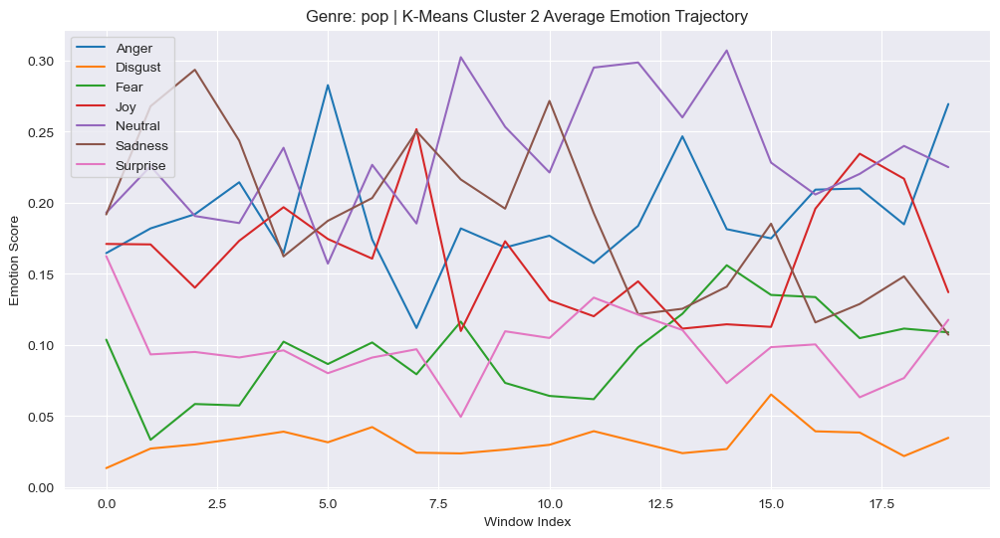

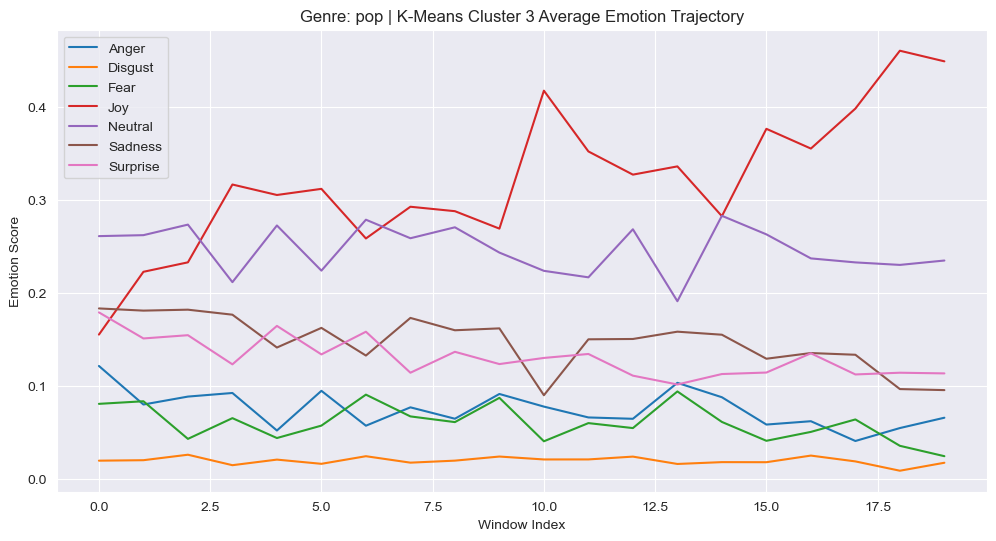

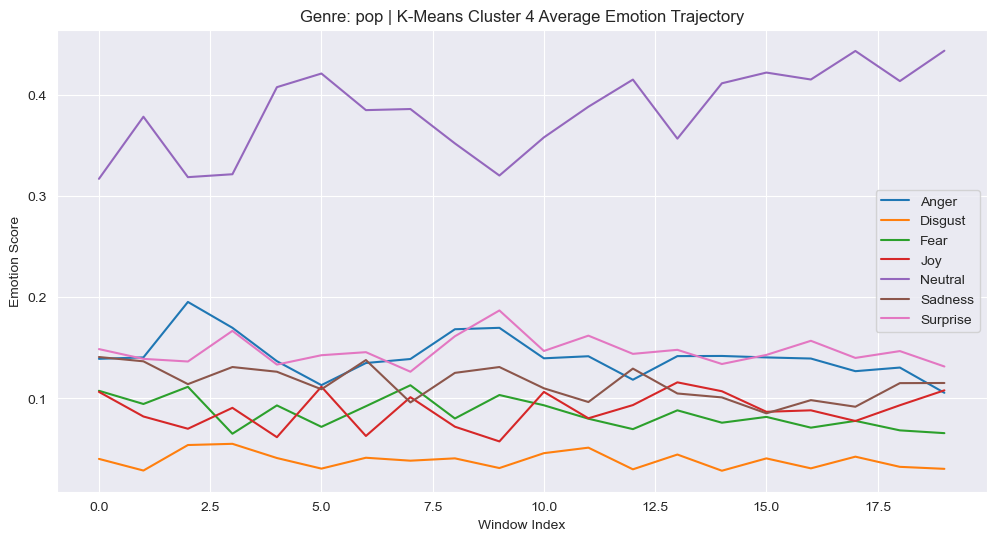

Visualizing K-Means clusters for genre: funk


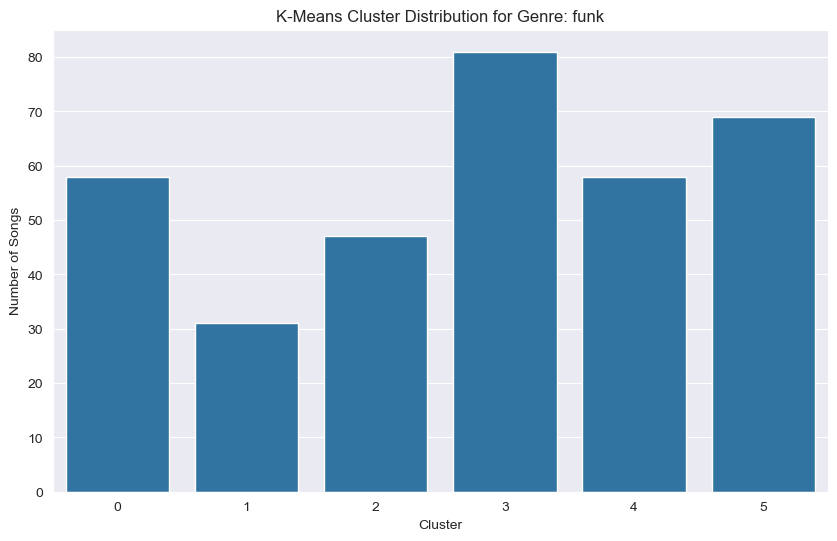

4
 funk 


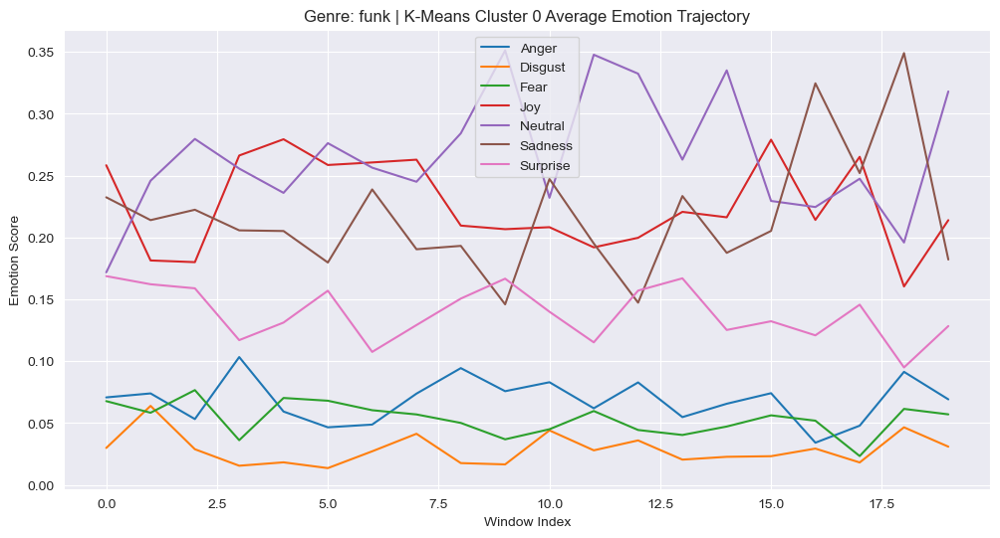

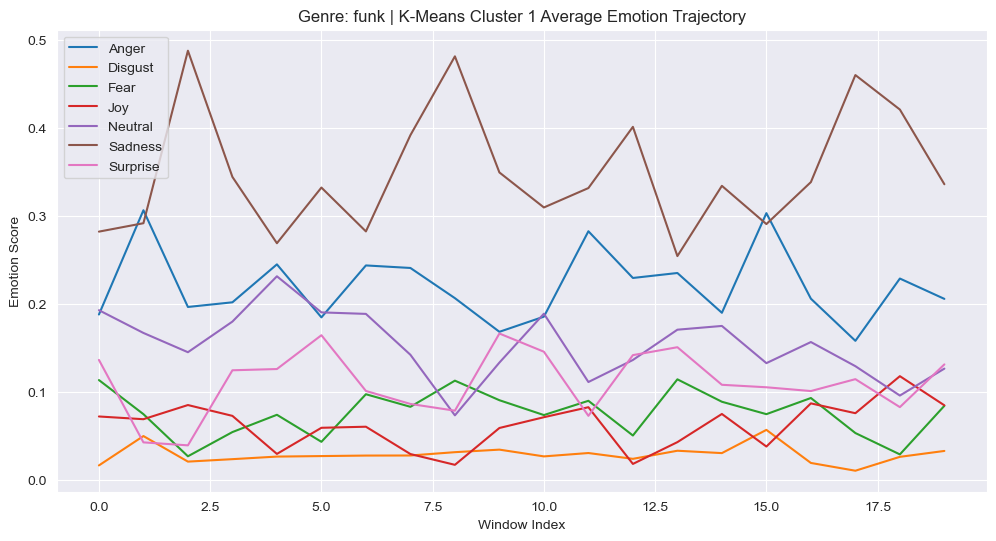

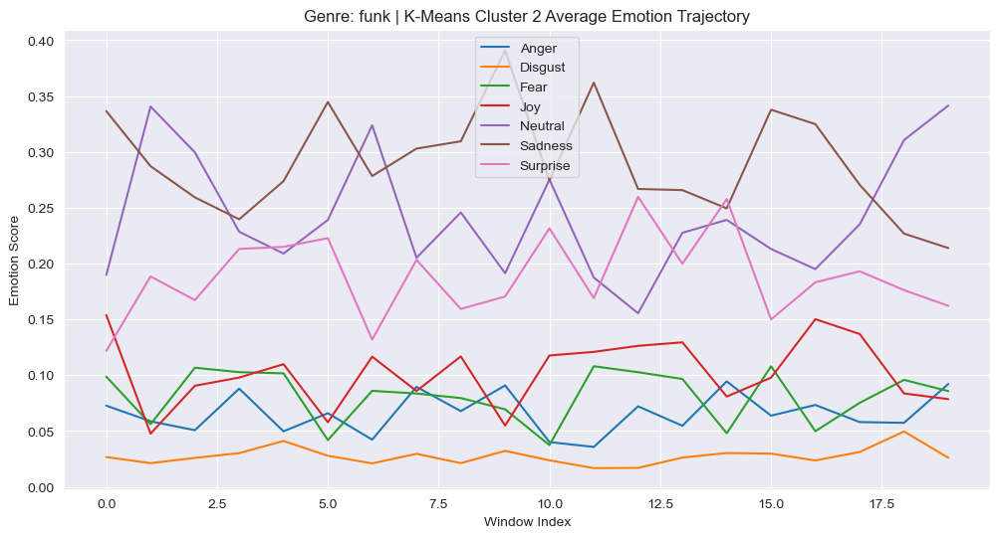

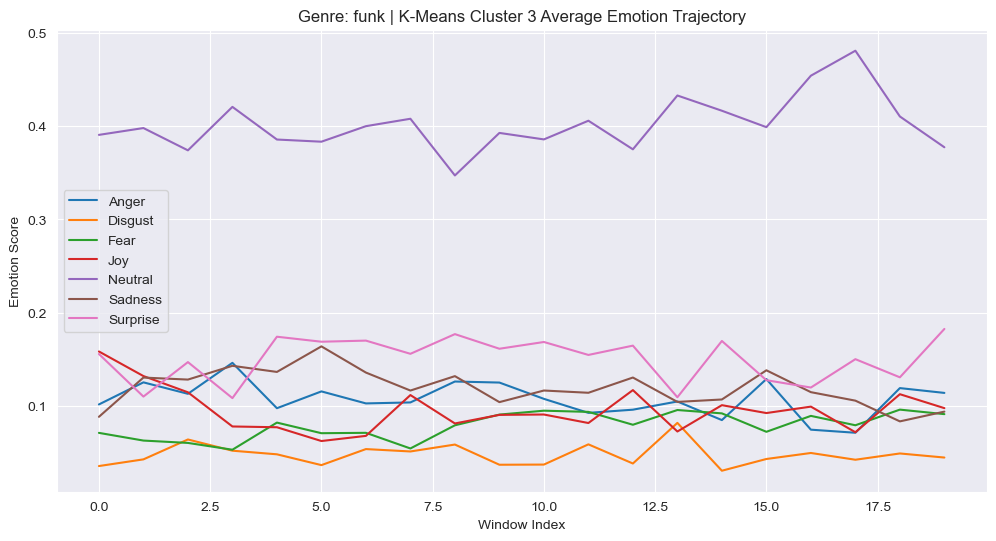

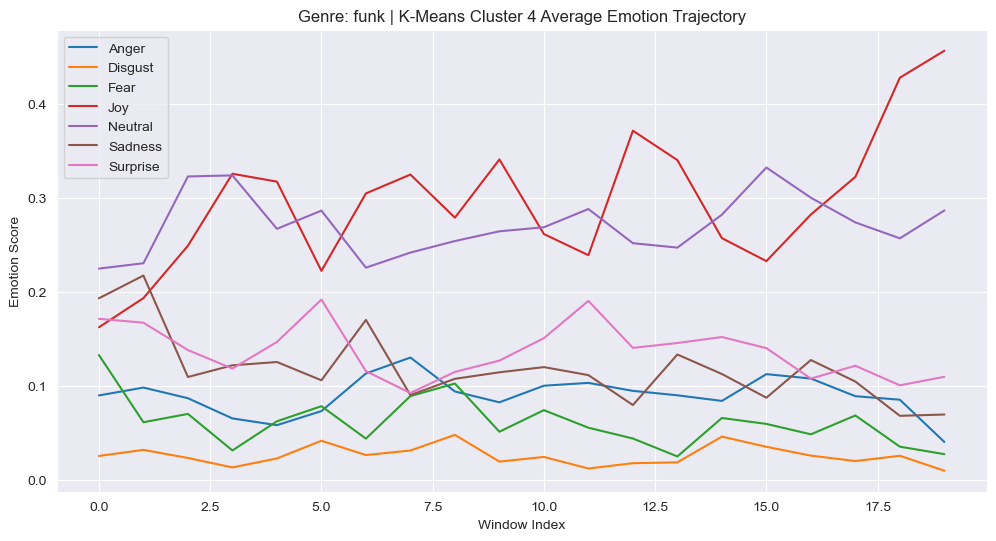

Visualizing K-Means clusters for genre: singer-songwriter


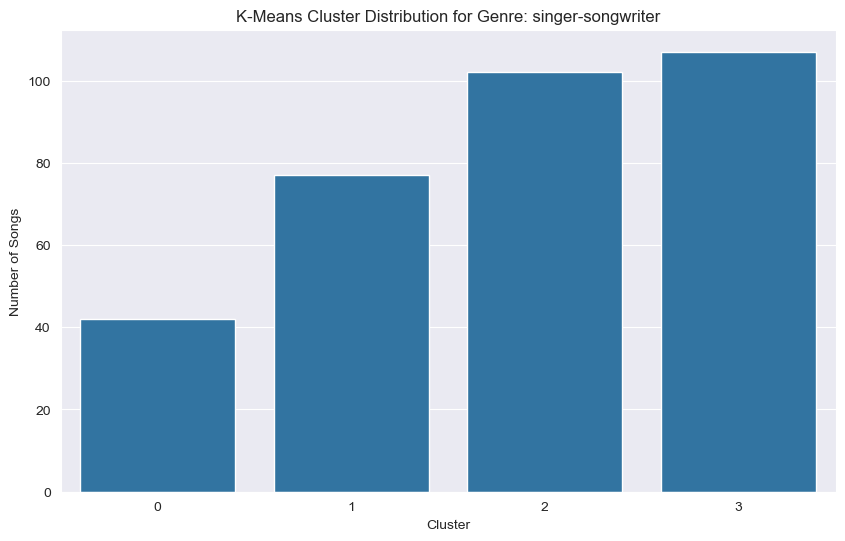

4
 singer-songwriter 


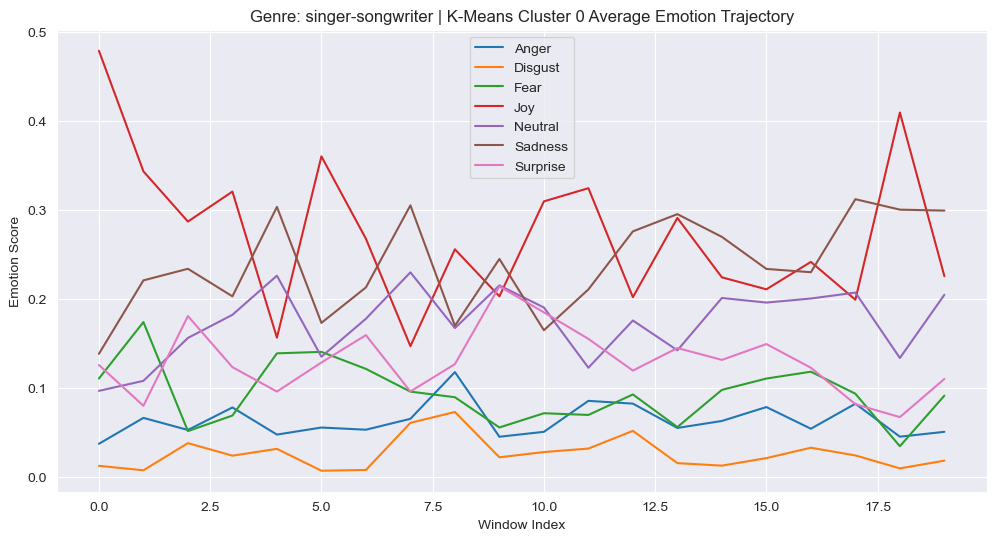

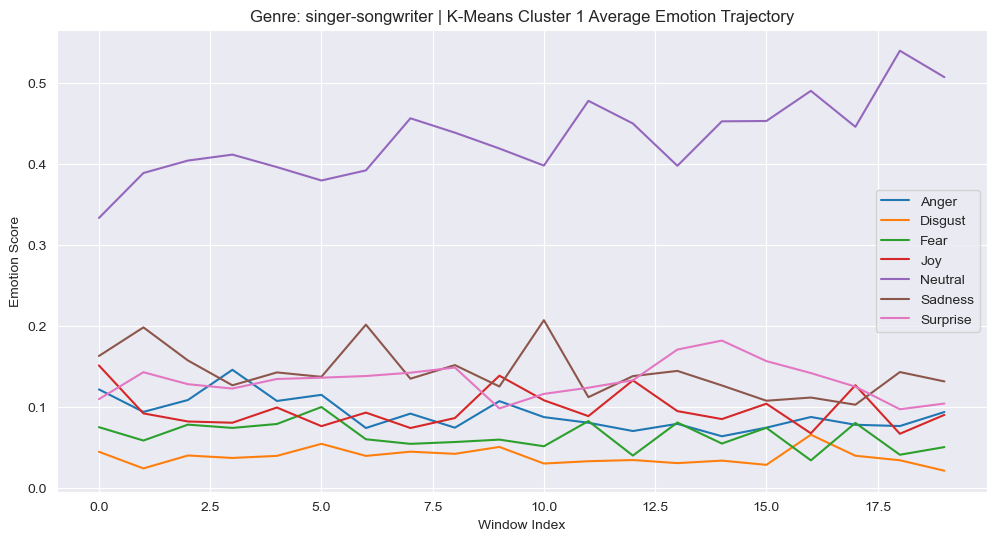

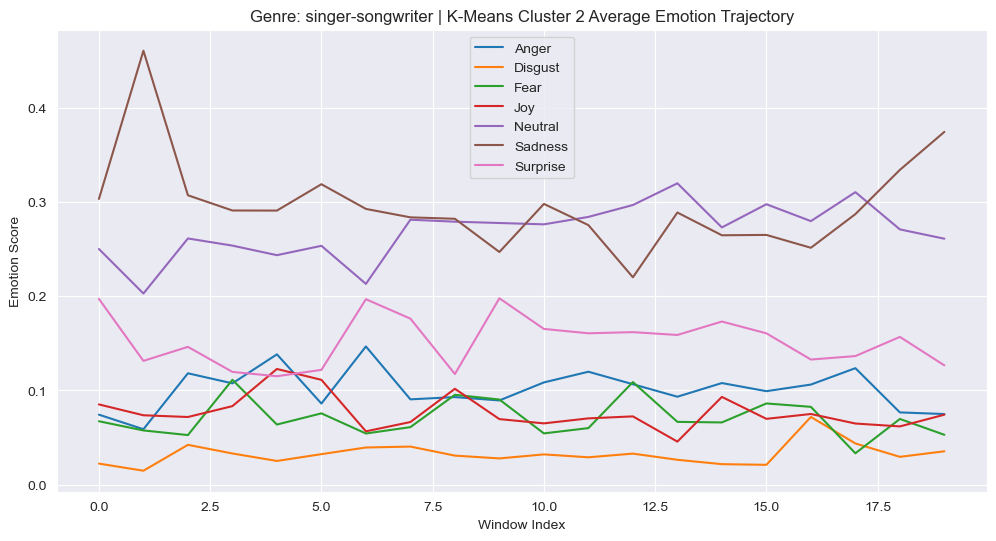

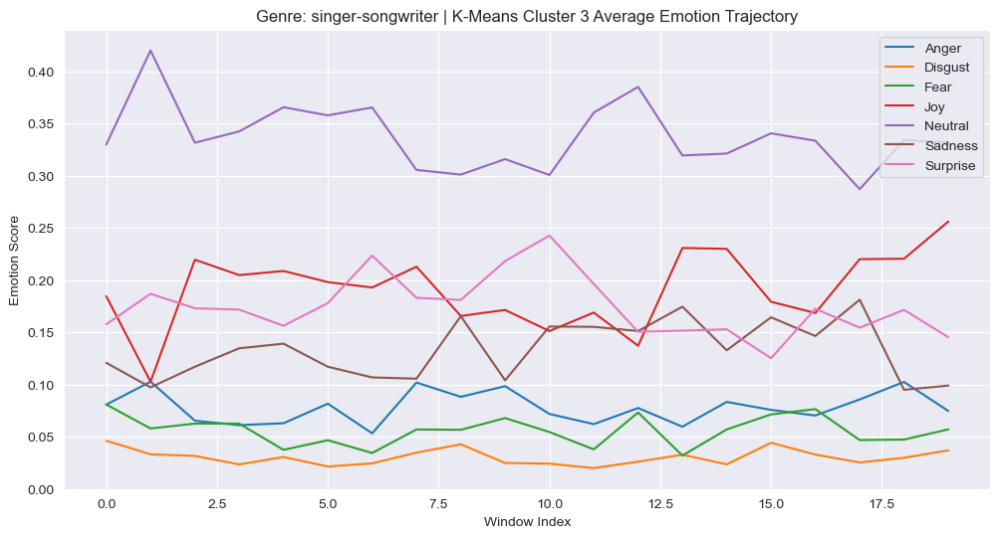

Visualizing K-Means clusters for genre: folk


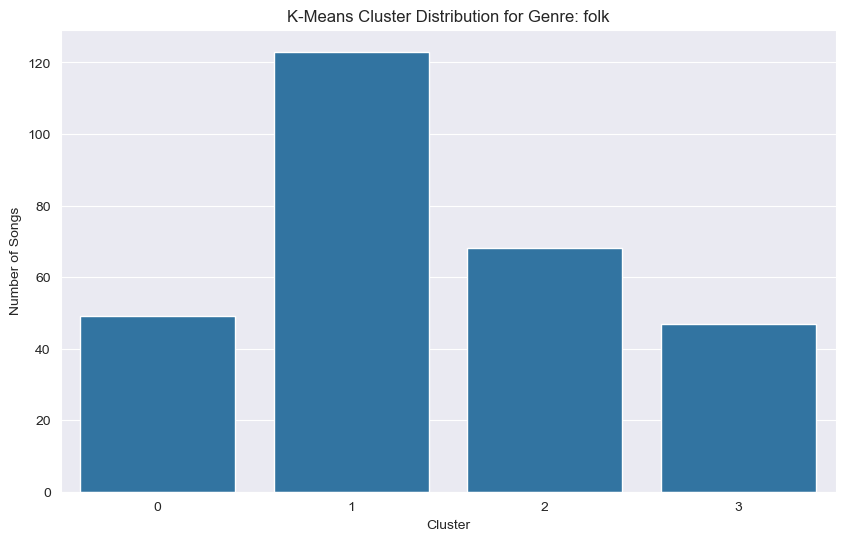

4
 folk 


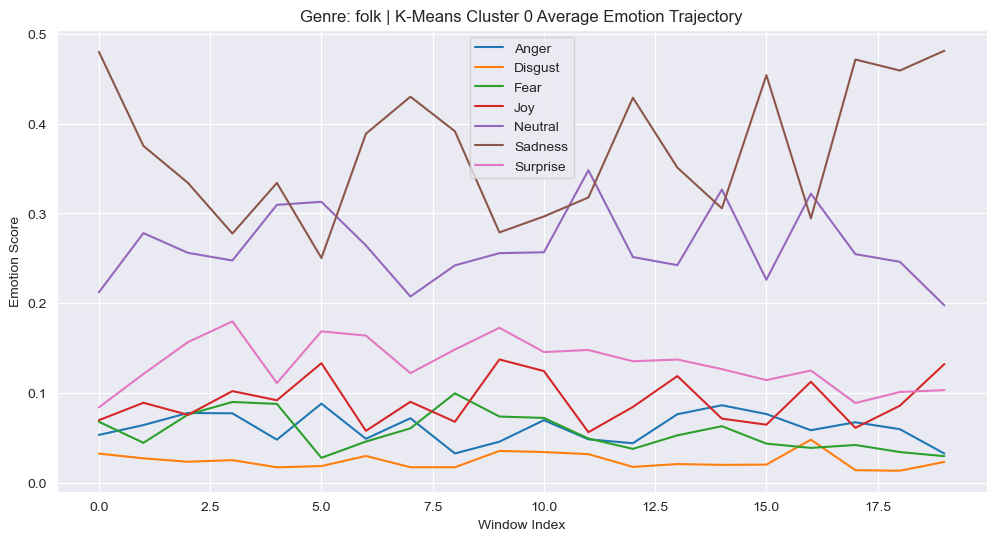

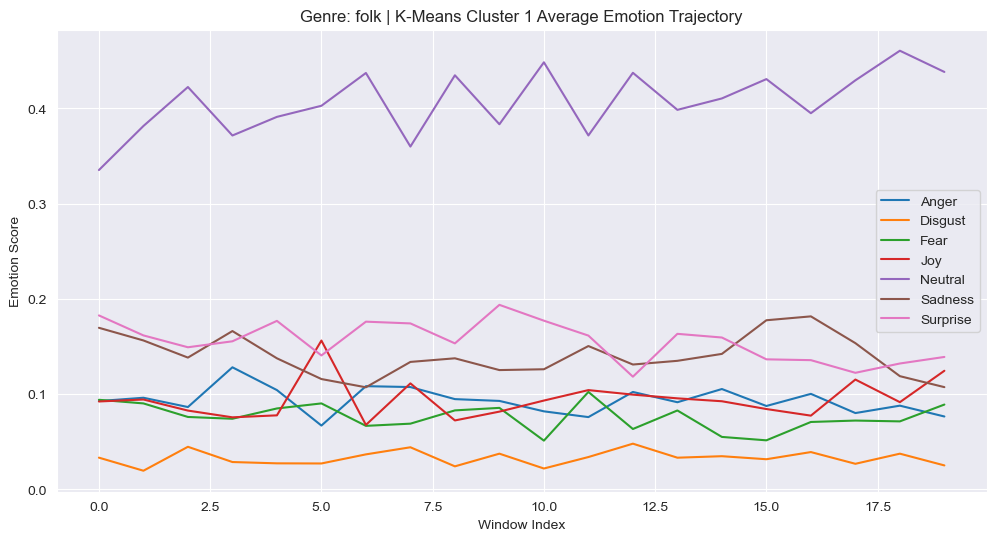

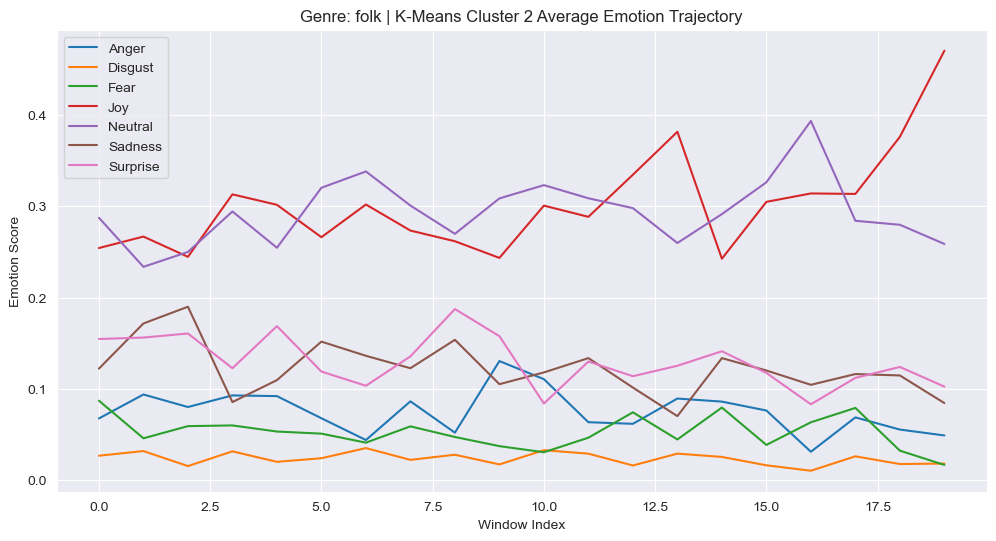

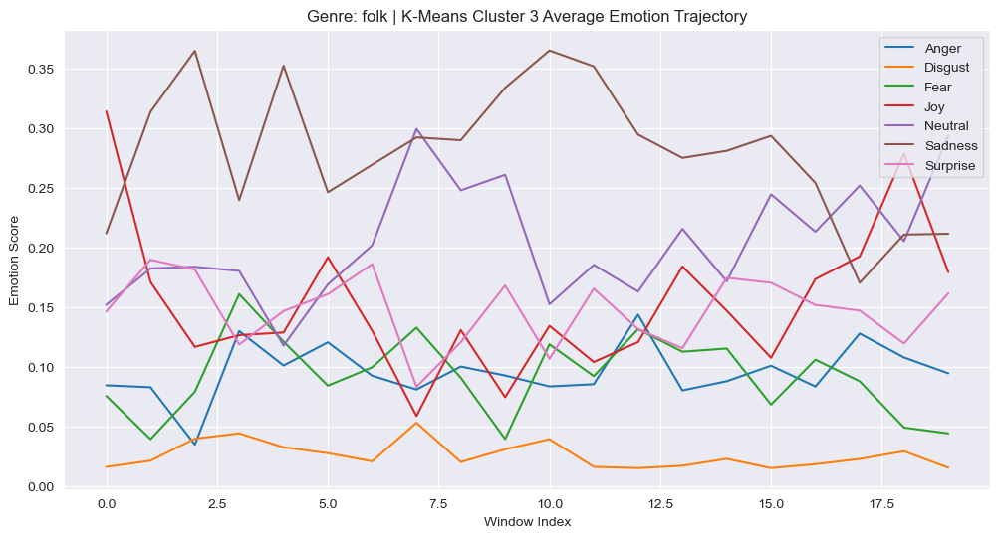

Visualizing K-Means clusters for genre: disco


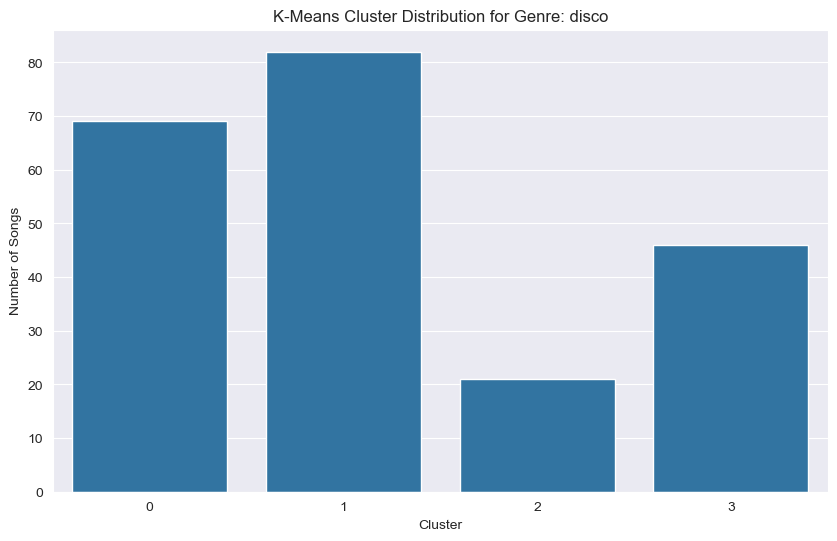

4
 disco 


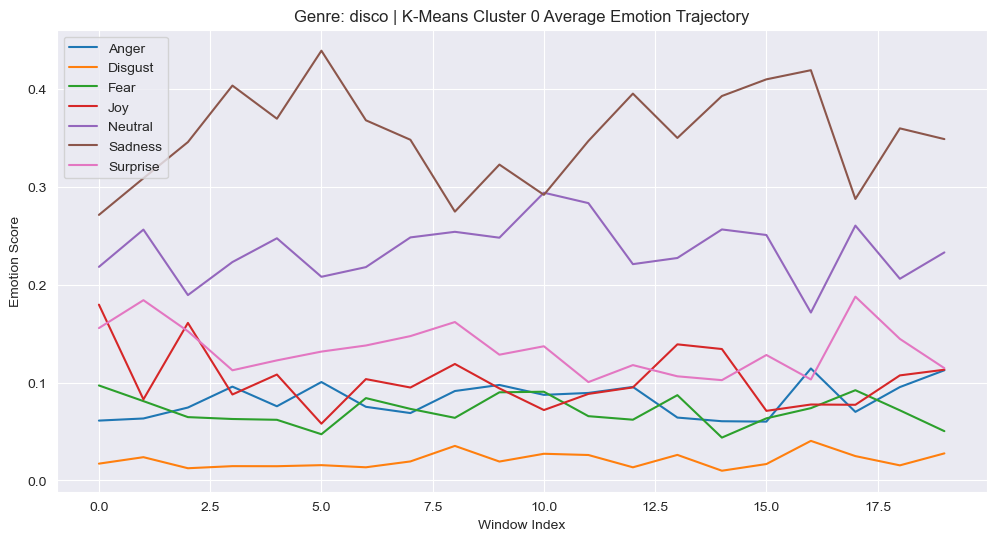

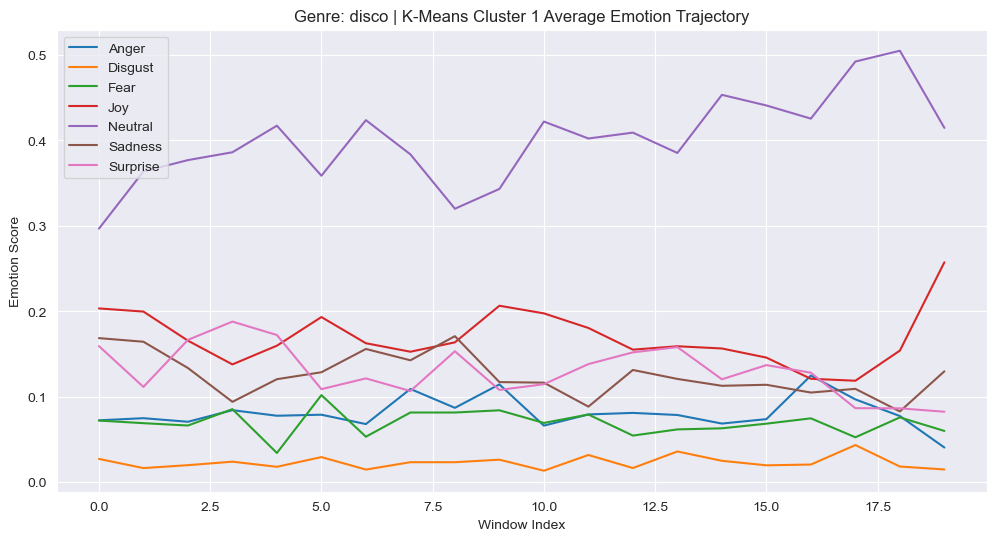

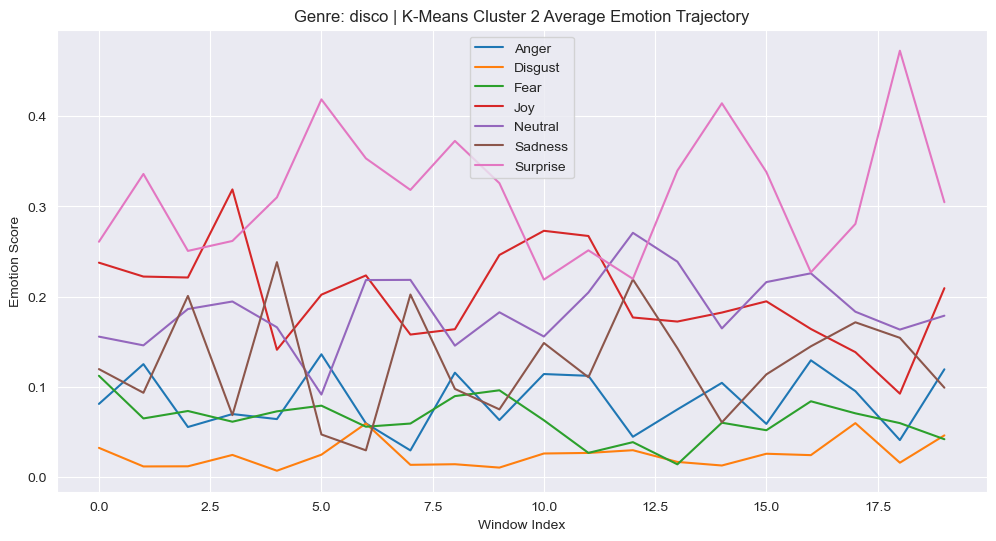

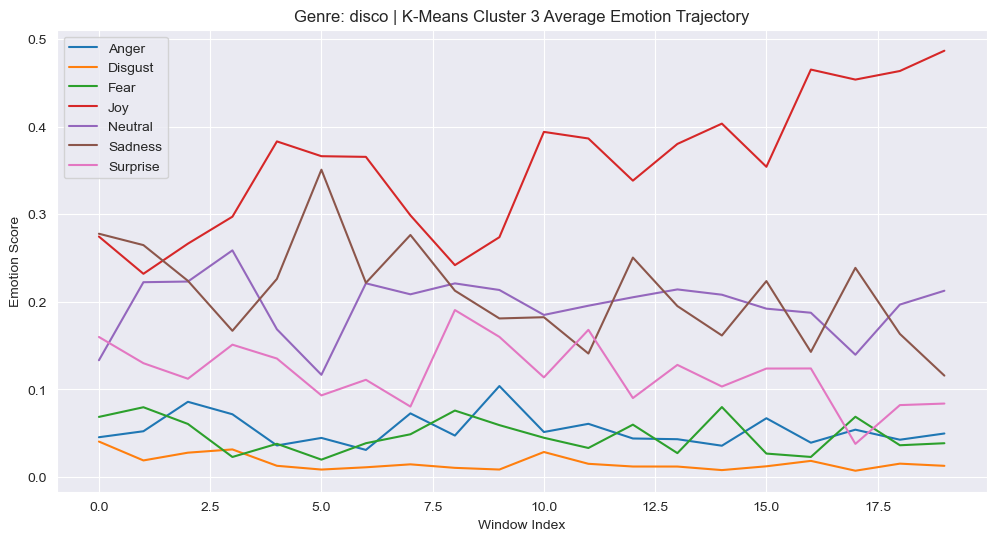

In [30]:
# dictionaries to store data specifically for K-Means DTW
kmeans_time_series = {}
kmeans_songs = {}
kmeans_clusters = {}
genre_cluster_songs = {}  # dictionary to store songs for each cluster in each genre

# prepare time series data 
for genre in top_genres:
    print(f"Preparing data for K-Means clustering on genre: {genre}")
    genre_df = train_df[train_df['genre'] == genre].copy()
    
    # filter out songs with 0 popularity
    genre_df = genre_df[genre_df['popularity'] > 0]
    
    # prepare using the original genre_df with 'window_index'
    ts_array, songs = prepare_time_series(genre_df, sentiment_columns, n_windows=20)
    if ts_array.size == 0:
        print(f"No complete songs found for genre: {genre}")
        continue
    kmeans_time_series[genre] = ts_array
    kmeans_songs[genre] = songs
    
    song_df = pd.DataFrame({'song_artist': songs})

# perform K-Means clustering using DTW 
for genre in top_genres:
    if genre not in kmeans_time_series:
        continue
    
    ts_data_kmeans = kmeans_time_series[genre]  
    k_optimal_kmeans = optimal_k_values.get(genre, 5) 
    
    # TimeSeriesKMeans with DTW metric
    kmeans_model = TimeSeriesKMeans(n_clusters=k_optimal_kmeans, metric="dtw", max_iter=10, random_state=0, n_jobs=-1)
    kmeans_labels = kmeans_model.fit_predict(ts_data_kmeans)  # Perform clustering on the time series data
    unique_clusters = np.unique(kmeans_labels)
    
    print(f"\nEvaluating K-Means Clustering for Genre: {genre}")
    evaluate_clusters(ts_data_kmeans, kmeans_labels)

    kmeans_clusters[genre] = kmeans_labels 
    
    # combine song_artist and cluster labels into df
    cluster_df = pd.DataFrame({
        'song_artist': kmeans_songs[genre],
        'cluster': kmeans_labels
    })
    
    # group songs by cluster and store in dictionary
    cluster_songs = cluster_df.groupby('cluster')['song_artist'].apply(list).to_dict()
    genre_cluster_songs[genre] = cluster_songs 

# visualization
for genre in top_genres:
    if genre not in kmeans_time_series or genre not in kmeans_clusters:
        continue
    print(f"Visualizing K-Means clusters for genre: {genre}")
    
    ts_data_kmeans = kmeans_time_series[genre]
    kmeans_labels = kmeans_clusters[genre]
    songs_kmeans = kmeans_songs[genre]
    
    cluster_df_kmeans = pd.DataFrame({
        'song_artist': songs_kmeans,
        'cluster': kmeans_labels
    })
    
    # plot cluster distribution
    plt.figure(figsize=(10, 6))
    sns.countplot(data=cluster_df_kmeans, x='cluster')
    plt.title(f'K-Means Cluster Distribution for Genre: {genre}')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Songs')
    plt.show()
    
    # plot avg emotional trajectories 
    print(k_optimal_kmeans)
    print(f' {genre} ')
    for cluster in range(k_optimal_kmeans + 1):
        cluster_indices = np.where(kmeans_labels == cluster)[0]
        if len(cluster_indices) == 0:
            continue
        avg_trajectory = ts_data_kmeans[cluster_indices].mean(axis=0)  # Shape: (20, 7)
        plt.figure(figsize=(12, 6))
        for i, emotion in enumerate(sentiment_columns):
            plt.plot(range(20), avg_trajectory[:, i], label=emotion.capitalize())
        plt.title(f'Genre: {genre} | K-Means Cluster {cluster} Average Emotion Trajectory')
        plt.xlabel('Window Index')
        plt.ylabel('Emotion Score')
        plt.legend()
        plt.show()

In [31]:
# calculate average popularity for each genre from the entire dataset and clusters
unique_genre_popularity_df = full_df[['genre', 'song_artist', 'popularity']].drop_duplicates()
genre_overall_popularity = unique_genre_popularity_df.groupby('genre')['popularity'].mean()
genre_cluster_popularity = {}

for genre, clusters in genre_cluster_songs.items():
    genre_cluster_popularity[genre] = {}  
    
    for cluster, songs in clusters.items():
        cluster_songs_popularity = unique_genre_popularity_df[
            (unique_genre_popularity_df['genre'] == genre) &
            (unique_genre_popularity_df['song_artist'].isin(songs))
        ]
        
        # calculate the mean popularity for the cluster
        avg_popularity = cluster_songs_popularity['popularity'].mean()
        
        genre_cluster_popularity[genre][cluster] = avg_popularity
        
# display average popularity for each cluster and compare to overall genre popularity
for genre, clusters in genre_cluster_popularity.items():
    overall_avg = genre_overall_popularity[genre]
    print(f"\nAverage Popularity per Cluster for Genre: {genre} (Overall Genre Popularity: {overall_avg:.2f})")
    for cluster, avg_pop in clusters.items():
        print(f"  Cluster {cluster + 1}: {avg_pop:.2f} (Difference from Genre Average: {avg_pop - overall_avg:.2f})")


Average Popularity per Cluster for Genre: dance (Overall Genre Popularity: 41.24)
  Cluster 1: 40.29 (Difference from Genre Average: -0.94)
  Cluster 2: 42.65 (Difference from Genre Average: 1.41)
  Cluster 3: 42.07 (Difference from Genre Average: 0.84)
  Cluster 4: 41.85 (Difference from Genre Average: 0.61)
  Cluster 5: 42.51 (Difference from Genre Average: 1.28)

Average Popularity per Cluster for Genre: alt-rock (Overall Genre Popularity: 37.88)
  Cluster 1: 40.70 (Difference from Genre Average: 2.83)
  Cluster 2: 37.82 (Difference from Genre Average: -0.06)
  Cluster 3: 38.23 (Difference from Genre Average: 0.36)
  Cluster 4: 35.99 (Difference from Genre Average: -1.89)

Average Popularity per Cluster for Genre: hard-rock (Overall Genre Popularity: 20.90)
  Cluster 1: 23.56 (Difference from Genre Average: 2.66)
  Cluster 2: 20.50 (Difference from Genre Average: -0.40)
  Cluster 3: 21.30 (Difference from Genre Average: 0.40)
  Cluster 4: 19.59 (Difference from Genre Average: -1.30

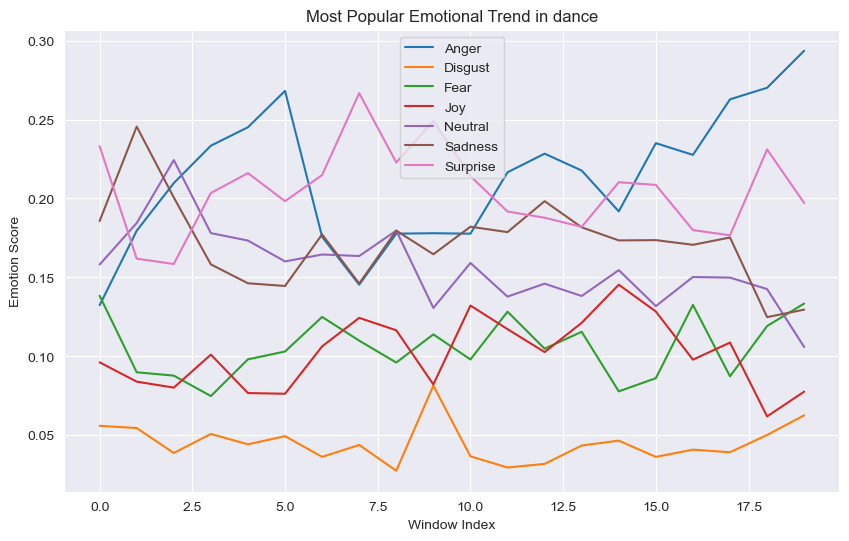

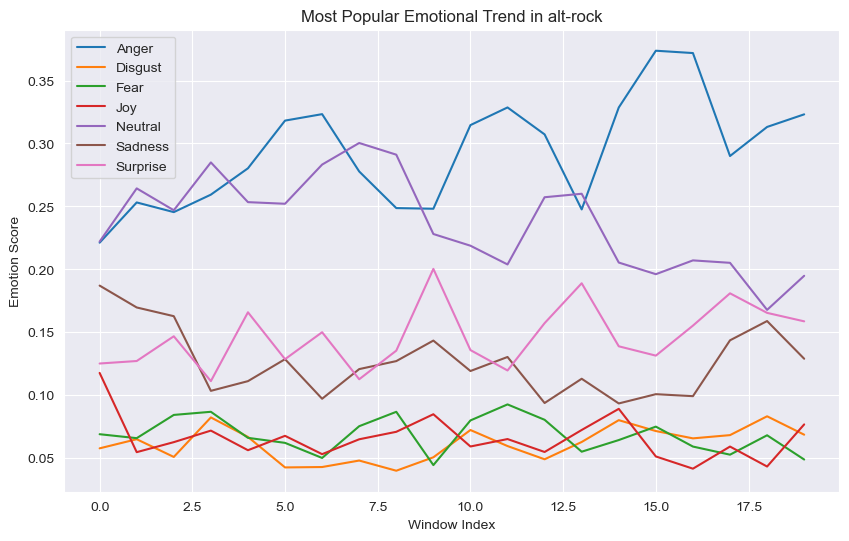

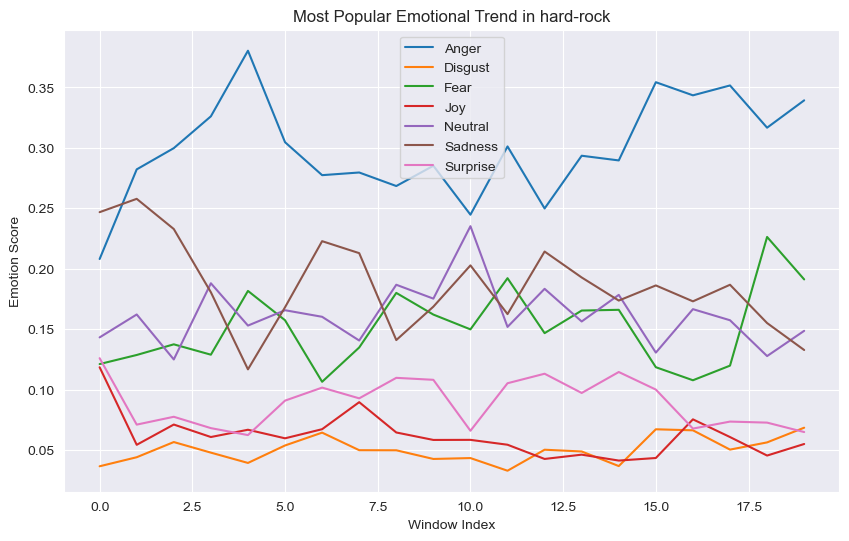

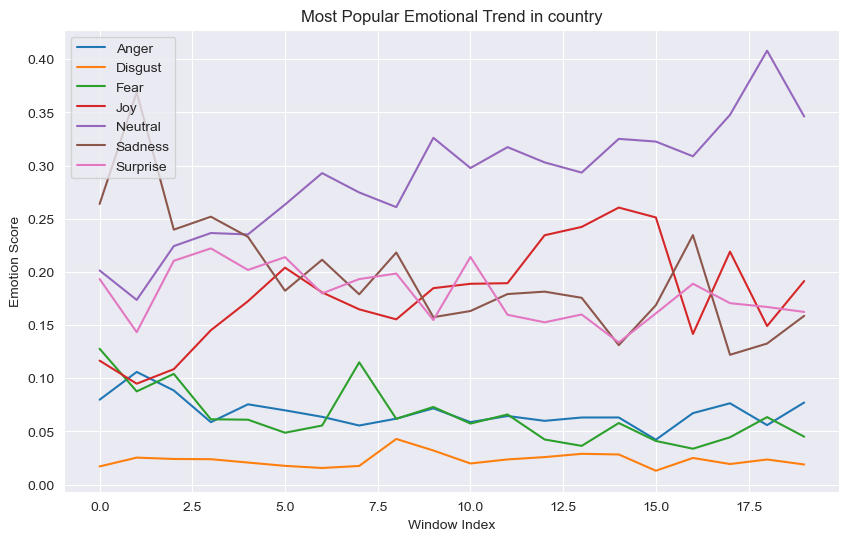

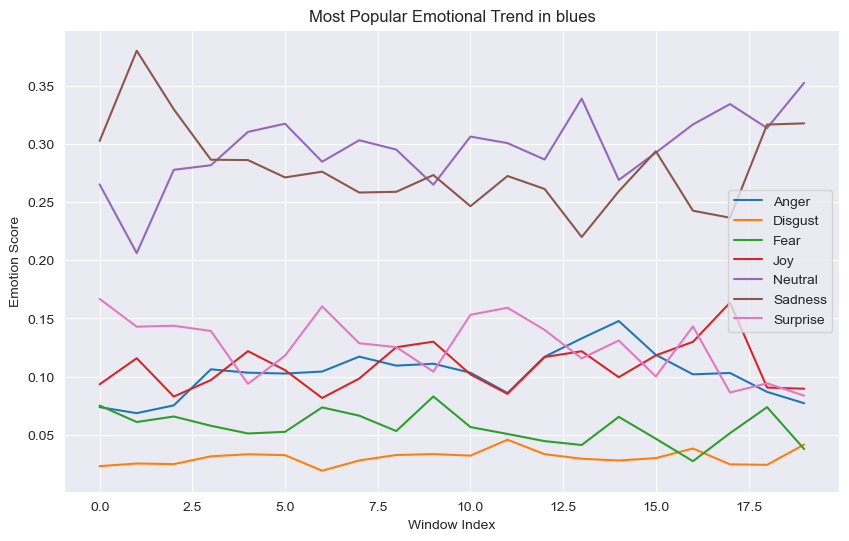

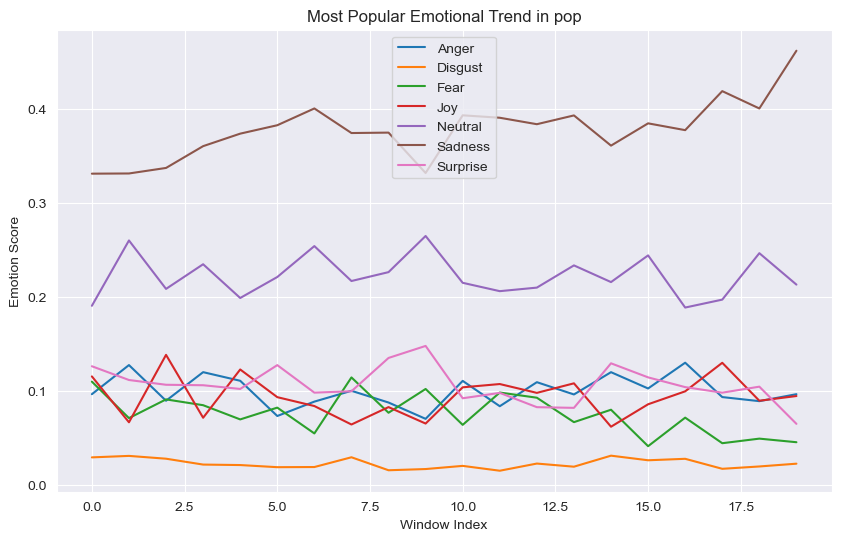

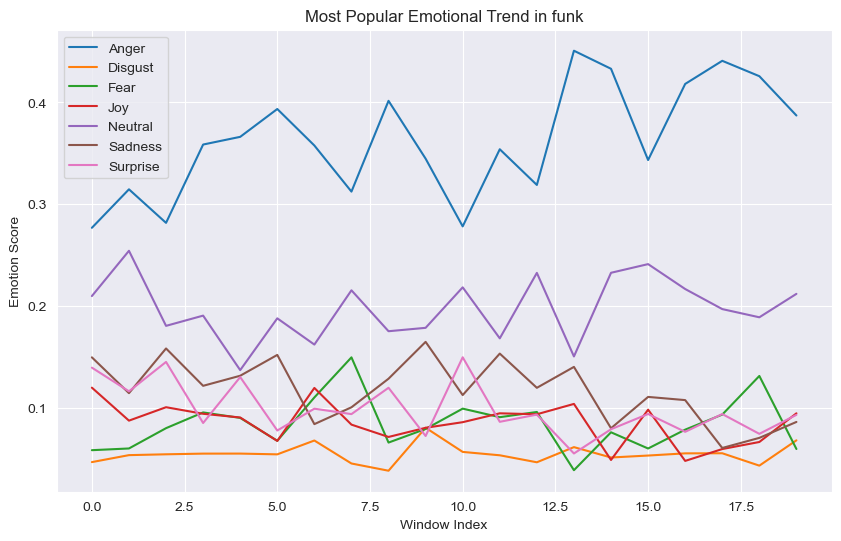

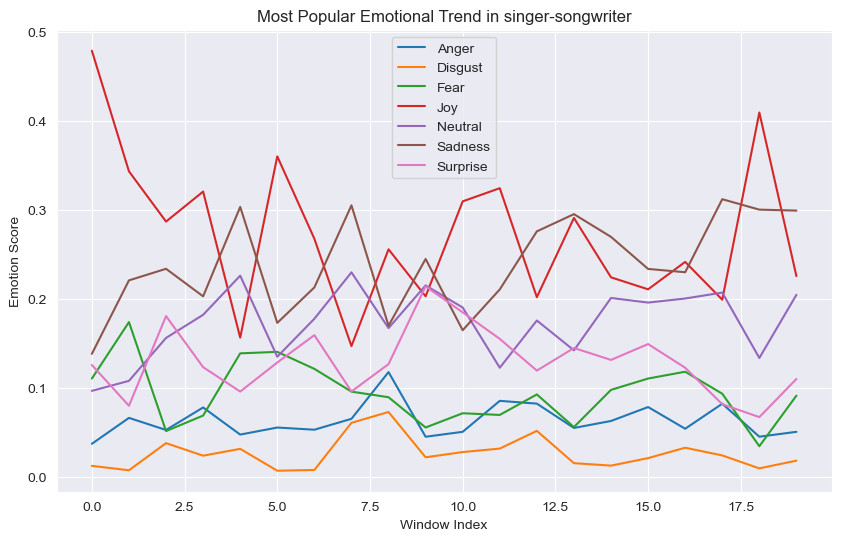

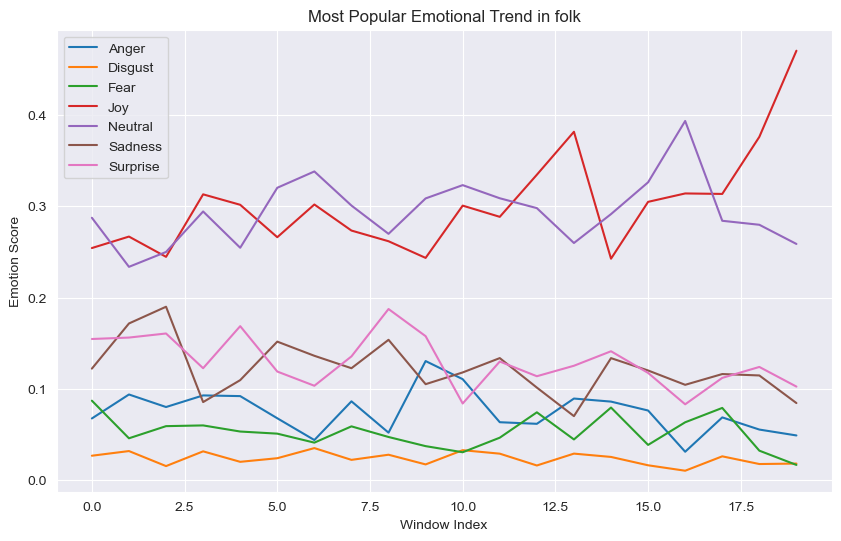

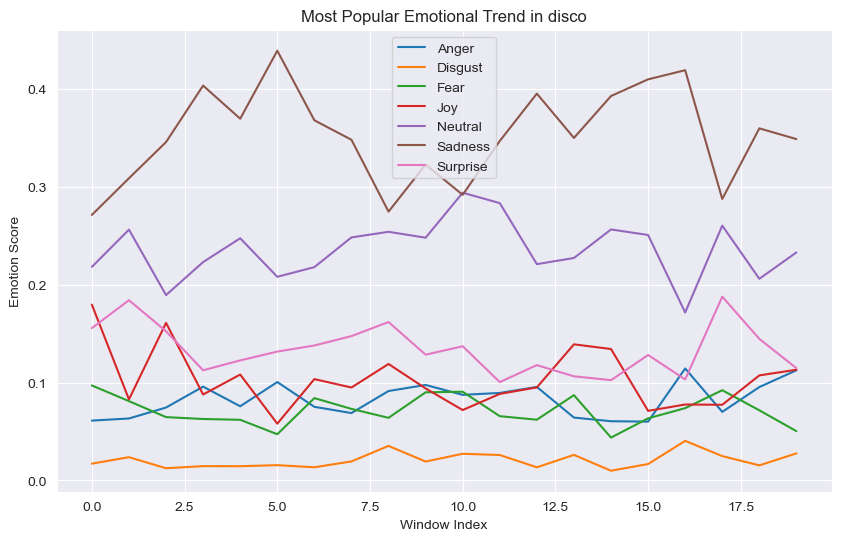

In [32]:
# trying to plot each genre's most popular emotional trajectory
most_popular_trends = {}

# identify the most popular cluster for each genre and extract its average emotional trajectory
for genre, clusters in genre_cluster_popularity.items():
    # find the cluster with the highest average popularity within the genre
    most_popular_cluster = max(clusters, key=clusters.get)
    popular_songs = genre_cluster_songs[genre][most_popular_cluster]
    
    # calculate the average emotional trajectory 
    ts_data_kmeans = kmeans_time_series[genre]
    kmeans_labels = kmeans_clusters[genre]
    cluster_indices = [i for i, song in enumerate(kmeans_songs[genre]) if song in popular_songs]
    avg_trajectory = ts_data_kmeans[cluster_indices].mean(axis=0)  # Shape: (20, 7)
    
    # store the result
    most_popular_trends[genre] = avg_trajectory

# plot
for genre, avg_trajectory in most_popular_trends.items():
    plt.figure(figsize=(10, 6))
    for j, emotion in enumerate(sentiment_columns):
        plt.plot(range(20), avg_trajectory[:, j], label=emotion.capitalize())
    plt.title(f'Most Popular Emotional Trend in {genre}')
    plt.xlabel('Window Index')
    plt.ylabel('Emotion Score')
    plt.legend()
    plt.show()


In [33]:
# Filter test_df for top genres and valid popularity scores, and keep only unique songs
filtered_test_df = test_df[(test_df['genre'].isin(top_genres)) & (test_df['popularity'] > 0)]
unique_test_df = filtered_test_df.drop_duplicates(subset=['song_artist']).copy()

# Re-fit OneHotEncoder on top genres without column names
genre_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
genres = np.array(top_genres).reshape(-1, 1)  # Reshape to fit encoder input
genre_encoder.fit(genres)  # Fit encoder without column names

# Encode genre as a one-hot vector for each genre in `unique_test_df`
testing_data = pd.DataFrame({
    'Song Title': unique_test_df['song_artist'],
    'Genre Encoded': list(genre_encoder.transform(unique_test_df[['genre']].to_numpy())),  # Convert genre to numpy before transforming
    'Actual Popularity': unique_test_df['popularity']
})

# Process time series data for each unique song and add flattened features
X_test_emotion = []
for song_id in unique_test_df['song_artist'].unique():
    song_df = filtered_test_df[filtered_test_df['song_artist'] == song_id]
    song_emotion_data = prepare_time_series(song_df, sentiment_columns, n_windows=20)[0]
    flattened_emotion_data = song_emotion_data.flatten()  # Flatten the 20x7 data to 1D
    
    X_test_emotion.append(flattened_emotion_data)

# Ensure `X_test_emotion` has the same length as `unique_test_df`
testing_data['Emotion Features'] = X_test_emotion

In [34]:
def evaluate_kmeans_clusters(ts_data_kmeans, kmeans_labels):
    # Ensure data is in the correct shape for clustering metrics (e.g., 2D for silhouette score)
    data_2d = np.array([series.flatten() for series in ts_data_kmeans])
    
    # Calculate Silhouette Score
    silhouette_avg = silhouette_score(data_2d, kmeans_labels)
    print(f'Silhouette Score: {silhouette_avg:.4f}')
    
    # Calculate Calinski-Harabasz Score
    calinski_harabasz_avg = calinski_harabasz_score(data_2d, kmeans_labels)
    print(f'Calinski-Harabasz Index: {calinski_harabasz_avg:.4f}')
    
    # Calculate Davies-Bouldin Score
    davies_bouldin_avg = davies_bouldin_score(data_2d, kmeans_labels)
    print(f'Davies-Bouldin Index: {davies_bouldin_avg:.4f}')
    
# Example usage with your k-means model
kmeans_model = TimeSeriesKMeans(n_clusters=k_optimal_kmeans, metric="dtw").fit(ts_data_kmeans)
evaluate_kmeans_clusters(ts_data_kmeans, kmeans_model.labels_)
# honestly, these scores are expected given that these clusters already broken up by genre...

Silhouette Score: 0.0304
Calinski-Harabasz Index: 7.0297
Davies-Bouldin Index: 4.5657
